In [1]:
import numpy as np
import os
import datetime as datetime
import pandas as pd


os.system('source /home/jackalak/heartbeat/cdf38_0-dist/bin/definitions.B')
os.environ["CDF_LIB"] = '/home/jackalak/heartbeat/cdf38_0-dist/lib'
from spacepy import pycdf
import matplotlib.pyplot as plt


import numpy as np
import pandas as pd
from datetime import timedelta

from nasaomnireader import omnireader

import ftplib
import os


import numpy as np
import os
import datetime as datetime
import pandas as pd





import pickle
import glob



import tensorflow as tf
from tensorflow import keras


import datetime

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import tensorflow

import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout
from sklearn import preprocessing


from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import datetime
from os.path import isfile, join
from sys import getsizeof
import glob

from random import *

import matplotlib.pyplot as plt
%matplotlib notebook

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras.layers import Input

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/nasaomnireader-0.1.0-py3.6.egg/nasaomnireader/__init__.py", line 5, in <module>
    from nasaomnireader.omnireader_config import config
ModuleNotFoundError: No module named 'nasaomnireader.omnireader_config'

Solar wind data files will be saved to /home/jackalak/.local/share/nasaomnireader


In [10]:

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
test = pd.DataFrame()

for ii in [17,18,6,7,8,9,12,13,14,15,16,]:

    filescname = "./sc_df_cleaned_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 

    test =pd.concat([test,pickle.load(pickle_file)] )
    
# filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
# pickle_file = open(filescname, "rb") 
# test =pickle.load(pickle_file)
print(test.columns.tolist())

['ELE_AVG_ENERGY', 'ELE_AVG_ENERGY_STD', 'ELE_TOTAL_ENERGY_FLUX', 'ELE_TOTAL_ENERGY_FLUX_STD', 'SC_AACGM_LAT', 'SC_AACGM_LON', 'SC_AACGM_LTIME', 'ELE_TOTAL_COUNTS', 'ELE_COUNT_1', 'ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19', 'ELE_diff_1', 'ELE_diff_2', 'ELE_diff_3', 'ELE_diff_4', 'ELE_diff_5', 'ELE_diff_6', 'ELE_diff_7', 'ELE_diff_8', 'ELE_diff_9', 'ELE_diff_10', 'ELE_diff_11', 'ELE_diff_12', 'ELE_diff_13', 'ELE_diff_14', 'ELE_diff_15', 'ELE_diff_16', 'ELE_diff_17', 'ELE_diff_18', 'ELE_diff_19', 'Bz', 'By', 'Vsw', 'Vx', 'Psw', 'AE', 'AL', 'AU', 'SymH', 'Clock Angle', 'newell', 'borovsky', 'Kp', 'F107', 'PC', 'Bx', 'Bz_6hr', 'By_6hr', 'Vsw_6hr', 'Vx_6hr', 'Psw_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'Clock Angle_6hr', 'newell_6hr', 'borovsky_6hr', 

In [29]:

def plot_model_counts(df_results):
    
    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = np.min(y_val_log.values)
    maxr = np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
    plt.title('Errors over SC_AACGM_LAT Bins')


    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/bin_total
    plt.figure()
    plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over SC_AACGM_LAT Bins')
    plt.show()
    
    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(y_val_log.values,errors,s=1)
    plt.title('Errors over target Bins')

    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((y_val_log[j]-0)/((8-0)/200))
        if (i < 200) and(i > 0):
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/(bin_total+.00001)
    plt.figure()
    plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over target Bins')    
    plt.show()

    import matplotlib.colors as mcolors
    gamma = 0.2#[0.8, 0.5, 0.3]
    errors= y_val_log.values-df_results.values[:,0]

    plt.figure();
    plt.hist2d(y_val_log.values, errors,
                  bins=50, norm=mcolors.PowerNorm(gamma))
    plt.colorbar()
    plt.title('Error Density')
    plt.xlabel('log10(y_true)')
    plt.ylabel('log10(y_true-y_pred)')

    plt.show()

In [34]:

def plot_model(df_results):
    
    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = np.min(y_val_log.values)
    maxr = np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
    plt.title('Errors over SC_AACGM_LAT Bins')


    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/bin_total
    plt.figure()
    plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over SC_AACGM_LAT Bins')
    plt.show()
    
    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(y_val_log.values,errors,s=1)
    plt.title('Errors over target Bins')

    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((y_val_log[j]-6)/((14-6)/200))
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/(bin_total+.00001)
    plt.figure()
    plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over target Bins')    
    plt.show()

    import matplotlib.colors as mcolors
    gamma = 0.2#[0.8, 0.5, 0.3]
    errors= y_val_log.values-df_results.values[:,0]

    plt.figure();
    plt.hist2d(y_val_log.values, errors,
                  bins=50, norm=mcolors.PowerNorm(gamma))
    plt.colorbar()
    plt.title('Error Density')
    plt.xlabel('log10(y_true)')
    plt.ylabel('log10(y_true-y_pred)')

    plt.show()

In [38]:
# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]

df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative




# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
#print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 148)]             0         
_________________________________________________________________
dense_36 (Dense)             (None, 256)               38144     
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_37 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_38 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_39 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_40 (Dense)             (None, 1024)             

Epoch 70/1000
188/188 - 5s - loss: 0.5068 - mse: 0.5068 - val_loss: 0.6429 - val_mse: 0.6429
Epoch 71/1000
188/188 - 5s - loss: 0.5072 - mse: 0.5072 - val_loss: 0.6365 - val_mse: 0.6365
Epoch 72/1000
188/188 - 5s - loss: 0.5061 - mse: 0.5061 - val_loss: 0.6299 - val_mse: 0.6299
Epoch 73/1000
188/188 - 5s - loss: 0.5048 - mse: 0.5048 - val_loss: 0.6311 - val_mse: 0.6311
Epoch 74/1000
188/188 - 5s - loss: 0.5054 - mse: 0.5054 - val_loss: 0.6342 - val_mse: 0.6342
Epoch 75/1000
188/188 - 5s - loss: 0.5039 - mse: 0.5039 - val_loss: 0.6282 - val_mse: 0.6282
Epoch 76/1000
188/188 - 5s - loss: 0.5036 - mse: 0.5036 - val_loss: 0.6259 - val_mse: 0.6259
Epoch 77/1000
188/188 - 5s - loss: 0.5031 - mse: 0.5031 - val_loss: 0.6270 - val_mse: 0.6270
Epoch 78/1000
188/188 - 5s - loss: 0.5036 - mse: 0.5036 - val_loss: 0.6278 - val_mse: 0.6278
Epoch 79/1000
188/188 - 5s - loss: 0.5021 - mse: 0.5021 - val_loss: 0.6273 - val_mse: 0.6273
Epoch 80/1000
188/188 - 5s - loss: 0.5017 - mse: 0.5017 - val_loss: 0.

Epoch 158/1000
188/188 - 6s - loss: 0.4818 - mse: 0.4818 - val_loss: 0.6025 - val_mse: 0.6025
Epoch 159/1000
188/188 - 5s - loss: 0.4821 - mse: 0.4821 - val_loss: 0.5994 - val_mse: 0.5994
Epoch 160/1000
188/188 - 5s - loss: 0.4823 - mse: 0.4823 - val_loss: 0.6055 - val_mse: 0.6055
Epoch 161/1000
188/188 - 5s - loss: 0.4811 - mse: 0.4811 - val_loss: 0.5942 - val_mse: 0.5942
Epoch 162/1000
188/188 - 5s - loss: 0.4811 - mse: 0.4811 - val_loss: 0.6068 - val_mse: 0.6068
Epoch 163/1000
188/188 - 5s - loss: 0.4814 - mse: 0.4814 - val_loss: 0.5998 - val_mse: 0.5998
Epoch 164/1000
188/188 - 5s - loss: 0.4817 - mse: 0.4817 - val_loss: 0.5997 - val_mse: 0.5997
Epoch 165/1000
188/188 - 5s - loss: 0.4809 - mse: 0.4809 - val_loss: 0.5973 - val_mse: 0.5973
Epoch 166/1000
188/188 - 5s - loss: 0.4811 - mse: 0.4811 - val_loss: 0.5960 - val_mse: 0.5960
Epoch 167/1000
188/188 - 5s - loss: 0.4808 - mse: 0.4808 - val_loss: 0.5954 - val_mse: 0.5954
Epoch 168/1000
188/188 - 5s - loss: 0.4805 - mse: 0.4805 - v

188/188 - 5s - loss: 0.4723 - mse: 0.4723 - val_loss: 0.5875 - val_mse: 0.5875
Epoch 246/1000
188/188 - 6s - loss: 0.4721 - mse: 0.4721 - val_loss: 0.5884 - val_mse: 0.5884
Epoch 247/1000
188/188 - 6s - loss: 0.4722 - mse: 0.4722 - val_loss: 0.5872 - val_mse: 0.5872
Epoch 248/1000
188/188 - 6s - loss: 0.4722 - mse: 0.4722 - val_loss: 0.5884 - val_mse: 0.5884
Epoch 249/1000
188/188 - 5s - loss: 0.4726 - mse: 0.4726 - val_loss: 0.5871 - val_mse: 0.5871
Epoch 250/1000
188/188 - 5s - loss: 0.4721 - mse: 0.4721 - val_loss: 0.5887 - val_mse: 0.5887
Epoch 251/1000
188/188 - 5s - loss: 0.4718 - mse: 0.4718 - val_loss: 0.5866 - val_mse: 0.5866
Epoch 252/1000
188/188 - 5s - loss: 0.4715 - mse: 0.4715 - val_loss: 0.5908 - val_mse: 0.5908
Epoch 253/1000
188/188 - 5s - loss: 0.4719 - mse: 0.4719 - val_loss: 0.5878 - val_mse: 0.5878
Epoch 254/1000
188/188 - 5s - loss: 0.4717 - mse: 0.4717 - val_loss: 0.5847 - val_mse: 0.5847
Epoch 255/1000
188/188 - 5s - loss: 0.4718 - mse: 0.4718 - val_loss: 0.5859

Epoch 333/1000
188/188 - 5s - loss: 0.4668 - mse: 0.4668 - val_loss: 0.5856 - val_mse: 0.5856
Epoch 334/1000
188/188 - 6s - loss: 0.4660 - mse: 0.4660 - val_loss: 0.5835 - val_mse: 0.5835
Epoch 335/1000
188/188 - 5s - loss: 0.4664 - mse: 0.4664 - val_loss: 0.5826 - val_mse: 0.5826
Epoch 336/1000
188/188 - 5s - loss: 0.4664 - mse: 0.4664 - val_loss: 0.5897 - val_mse: 0.5897
Epoch 337/1000
188/188 - 5s - loss: 0.4661 - mse: 0.4661 - val_loss: 0.5854 - val_mse: 0.5854
Epoch 338/1000
188/188 - 5s - loss: 0.4663 - mse: 0.4663 - val_loss: 0.5842 - val_mse: 0.5842
Epoch 339/1000
188/188 - 6s - loss: 0.4660 - mse: 0.4660 - val_loss: 0.5842 - val_mse: 0.5842
Epoch 340/1000
188/188 - 5s - loss: 0.4664 - mse: 0.4664 - val_loss: 0.5841 - val_mse: 0.5841
Epoch 341/1000
188/188 - 5s - loss: 0.4661 - mse: 0.4661 - val_loss: 0.5876 - val_mse: 0.5876
Epoch 342/1000
188/188 - 5s - loss: 0.4659 - mse: 0.4659 - val_loss: 0.5821 - val_mse: 0.5821
Epoch 343/1000
188/188 - 5s - loss: 0.4662 - mse: 0.4662 - v

188/188 - 5s - loss: 0.4625 - mse: 0.4625 - val_loss: 0.5848 - val_mse: 0.5848
Epoch 421/1000
188/188 - 6s - loss: 0.4624 - mse: 0.4624 - val_loss: 0.5840 - val_mse: 0.5840
Epoch 422/1000
188/188 - 5s - loss: 0.4627 - mse: 0.4627 - val_loss: 0.5879 - val_mse: 0.5879
Epoch 423/1000
188/188 - 5s - loss: 0.4626 - mse: 0.4626 - val_loss: 0.5851 - val_mse: 0.5851
Epoch 424/1000
188/188 - 5s - loss: 0.4623 - mse: 0.4623 - val_loss: 0.5866 - val_mse: 0.5866
Epoch 425/1000
188/188 - 5s - loss: 0.4620 - mse: 0.4620 - val_loss: 0.5840 - val_mse: 0.5840
Epoch 426/1000
188/188 - 5s - loss: 0.4621 - mse: 0.4621 - val_loss: 0.5846 - val_mse: 0.5846
Epoch 427/1000
188/188 - 5s - loss: 0.4622 - mse: 0.4622 - val_loss: 0.5848 - val_mse: 0.5848
Epoch 428/1000
188/188 - 5s - loss: 0.4623 - mse: 0.4623 - val_loss: 0.5844 - val_mse: 0.5844
Epoch 429/1000
188/188 - 5s - loss: 0.4624 - mse: 0.4624 - val_loss: 0.5861 - val_mse: 0.5861
Epoch 430/1000
188/188 - 5s - loss: 0.4622 - mse: 0.4622 - val_loss: 0.5836

Epoch 508/1000
188/188 - 5s - loss: 0.4594 - mse: 0.4594 - val_loss: 0.5858 - val_mse: 0.5858
Epoch 509/1000
188/188 - 5s - loss: 0.4594 - mse: 0.4594 - val_loss: 0.5858 - val_mse: 0.5858
Epoch 510/1000
188/188 - 5s - loss: 0.4595 - mse: 0.4595 - val_loss: 0.5866 - val_mse: 0.5866
Epoch 511/1000
188/188 - 5s - loss: 0.4602 - mse: 0.4602 - val_loss: 0.5889 - val_mse: 0.5889
Epoch 512/1000
188/188 - 5s - loss: 0.4593 - mse: 0.4593 - val_loss: 0.5905 - val_mse: 0.5905
Epoch 513/1000
188/188 - 5s - loss: 0.4594 - mse: 0.4594 - val_loss: 0.5887 - val_mse: 0.5887
Epoch 514/1000
188/188 - 6s - loss: 0.4591 - mse: 0.4591 - val_loss: 0.5898 - val_mse: 0.5898


<IPython.core.display.Javascript object>


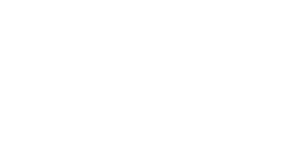

<IPython.core.display.Javascript object>


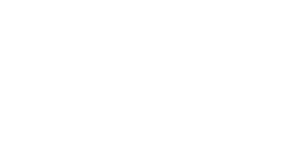

<IPython.core.display.Javascript object>


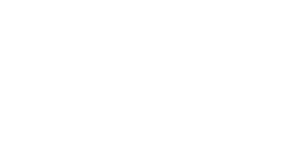

<IPython.core.display.Javascript object>


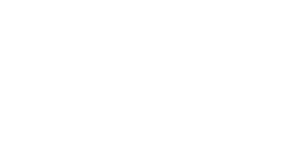

<IPython.core.display.Javascript object>


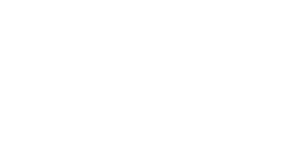

<IPython.core.display.Javascript object>


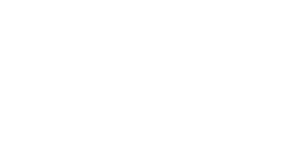

<IPython.core.display.Javascript object>


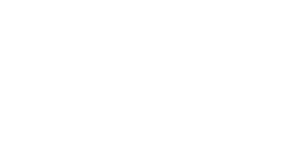

<IPython.core.display.Javascript object>


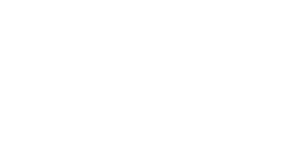

<IPython.core.display.Javascript object>


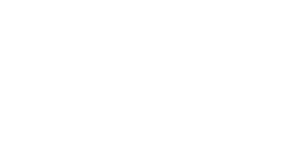

<IPython.core.display.Javascript object>


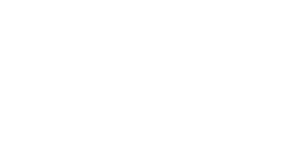

<IPython.core.display.Javascript object>


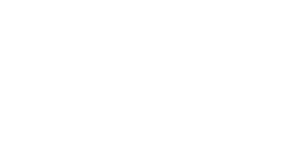

In [42]:
### UNCOMMENT TO RETRAIN
# 
# num_in = 148

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(1, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.0002),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=100)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results

# plot_model(df_results)

5357/5357 [==============================] - 4s 774us/step - loss: 0.5814 - mean_squared_error: 0.5814
[0.5814309120178223, 0.5814309120178223]


<IPython.core.display.Javascript object>


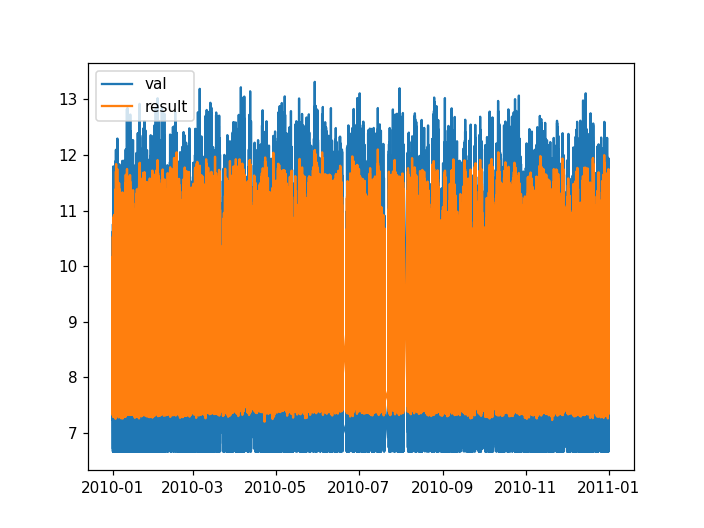

<IPython.core.display.Javascript object>


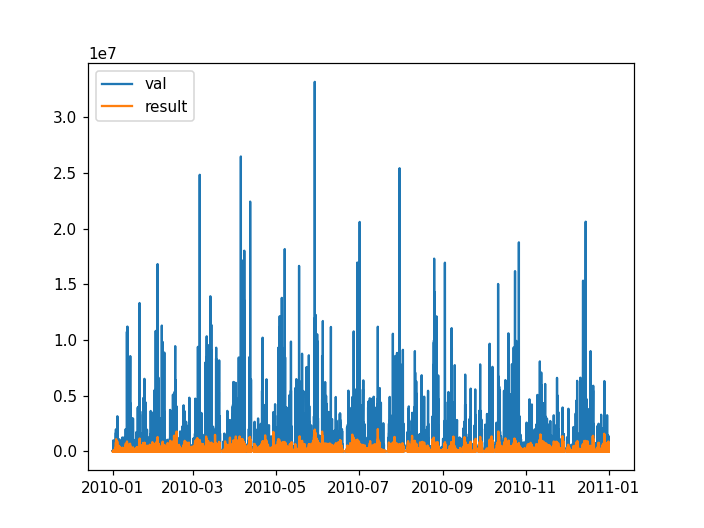

<IPython.core.display.Javascript object>


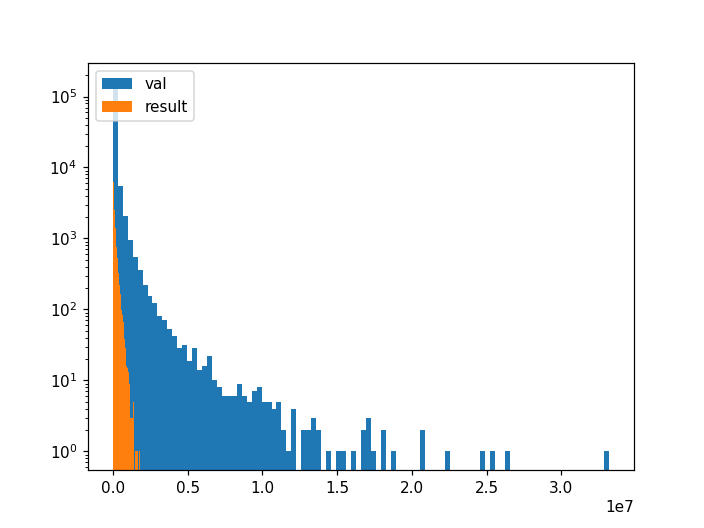

<IPython.core.display.Javascript object>


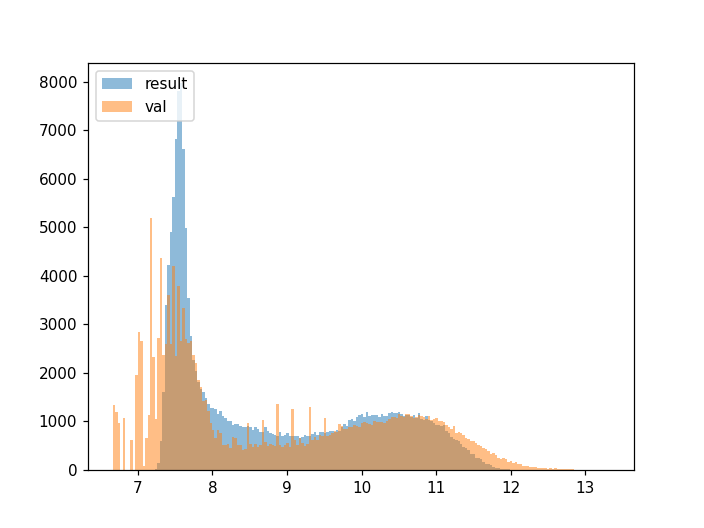

<IPython.core.display.Javascript object>


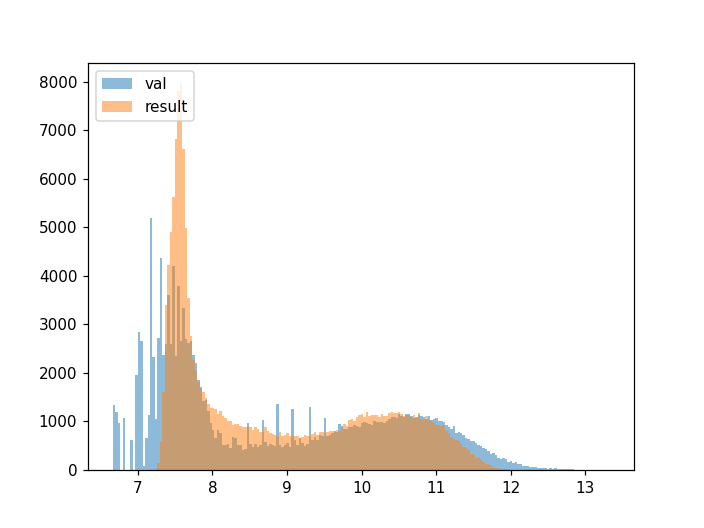

<IPython.core.display.Javascript object>


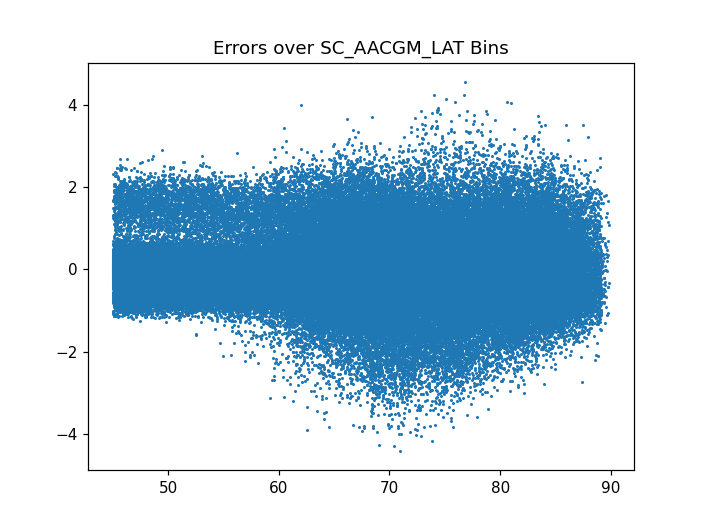

<IPython.core.display.Javascript object>


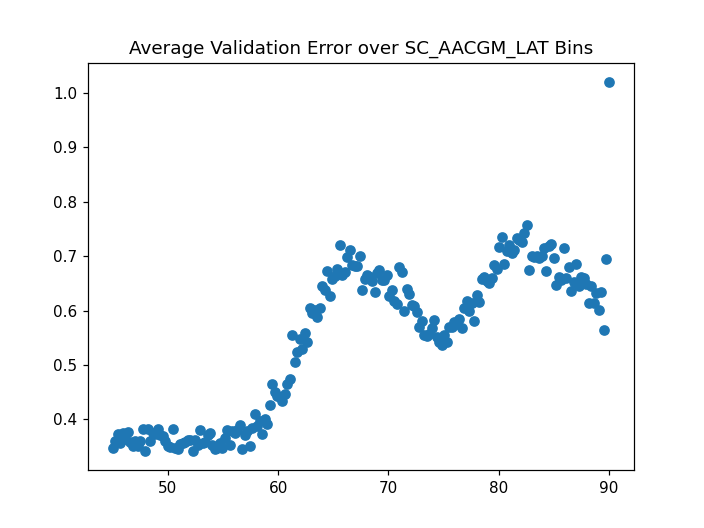

<IPython.core.display.Javascript object>


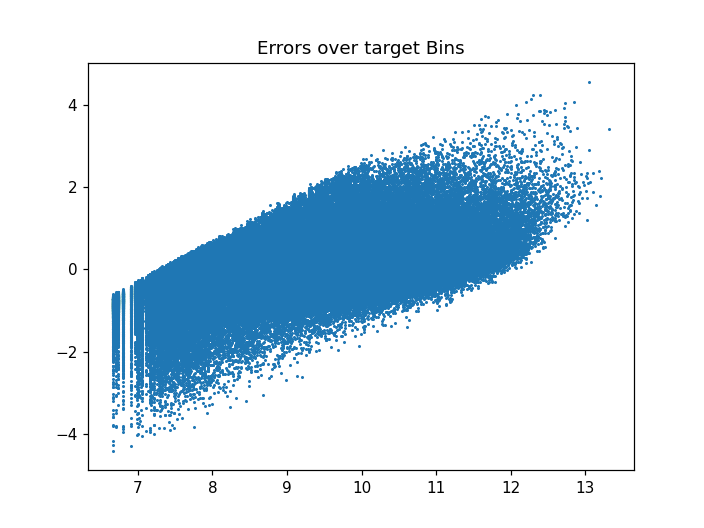

<IPython.core.display.Javascript object>


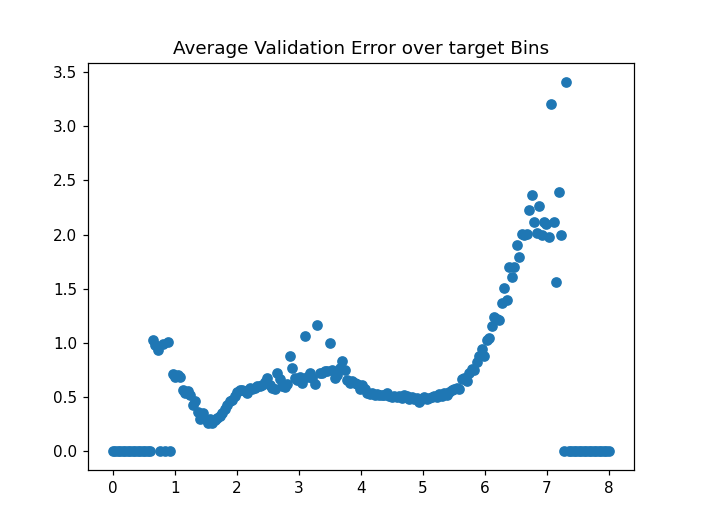

<IPython.core.display.Javascript object>


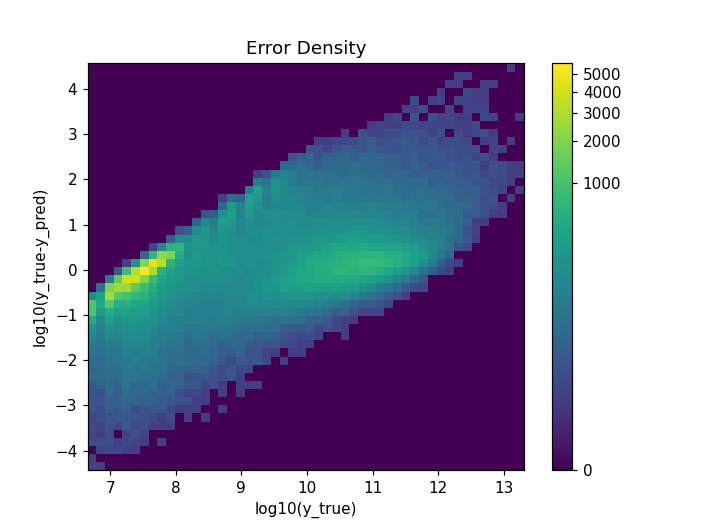

In [39]:
filename='model_3_new_DB'
# model.save(filename)
# with open ('scalar_X_148_new_DB.pkl', 'wb') as f:
#   pickle.dump(scaler_X, f)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})
with open ('scalar_X_148_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

model = tensorflow.keras.models.load_model(filename)

results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model(df_results)

In [36]:
# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
cols_to_drop = [c for c in df_cumulative.columns if ('1min' in c) | ('3min' in c) | ('4min' in c) | ('_5min'in c) | ('15min' in c)| ('5hr' in c) | ('F107_' in c) | ('Vx' in c) | ('AE' in c) | ('newell' in c) | ('borovsky' in c) | ('STD' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop)

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,11.5),'float32')*K.cast(K.less_equal(y_pred,11.5),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,12.),'float32')*K.cast(K.less_equal(y_pred,12.0),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.5),'float32')*K.cast(K.less_equal(y_pred,12.5),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.75),'float32')*K.cast(K.less_equal(y_pred,12.75),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,13.),'float32')*K.cast(K.less_equal(y_pred,13.),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

['SC_AACGM_LAT', 'Bz', 'By', 'Vsw', 'Psw', 'AL', 'AU', 'SymH', 'F107', 'PC', 'Bx', 'Bz_6hr', 'By_6hr', 'Vsw_6hr', 'Psw_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'PC_6hr', 'Bx_6hr', 'Bz_3hr', 'By_3hr', 'Vsw_3hr', 'Psw_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'PC_3hr', 'Bx_3hr', 'Bz_1hr', 'By_1hr', 'Vsw_1hr', 'Psw_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'Bx_1hr', 'Bz_45min', 'By_45min', 'Vsw_45min', 'Psw_45min', 'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'Bx_45min', 'Bz_30min', 'By_30min', 'Vsw_30min', 'Psw_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 'PC_30min', 'Bx_30min', 'Bz_10min', 'By_10min', 'Vsw_10min', 'Psw_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'PC_10min', 'Bx_10min', 'SC_ID', 'cos_SC_AACGM_LTIME', 'sin_SC_AACGM_LTIME', 'sin_doy', 'cos_doy', 'sin_ut', 'cos_ut']


Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 72)]              0         
_________________________________________________________________
dense (Dense)                (None, 256)               18688     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                16448     
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               8448      
_________________________________________________________________
dense_4 (Dense)              (None, 1024)             

Epoch 70/4000
188/188 - 4s - loss: 0.8195 - mse: 0.5755 - val_loss: 0.8018 - val_mse: 0.6395
Epoch 71/4000
188/188 - 4s - loss: 0.8181 - mse: 0.5740 - val_loss: 0.7981 - val_mse: 0.6560
Epoch 72/4000
188/188 - 4s - loss: 0.8184 - mse: 0.5743 - val_loss: 0.8017 - val_mse: 0.6533
Epoch 73/4000
188/188 - 4s - loss: 0.8160 - mse: 0.5729 - val_loss: 0.8094 - val_mse: 0.6612
Epoch 74/4000
188/188 - 4s - loss: 0.8201 - mse: 0.5759 - val_loss: 0.8101 - val_mse: 0.6544
Epoch 75/4000
188/188 - 4s - loss: 0.8165 - mse: 0.5729 - val_loss: 0.7996 - val_mse: 0.6497
Epoch 76/4000
188/188 - 4s - loss: 0.8136 - mse: 0.5712 - val_loss: 0.8000 - val_mse: 0.6521
Epoch 77/4000
188/188 - 4s - loss: 0.8137 - mse: 0.5719 - val_loss: 0.8142 - val_mse: 0.6406
Epoch 78/4000
188/188 - 4s - loss: 0.8153 - mse: 0.5732 - val_loss: 0.8049 - val_mse: 0.6522
Epoch 79/4000
188/188 - 4s - loss: 0.8138 - mse: 0.5722 - val_loss: 0.8022 - val_mse: 0.6535
Epoch 80/4000
188/188 - 4s - loss: 0.8139 - mse: 0.5718 - val_loss: 0.

Epoch 158/4000
188/188 - 4s - loss: 0.7917 - mse: 0.5640 - val_loss: 0.7838 - val_mse: 0.6398
Epoch 159/4000
188/188 - 4s - loss: 0.7881 - mse: 0.5607 - val_loss: 0.7862 - val_mse: 0.6381
Epoch 160/4000
188/188 - 4s - loss: 0.7883 - mse: 0.5597 - val_loss: 0.7882 - val_mse: 0.6296
Epoch 161/4000
188/188 - 5s - loss: 0.7900 - mse: 0.5620 - val_loss: 0.7832 - val_mse: 0.6391
Epoch 162/4000
188/188 - 5s - loss: 0.7888 - mse: 0.5621 - val_loss: 0.7867 - val_mse: 0.6308
Epoch 163/4000
188/188 - 5s - loss: 0.7888 - mse: 0.5606 - val_loss: 0.7914 - val_mse: 0.6267
Epoch 164/4000
188/188 - 4s - loss: 0.7898 - mse: 0.5618 - val_loss: 0.7896 - val_mse: 0.6427
Epoch 165/4000
188/188 - 4s - loss: 0.7876 - mse: 0.5610 - val_loss: 0.8031 - val_mse: 0.6259
Epoch 166/4000
188/188 - 4s - loss: 0.7852 - mse: 0.5604 - val_loss: 0.7872 - val_mse: 0.6328
Epoch 167/4000
188/188 - 4s - loss: 0.7871 - mse: 0.5607 - val_loss: 0.7912 - val_mse: 0.6354
Epoch 168/4000
188/188 - 4s - loss: 0.7860 - mse: 0.5603 - v

<IPython.core.display.Javascript object>


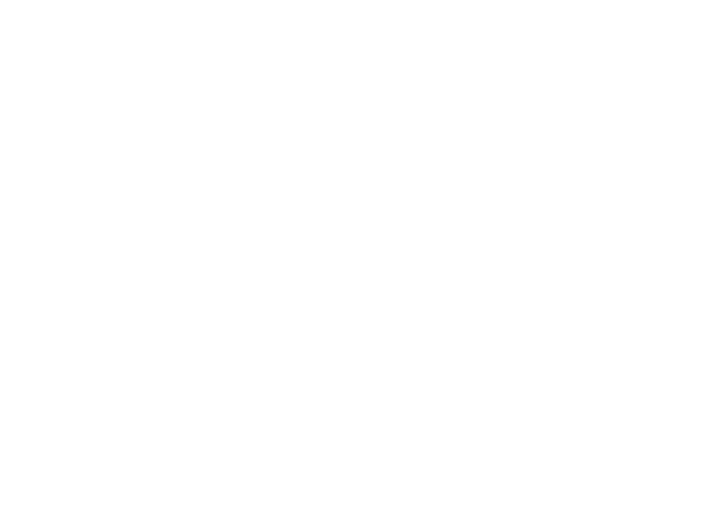

<IPython.core.display.Javascript object>


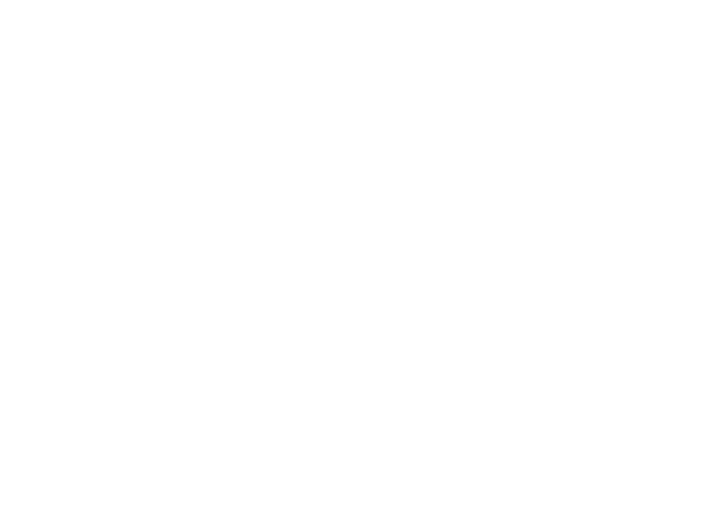

<IPython.core.display.Javascript object>


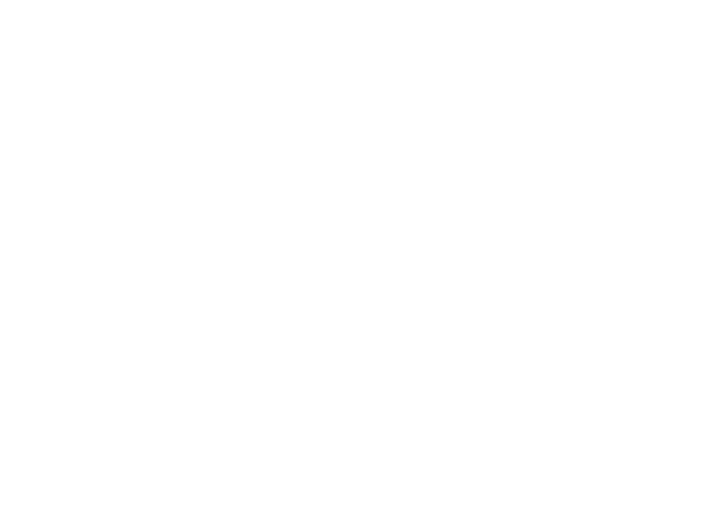

<IPython.core.display.Javascript object>


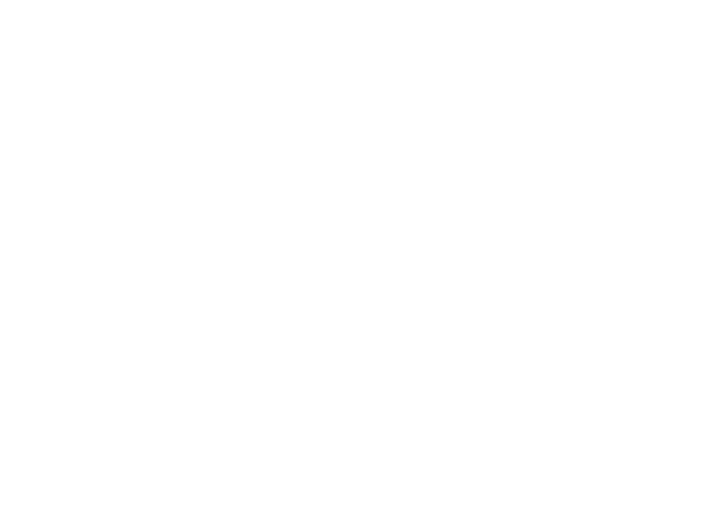

<IPython.core.display.Javascript object>


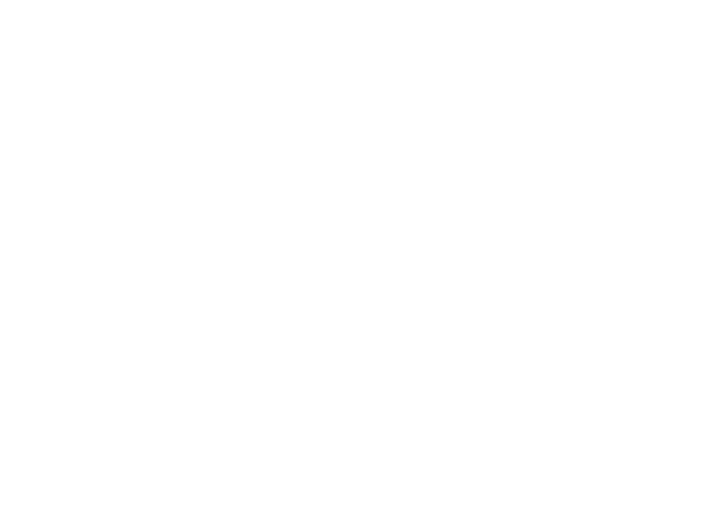

<IPython.core.display.Javascript object>


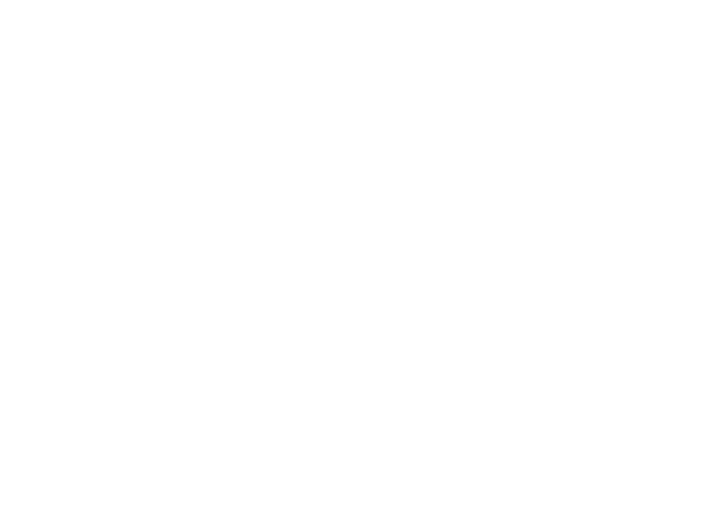

<IPython.core.display.Javascript object>


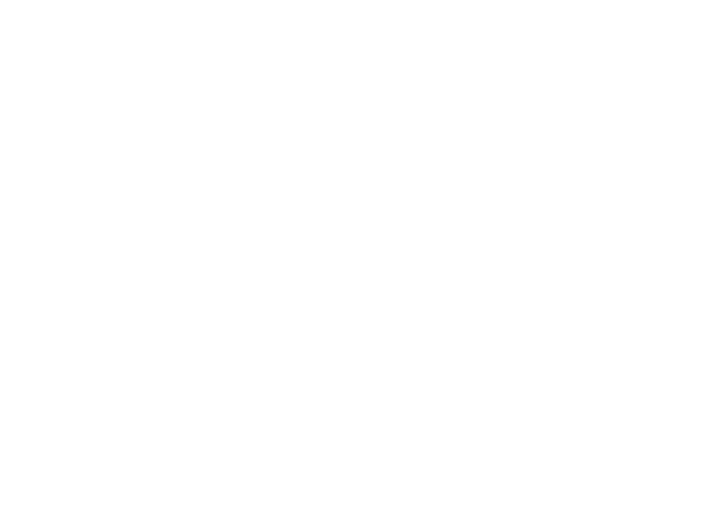

<IPython.core.display.Javascript object>


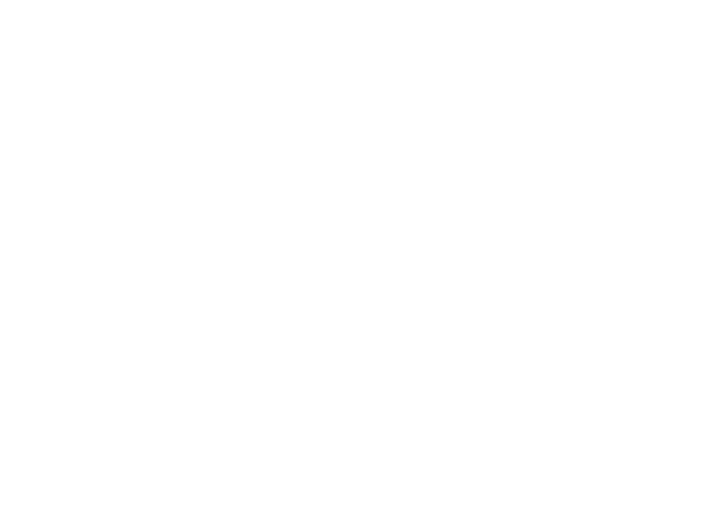

<IPython.core.display.Javascript object>


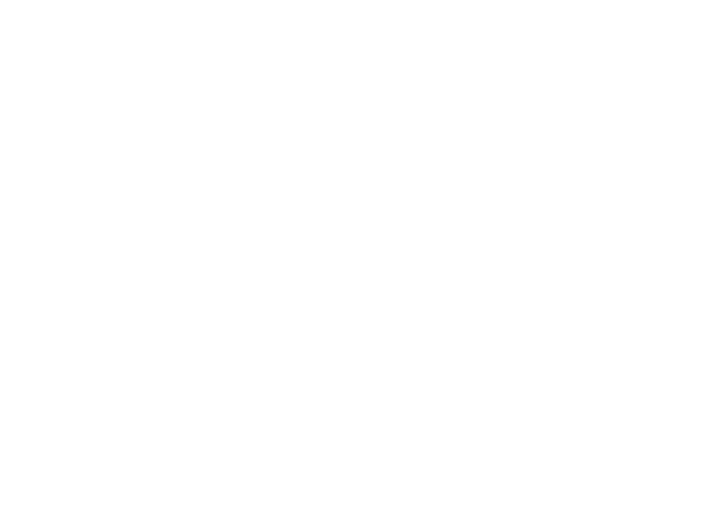

<IPython.core.display.Javascript object>


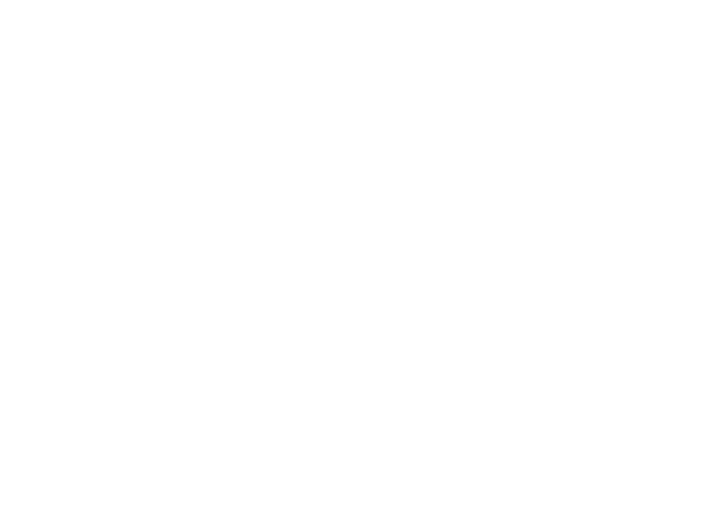

<IPython.core.display.Javascript object>


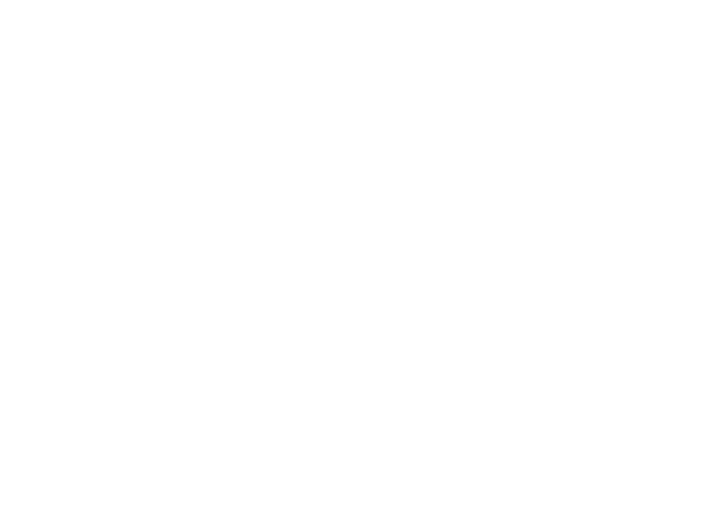

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: tail_loss_new_pipeline2_reduced/assets


NameError: name 'X_tes' is not defined

In [23]:



num_in = 72

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=100)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

tail_loss_new_pipeline2_reduced = df_results

plot_model(df_results)

filename='tail_loss_new_pipeline2_reduced'
model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

print(model.evaluate(X_test,y_val_log.values))



5357/5357 [==============================] - 4s 804us/step - loss: 0.7787 - mean_squared_error: 0.6361
[0.7787137031555176, 0.6361232995986938]


<IPython.core.display.Javascript object>


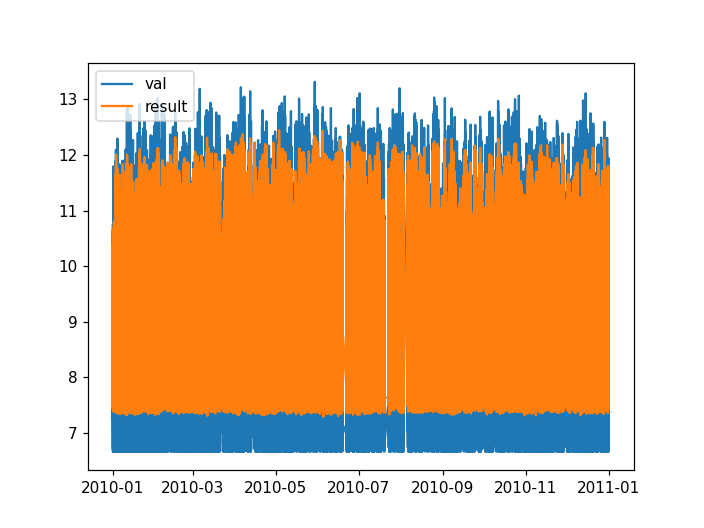

<IPython.core.display.Javascript object>


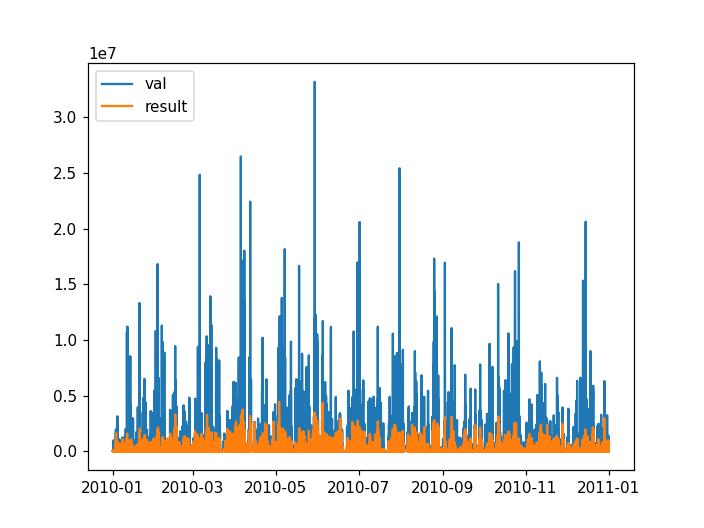

<IPython.core.display.Javascript object>


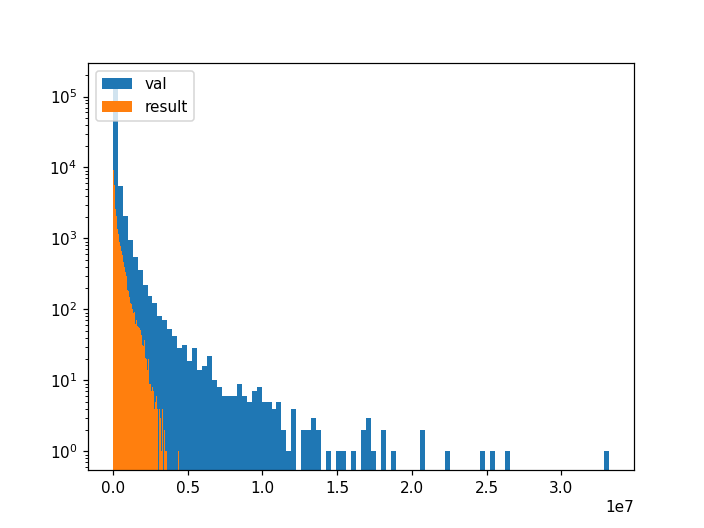

<IPython.core.display.Javascript object>


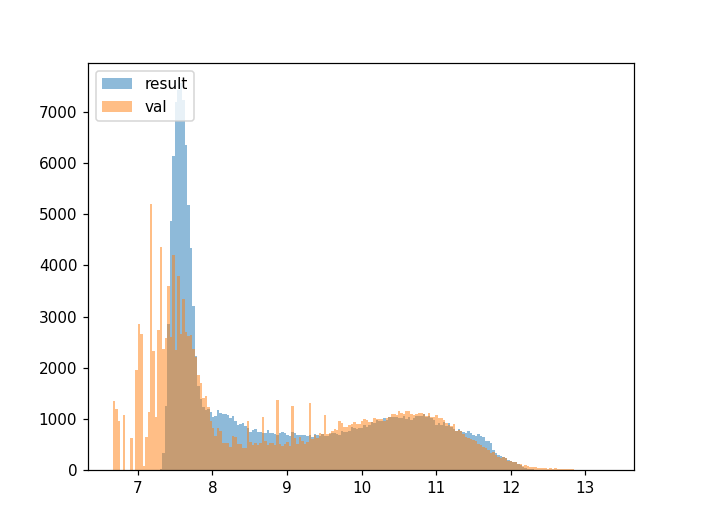

<IPython.core.display.Javascript object>


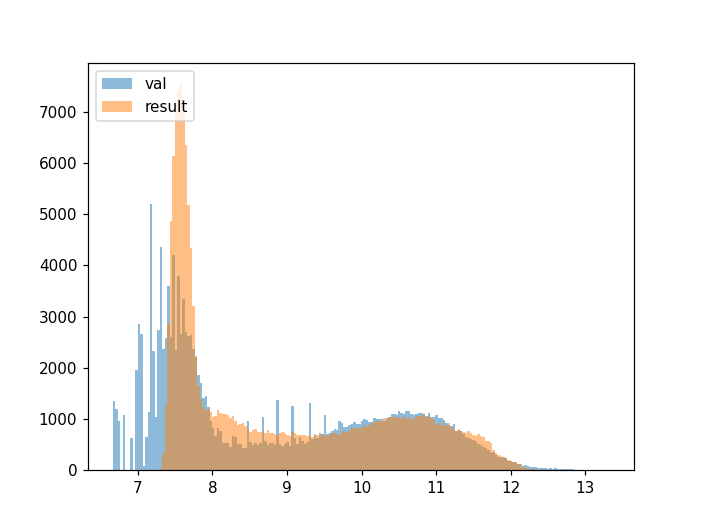

<IPython.core.display.Javascript object>


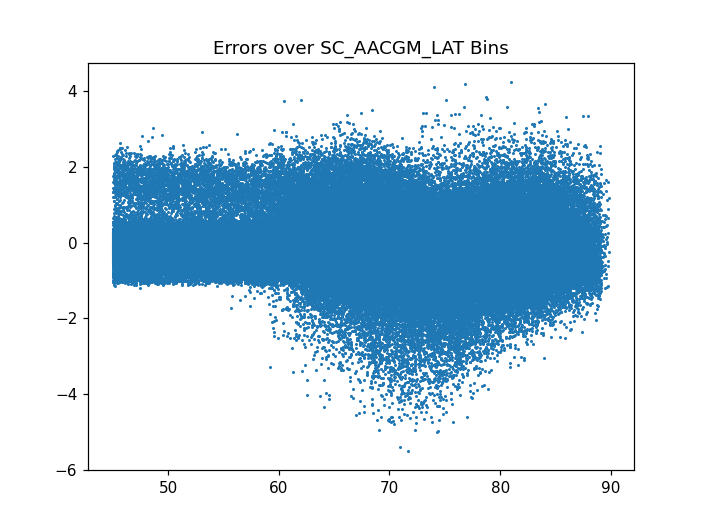

<IPython.core.display.Javascript object>


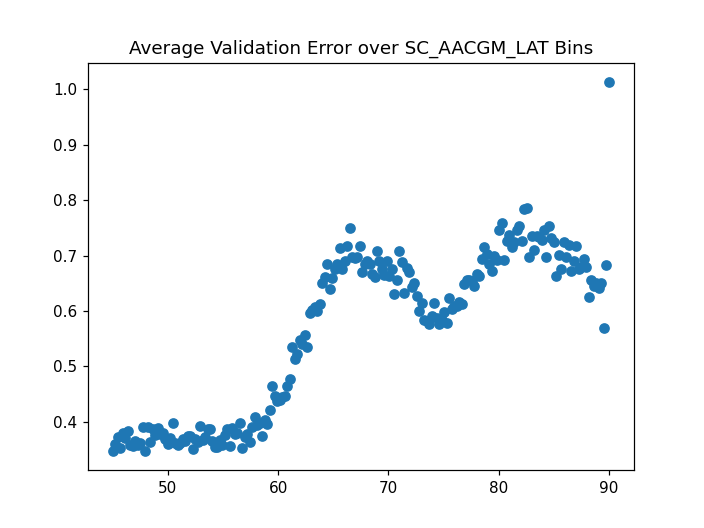

<IPython.core.display.Javascript object>


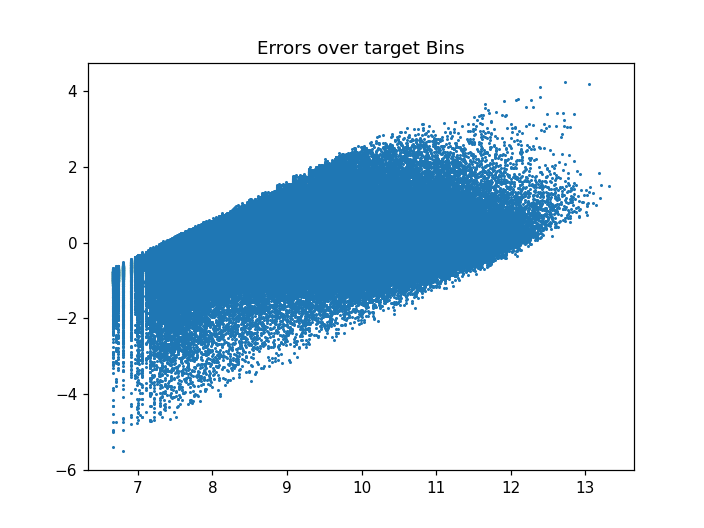

<IPython.core.display.Javascript object>


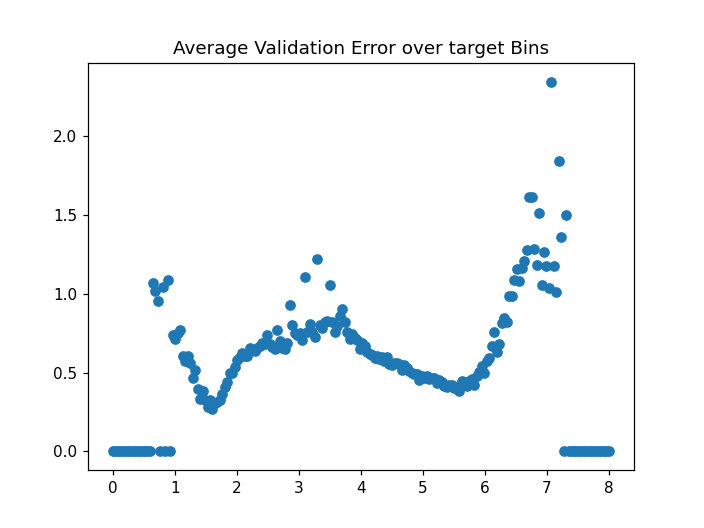

<IPython.core.display.Javascript object>


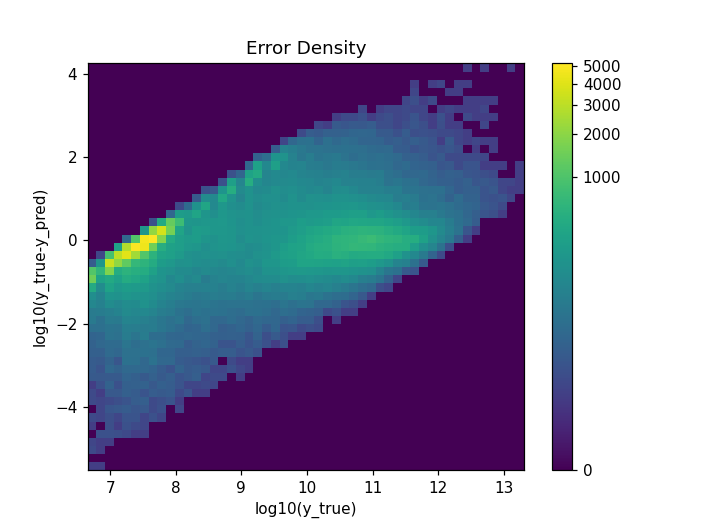

In [37]:


filename='tail_loss_new_pipeline_72'
# model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

# with open ('scalar_X_72_new_DB.pkl', 'wb') as f:
#   pickle.dump(scaler_X, f)

with open ('scalar_X_72_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)


plot_model(df_results)

In [32]:

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_ENERGY_FLUX', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
                             'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'F107_45min', 'AE_45min', 'AL_45min', 'AU_45min', 
                             'SymH_45min', 'PC_45min', 'F107_30min', 'AE_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 
                             'F107_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 
                             'F107_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'F107_5min', 'AE_5min', 'AL_5min', 
                             'AU_5min', 'SymH_5min']]

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,11.5),'float32')*K.cast(K.less_equal(y_pred,11.5),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,12.),'float32')*K.cast(K.less_equal(y_pred,12.0),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.5),'float32')*K.cast(K.less_equal(y_pred,12.5),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.75),'float32')*K.cast(K.less_equal(y_pred,12.75),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,13.),'float32')*K.cast(K.less_equal(y_pred,13.),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

['SC_AACGM_LAT', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'AE', 'AL', 'AU', 'SymH', 'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'F107_45min', 'AE_45min', 'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'F107_30min', 'AE_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 'F107_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 'F107_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'F107_5min', 'AE_5min', 'AL_5min', 'AU_5min', 'SymH_5min']


Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 59)]              0         
_________________________________________________________________
dense_9 (Dense)              (None, 256)               15360     
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_11 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_12 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_13 (Dense)             (None, 1024)             

Epoch 70/4000
188/188 - 4s - loss: 0.8726 - mse: 0.6077 - val_loss: 0.8835 - val_mse: 0.7472
Epoch 71/4000
188/188 - 4s - loss: 0.8745 - mse: 0.6098 - val_loss: 0.8852 - val_mse: 0.7337
Epoch 72/4000
188/188 - 4s - loss: 0.8716 - mse: 0.6077 - val_loss: 0.8954 - val_mse: 0.7533
Epoch 73/4000
188/188 - 4s - loss: 0.8719 - mse: 0.6070 - val_loss: 0.8985 - val_mse: 0.7143
Epoch 74/4000
188/188 - 4s - loss: 0.8687 - mse: 0.6050 - val_loss: 0.8918 - val_mse: 0.7637
Epoch 75/4000
188/188 - 4s - loss: 0.8674 - mse: 0.6046 - val_loss: 0.8706 - val_mse: 0.7254
Epoch 76/4000
188/188 - 4s - loss: 0.8685 - mse: 0.6053 - val_loss: 0.8865 - val_mse: 0.7193
Epoch 77/4000
188/188 - 4s - loss: 0.8683 - mse: 0.6058 - val_loss: 0.8607 - val_mse: 0.6875
Epoch 78/4000
188/188 - 4s - loss: 0.8675 - mse: 0.6051 - val_loss: 0.8608 - val_mse: 0.7012
Epoch 79/4000
188/188 - 4s - loss: 0.8686 - mse: 0.6060 - val_loss: 0.8722 - val_mse: 0.7170
Epoch 80/4000
188/188 - 4s - loss: 0.8668 - mse: 0.6038 - val_loss: 0.

Epoch 158/4000
188/188 - 4s - loss: 0.8474 - mse: 0.5988 - val_loss: 0.8506 - val_mse: 0.6865
Epoch 159/4000
188/188 - 4s - loss: 0.8444 - mse: 0.5973 - val_loss: 0.8525 - val_mse: 0.6971
Epoch 160/4000
188/188 - 4s - loss: 0.8458 - mse: 0.5979 - val_loss: 0.8507 - val_mse: 0.7091
Epoch 161/4000
188/188 - 4s - loss: 0.8461 - mse: 0.5984 - val_loss: 0.8552 - val_mse: 0.6753
Epoch 162/4000
188/188 - 4s - loss: 0.8448 - mse: 0.5966 - val_loss: 0.8500 - val_mse: 0.7039
Epoch 163/4000
188/188 - 4s - loss: 0.8457 - mse: 0.5986 - val_loss: 0.8502 - val_mse: 0.6946
Epoch 164/4000
188/188 - 4s - loss: 0.8449 - mse: 0.5978 - val_loss: 0.8498 - val_mse: 0.6880
Epoch 165/4000
188/188 - 4s - loss: 0.8430 - mse: 0.5965 - val_loss: 0.8446 - val_mse: 0.6871
Epoch 166/4000
188/188 - 4s - loss: 0.8465 - mse: 0.5990 - val_loss: 0.8571 - val_mse: 0.6808
Epoch 167/4000
188/188 - 4s - loss: 0.8449 - mse: 0.5961 - val_loss: 0.8464 - val_mse: 0.7012
Epoch 168/4000
188/188 - 4s - loss: 0.8420 - mse: 0.5959 - v

<IPython.core.display.Javascript object>


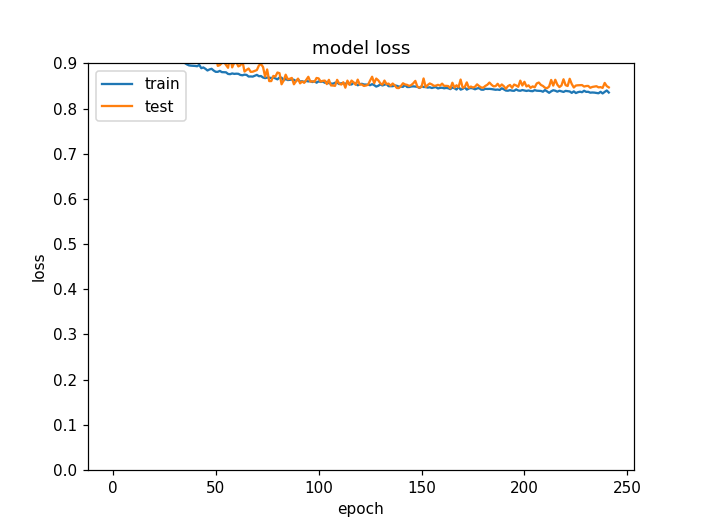

<IPython.core.display.Javascript object>


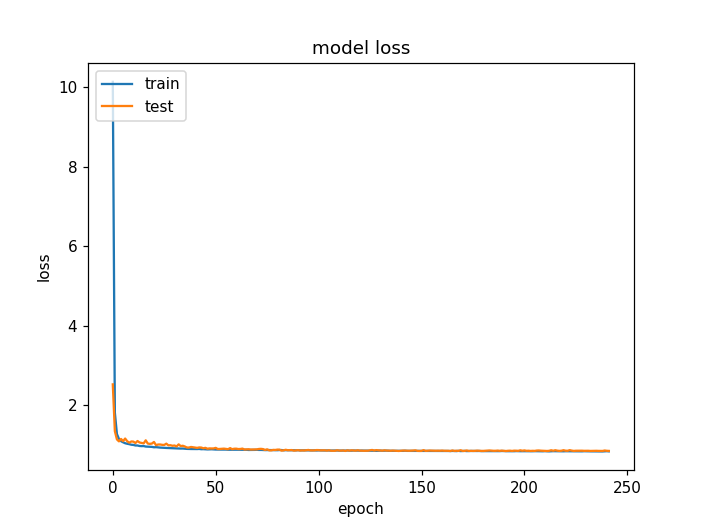

In [26]:


num_in = 59

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


5357/5357 [==============================] - 4s 816us/step - loss: 0.8437 - mean_squared_error: 0.7057
[0.8436920046806335, 0.7056500911712646]


<IPython.core.display.Javascript object>


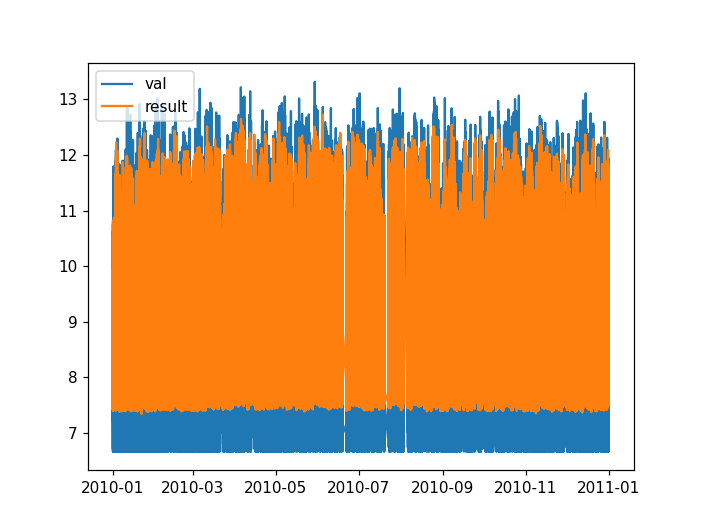

<IPython.core.display.Javascript object>


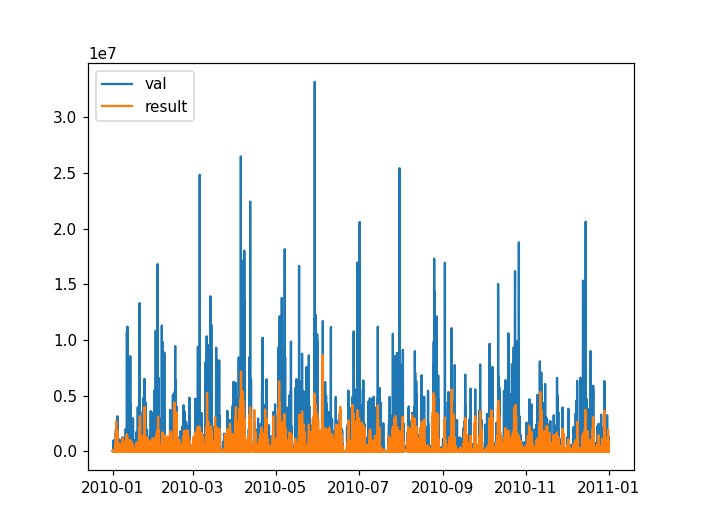

<IPython.core.display.Javascript object>


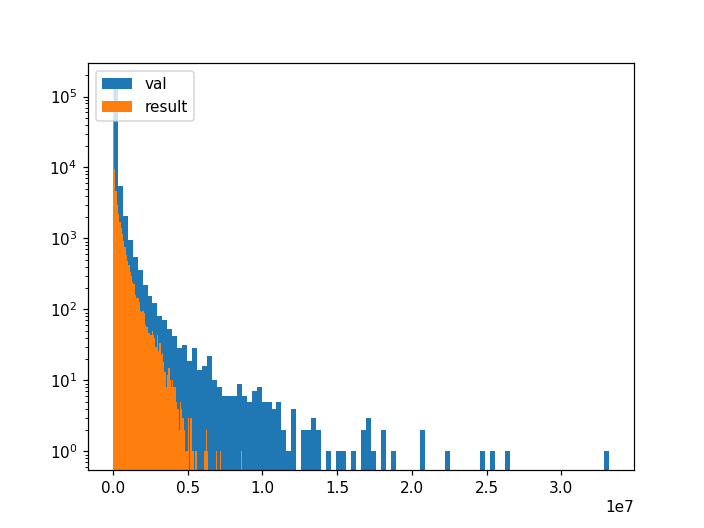

<IPython.core.display.Javascript object>


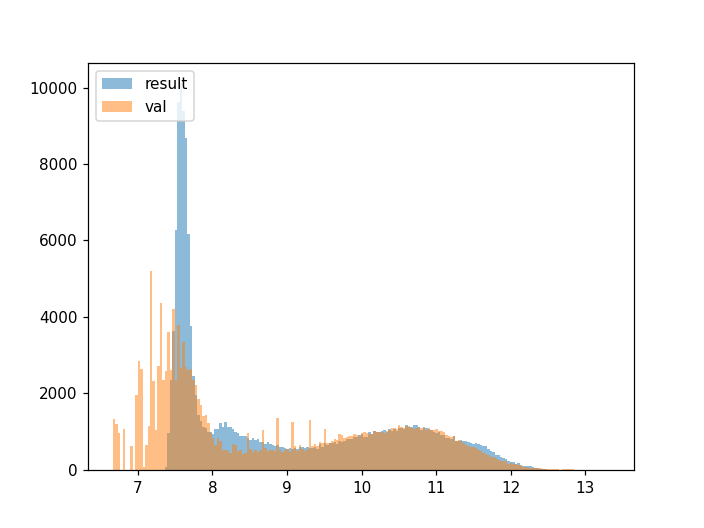

<IPython.core.display.Javascript object>


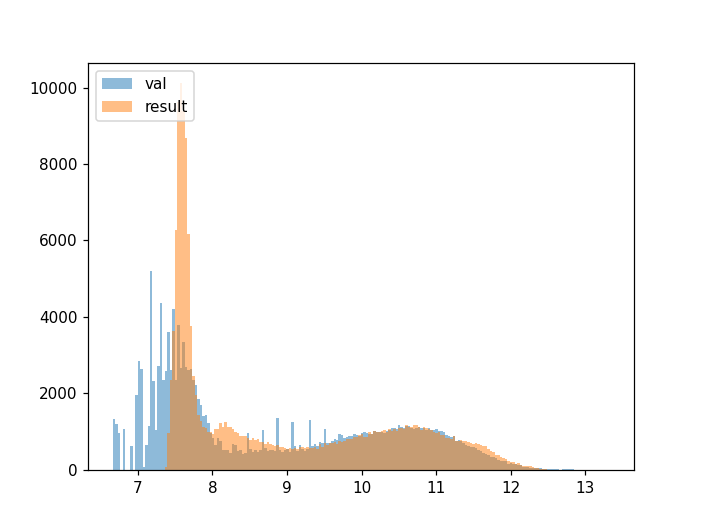

<IPython.core.display.Javascript object>


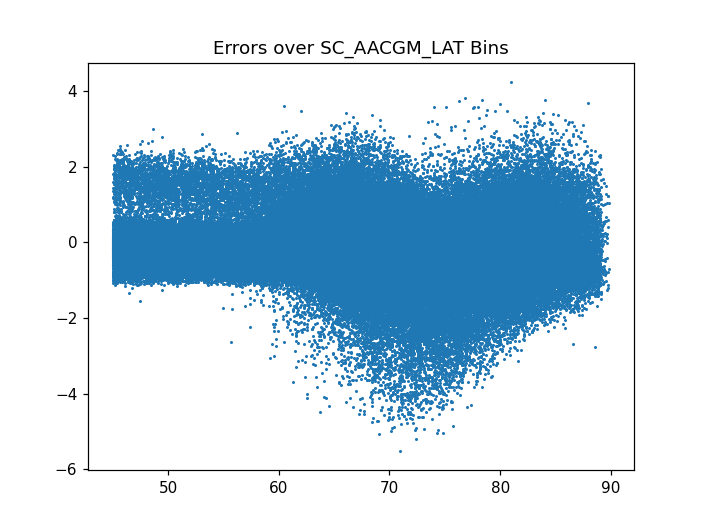

<IPython.core.display.Javascript object>


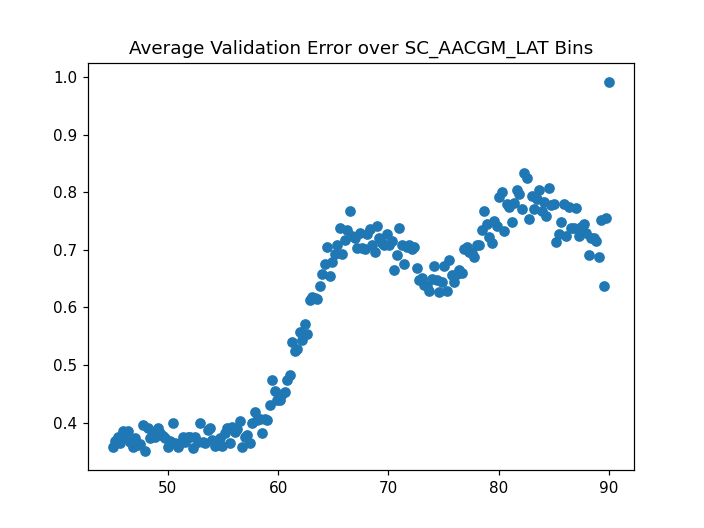

<IPython.core.display.Javascript object>


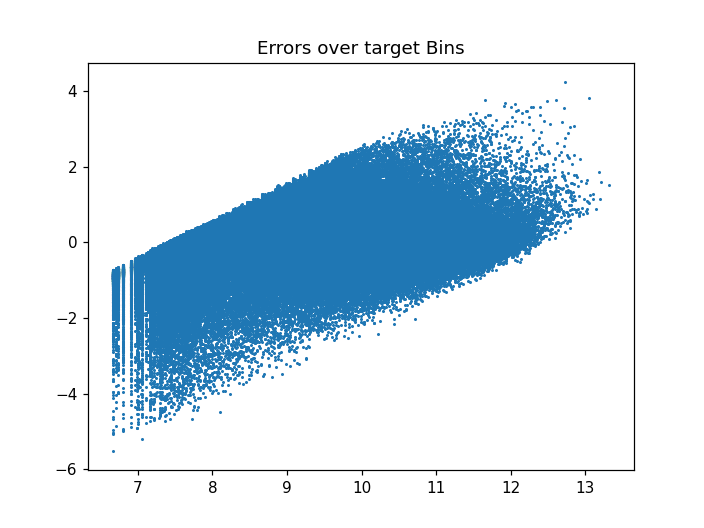

<IPython.core.display.Javascript object>


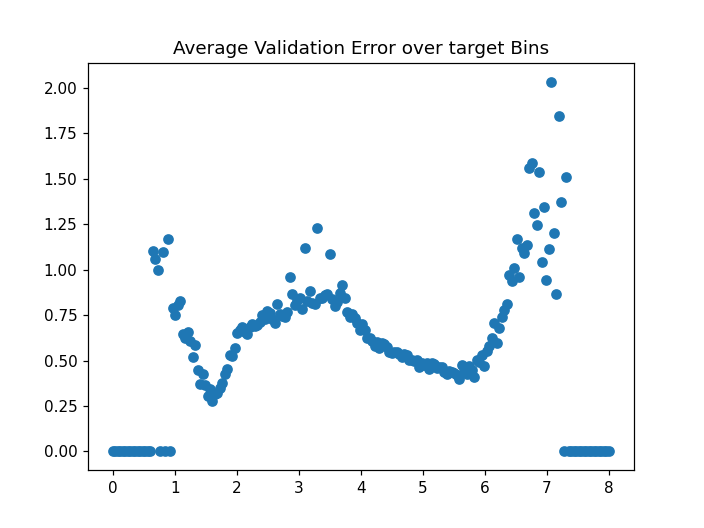

<IPython.core.display.Javascript object>


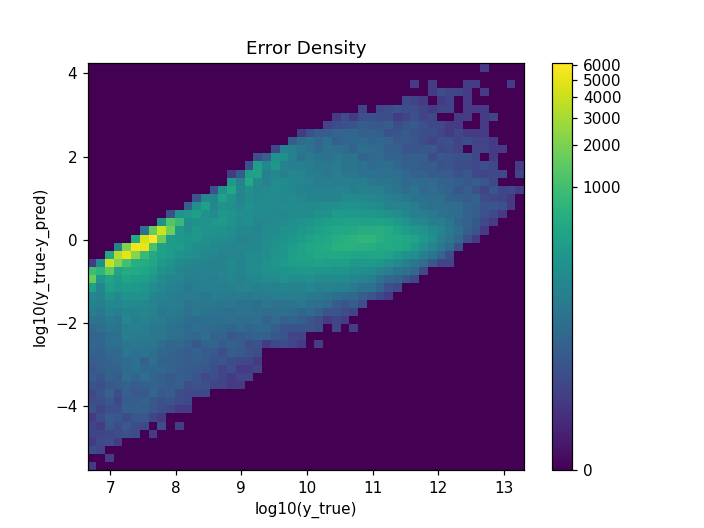

In [35]:
filename='tail_loss_new_pipeline_59'
# model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

# with open ('scalar_X_59_new_DB.pkl', 'wb') as f:
#   pickle.dump(scaler_X, f)

with open ('scalar_X_59_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

tail_loss_new_pipeline2_reduced = df_results

plot_model(df_results)



In [ ]:
#### NOW REPEATING FOR ELE_TOTAL_COUNTS INSTEAD OF TOTAL FLUX

In [10]:

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_COUNTS', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
                             'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'F107_45min', 'AE_45min', 'AL_45min', 'AU_45min', 
                             'SymH_45min', 'PC_45min', 'F107_30min', 'AE_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 
                             'F107_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 
                             'F107_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'F107_5min', 'AE_5min', 'AL_5min', 
                             'AU_5min', 'SymH_5min']]


# #### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 3])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,6.25),'float32')*K.cast(K.less_equal(y_pred,6.25),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,6.75),'float32')*K.cast(K.less_equal(y_pred,6.75),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,7),'float32')*K.cast(K.less_equal(y_pred,7),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,7.25),'float32')*K.cast(K.less_equal(y_pred,7.25),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,7.5),'float32')*K.cast(K.less_equal(y_pred,7.5),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

['SC_AACGM_LAT', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'AE', 'AL', 'AU', 'SymH', 'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'F107_45min', 'AE_45min', 'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'F107_30min', 'AE_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 'F107_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 'F107_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'F107_5min', 'AE_5min', 'AL_5min', 'AU_5min', 'SymH_5min']


Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 59)]              0         
_________________________________________________________________
dense_18 (Dense)             (None, 256)               15360     
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_19 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_20 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_21 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_22 (Dense)             (None, 1024)             

Epoch 70/4000
187/187 - 4s - loss: 0.8446 - mse: 0.5521 - val_loss: 1.0525 - val_mse: 0.7319
Epoch 71/4000
187/187 - 4s - loss: 0.8458 - mse: 0.5523 - val_loss: 1.0322 - val_mse: 0.7719
Epoch 72/4000
187/187 - 4s - loss: 0.8430 - mse: 0.5500 - val_loss: 1.0561 - val_mse: 0.7263
Epoch 73/4000
187/187 - 4s - loss: 0.8440 - mse: 0.5511 - val_loss: 1.0558 - val_mse: 0.7115
Epoch 74/4000
187/187 - 4s - loss: 0.8437 - mse: 0.5518 - val_loss: 1.0751 - val_mse: 0.6838
Epoch 75/4000
187/187 - 4s - loss: 0.8438 - mse: 0.5510 - val_loss: 1.0325 - val_mse: 0.7766
Epoch 76/4000
187/187 - 4s - loss: 0.8423 - mse: 0.5497 - val_loss: 1.0553 - val_mse: 0.7133
Epoch 77/4000
187/187 - 4s - loss: 0.8436 - mse: 0.5510 - val_loss: 1.0401 - val_mse: 0.7431
Epoch 78/4000
187/187 - 4s - loss: 0.8418 - mse: 0.5496 - val_loss: 1.0457 - val_mse: 0.7733
Epoch 79/4000
187/187 - 4s - loss: 0.8417 - mse: 0.5497 - val_loss: 1.0458 - val_mse: 0.7552
Epoch 80/4000
187/187 - 4s - loss: 0.8407 - mse: 0.5495 - val_loss: 1.

Epoch 158/4000
187/187 - 4s - loss: 0.8188 - mse: 0.5372 - val_loss: 1.0347 - val_mse: 0.7147
Epoch 159/4000
187/187 - 4s - loss: 0.8176 - mse: 0.5368 - val_loss: 1.0321 - val_mse: 0.7026
Epoch 160/4000
187/187 - 4s - loss: 0.8172 - mse: 0.5366 - val_loss: 1.0106 - val_mse: 0.7261
Epoch 161/4000
187/187 - 4s - loss: 0.8183 - mse: 0.5376 - val_loss: 1.0501 - val_mse: 0.6878
Epoch 162/4000
187/187 - 4s - loss: 0.8174 - mse: 0.5365 - val_loss: 1.0182 - val_mse: 0.7273
Epoch 163/4000
187/187 - 4s - loss: 0.8174 - mse: 0.5367 - val_loss: 1.0281 - val_mse: 0.7072
Epoch 164/4000
187/187 - 4s - loss: 0.8173 - mse: 0.5364 - val_loss: 1.0299 - val_mse: 0.7091
Epoch 165/4000
187/187 - 4s - loss: 0.8178 - mse: 0.5374 - val_loss: 1.0333 - val_mse: 0.6971
Epoch 166/4000
187/187 - 4s - loss: 0.8188 - mse: 0.5371 - val_loss: 1.0080 - val_mse: 0.7664
Epoch 167/4000
187/187 - 4s - loss: 0.8171 - mse: 0.5373 - val_loss: 1.0358 - val_mse: 0.7023
Epoch 168/4000
187/187 - 4s - loss: 0.8159 - mse: 0.5359 - v

<IPython.core.display.Javascript object>


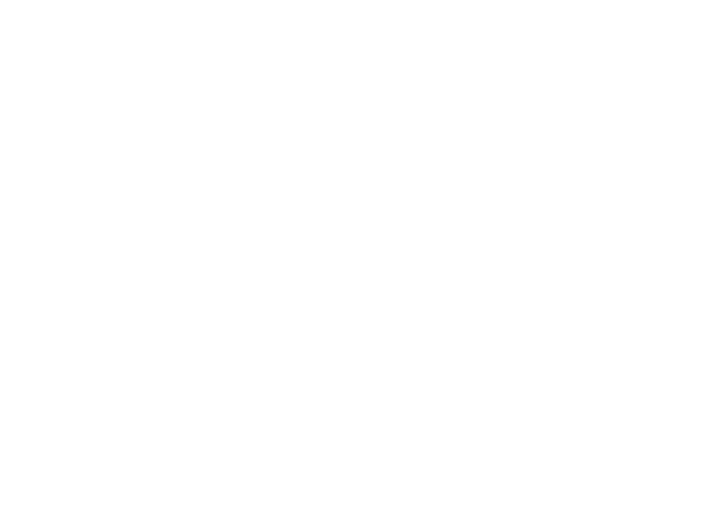

<IPython.core.display.Javascript object>


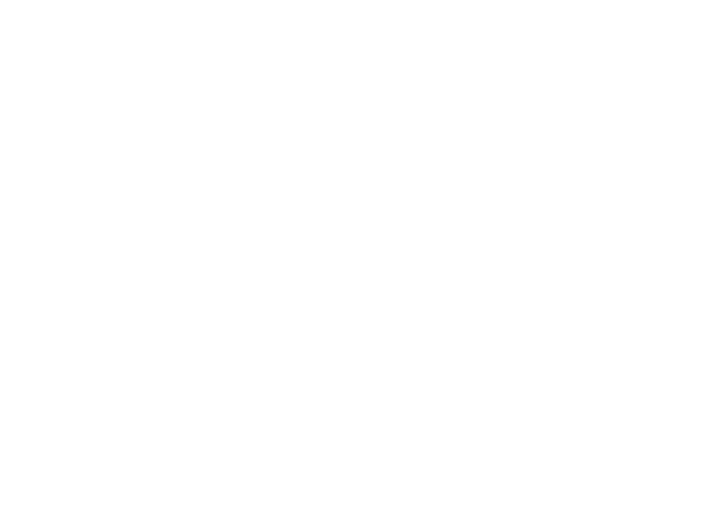

In [30]:



num_in = 59

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


5284/5284 [==============================] - 4s 803us/step - loss: 1.0062 - mean_squared_error: 0.7336
[1.0062283277511597, 0.7336339950561523]


<IPython.core.display.Javascript object>


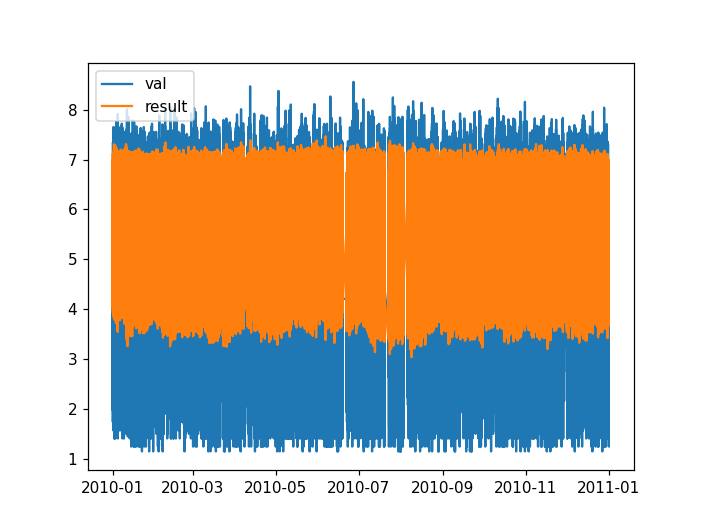

<IPython.core.display.Javascript object>


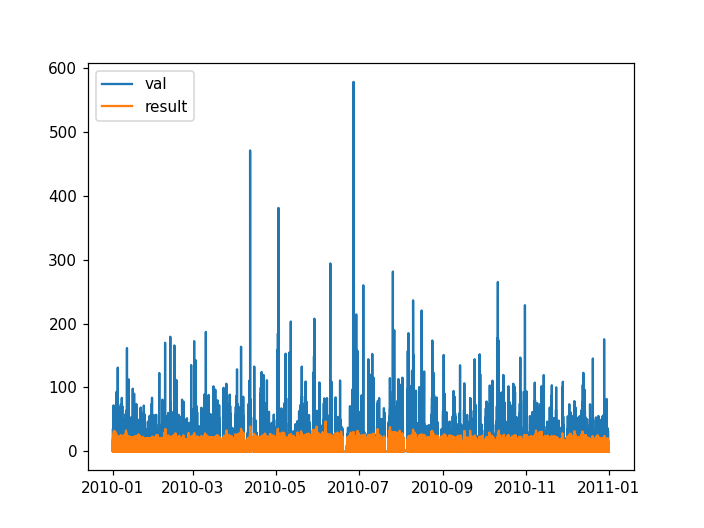

<IPython.core.display.Javascript object>


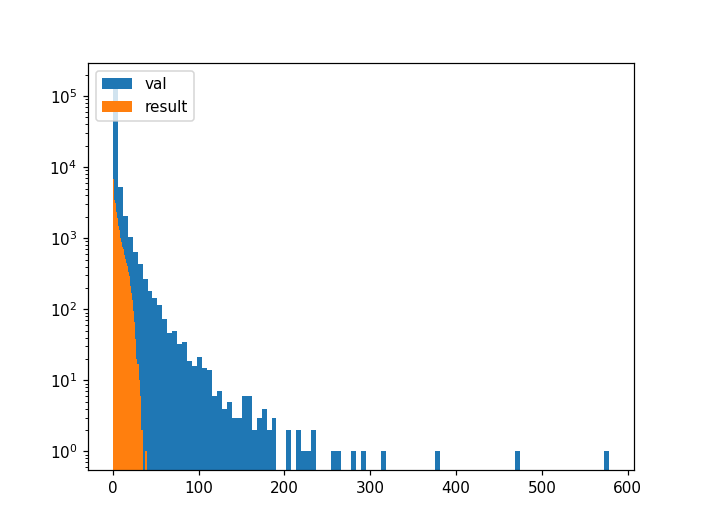

<IPython.core.display.Javascript object>


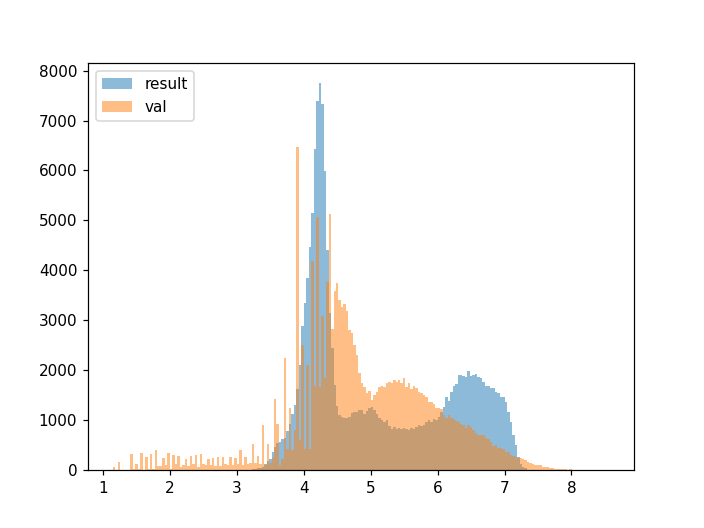

<IPython.core.display.Javascript object>


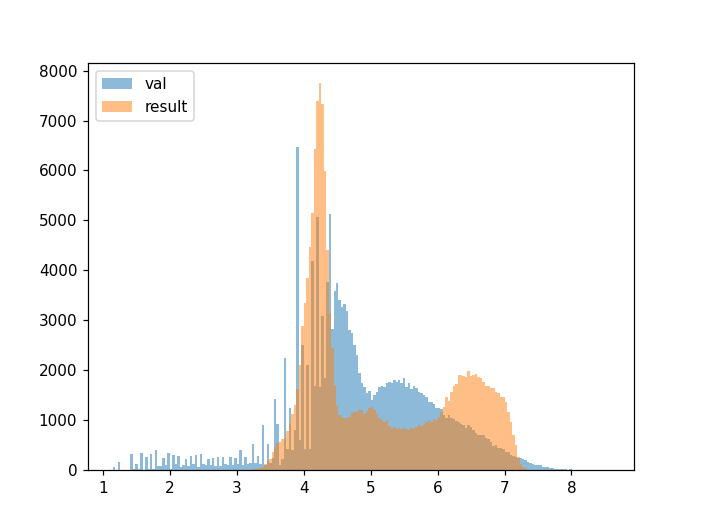

<IPython.core.display.Javascript object>


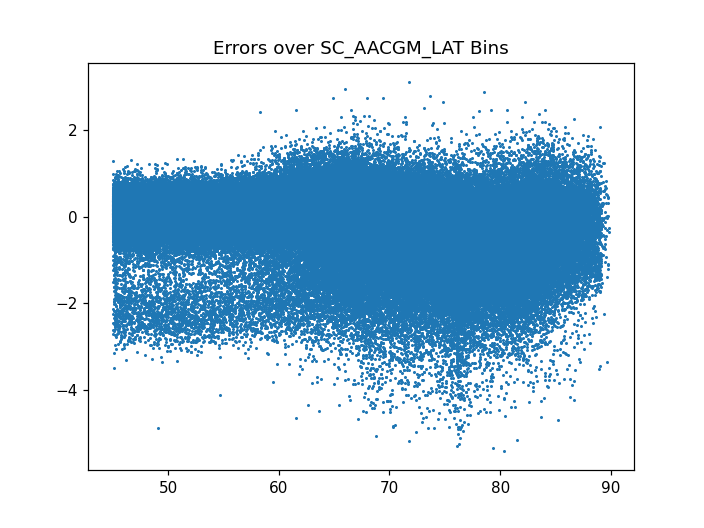

<IPython.core.display.Javascript object>


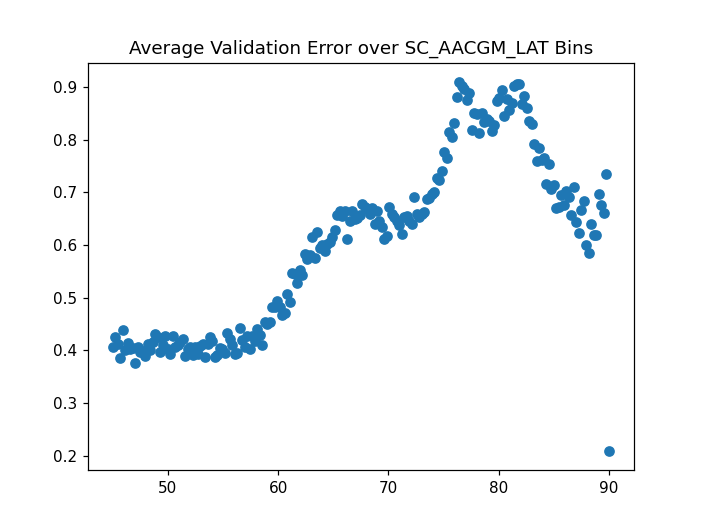

<IPython.core.display.Javascript object>


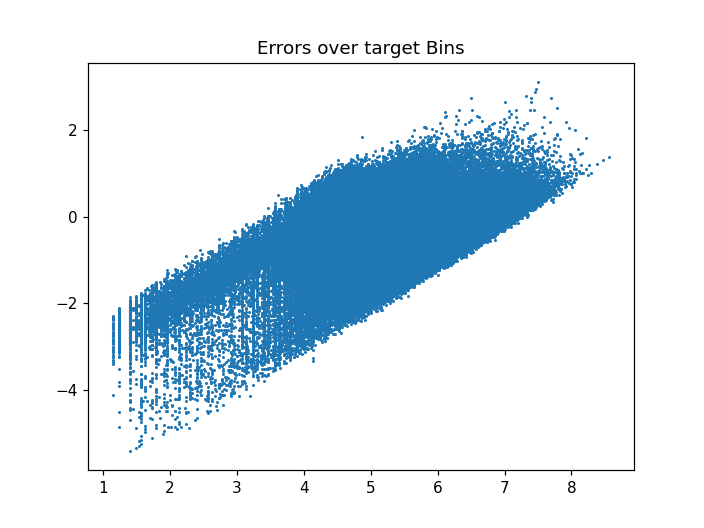

<IPython.core.display.Javascript object>


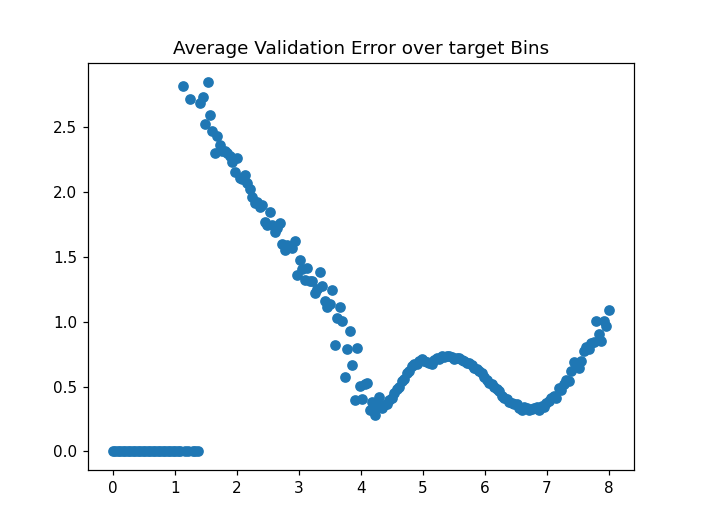

<IPython.core.display.Javascript object>


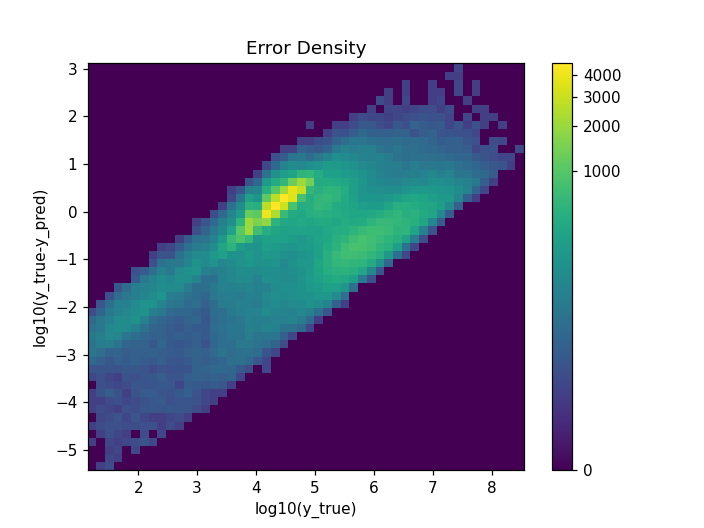

In [30]:
filename='counts_tail_loss_new_pipeline_59'
# model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

# with open ('scalar_X_59_counts_new_DB.pkl', 'wb') as f:
#   pickle.dump(scaler_X, f)

with open ('scalar_X_59_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)


(169065, 1)


In [2]:
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
#         10*(y_true-y_pred)*(y_true-y_pred)
#         *K.cast(K.greater(y_true,1.25),'float32')*K.cast(K.less_equal(y_pred,1.25),'float32') +
#         10*(y_true-y_pred)*(y_true-y_pred) 
#         *K.cast(K.greater(y_true,2.),'float32')*K.cast(K.less_equal(y_pred,2.0),'float32') +
#         10*(y_true-y_pred)*(y_true-y_pred)
#         *K.cast(K.greater(y_true,2.33),'float32')*K.cast(K.less_equal(y_pred,2.5),'float32')  
        +
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,2.66),'float32')*K.cast(K.less_equal(y_pred,2.66),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,3.),'float32')*K.cast(K.less_equal(y_pred,3.),'float32')  
                +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,3.5),'float32')*K.cast(K.less_equal(y_pred,3.33),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

## Now repeat training for each channel separately

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
# #### GET RID OF THE REALLY SMALL VALUES
# df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 4])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])


del df_cumulative


# Construct X and y
feature_cols = ['SC_AACGM_LAT',  'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
                             'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'F107_45min', 'AE_45min', 'AL_45min', 'AU_45min', 
                             'SymH_45min', 'PC_45min', 'F107_30min', 'AE_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 
                             'F107_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 
                             'F107_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'F107_5min', 'AE_5min', 'AL_5min', 
                             'AU_5min', 'SymH_5min']


X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val[['ELE_COUNT_1','ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train[['ELE_COUNT_1','ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 1 #0.0001
y_val[y_val == 0] = 1 #0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train



Model: "functional_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 59)]              0         
_________________________________________________________________
dense_35 (Dense)             (None, 256)               15360     
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_36 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_37 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_38 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_39 (Dense)             (None, 1024)             

188/188 - 4s - loss: 0.3827 - mse: 0.2273 - val_loss: 0.4150 - val_mse: 0.2449
Epoch 72/1000
188/188 - 4s - loss: 0.3819 - mse: 0.2269 - val_loss: 0.4158 - val_mse: 0.2332
Epoch 73/1000
188/188 - 4s - loss: 0.3816 - mse: 0.2267 - val_loss: 0.4169 - val_mse: 0.2415
Epoch 74/1000
188/188 - 4s - loss: 0.3815 - mse: 0.2267 - val_loss: 0.4168 - val_mse: 0.2437
Epoch 75/1000
188/188 - 4s - loss: 0.3816 - mse: 0.2269 - val_loss: 0.4166 - val_mse: 0.2479
Epoch 76/1000
188/188 - 4s - loss: 0.3816 - mse: 0.2269 - val_loss: 0.4148 - val_mse: 0.2463
Epoch 77/1000
188/188 - 4s - loss: 0.3810 - mse: 0.2267 - val_loss: 0.4195 - val_mse: 0.2426
Epoch 78/1000
188/188 - 4s - loss: 0.3813 - mse: 0.2268 - val_loss: 0.4171 - val_mse: 0.2387
Epoch 79/1000
188/188 - 4s - loss: 0.3807 - mse: 0.2264 - val_loss: 0.4171 - val_mse: 0.2445
Epoch 80/1000
188/188 - 4s - loss: 0.3809 - mse: 0.2266 - val_loss: 0.4203 - val_mse: 0.2368
Epoch 81/1000
188/188 - 4s - loss: 0.3805 - mse: 0.2264 - val_loss: 0.4174 - val_mse

<IPython.core.display.Javascript object>


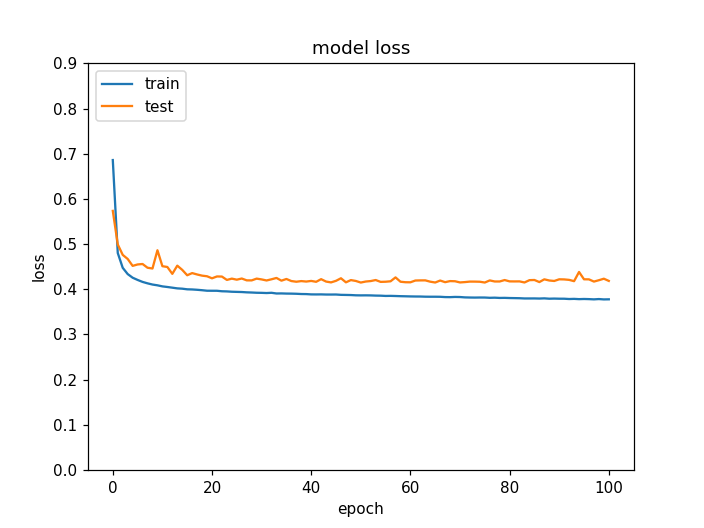

<IPython.core.display.Javascript object>


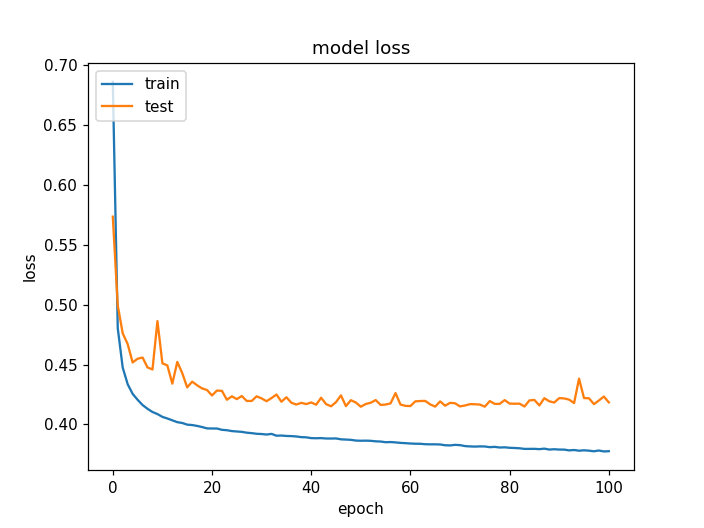

In [40]:
from tensorflow.keras.layers import Input
num_in = 59

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(64, activation='relu')(model1)
#model1 = Dense(4, activation='relu')(model1)
model1 = Dense(19, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=1000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

model_3 = df_results

In [6]:
ch_energies = np.array([30000.0,20400.0,13900.0,9450.0,6460.0,4400.0,3000.0,2040.0,
                        1392.0,949.0,646.0,440.0,300.0,204.0,139.0,95.0,65.0,44.0,30.0])
ch_energies = np.flip((ch_energies[:]))
#need to fix this latter to add first channel back in
ELE_TOTAL_COUNTS = 10**(df_results.values[:,0])*(ch_energies[1]-ch_energies[0])
+ 10**(df_results.values[:,18])*(ch_energies[18]-ch_energies[17])
for i in range(1,18):
    ELE_TOTAL_COUNTS = ELE_TOTAL_COUNTS +     10**(df_results.values[:,i])*(ch_energies[i+1]-ch_energies[i-1])/2.
ELE_TOTAL_COUNTS= pd.DataFrame(data=np.log10(np.reshape(ELE_TOTAL_COUNTS,(ELE_TOTAL_COUNTS.shape[0])) ), index = df_val.index)
    
ELE_TOTAL_COUNTS_val = 10**(y_val_log.values[:,0])*(ch_energies[1]-ch_energies[0])
+ 10**(y_val_log.values[:,18])*(ch_energies[18]-ch_energies[17])
for i in range(1,18):
    ELE_TOTAL_COUNTS_val = ELE_TOTAL_COUNTS_val +     10**(y_val_log.values[:,i])*(ch_energies[i+1]-ch_energies[i-1])/2.
    
temp = y_val_log
y_val_log = pd.DataFrame(data=np.log10(np.reshape(ELE_TOTAL_COUNTS_val,(ELE_TOTAL_COUNTS_val.shape[0]) )), index = df_val.index)

df_results = ELE_TOTAL_COUNTS

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


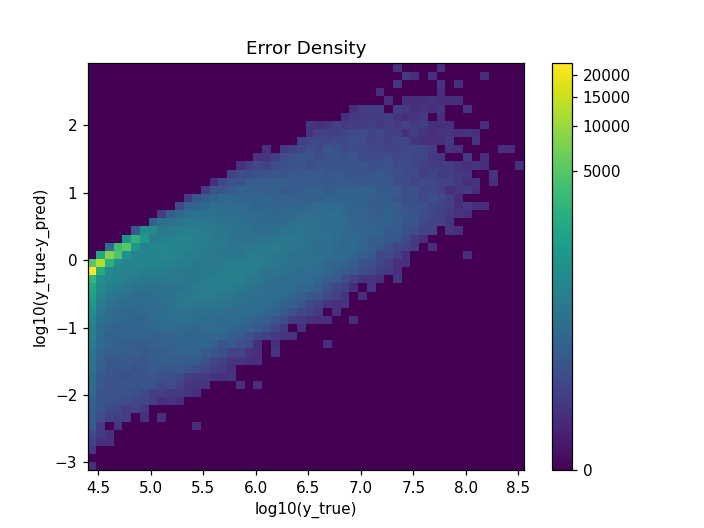

In [7]:
import matplotlib.colors as mcolors
gamma = 0.2#[0.8, 0.5, 0.3]
errors= y_val_log.values-df_results.values
print(y_val_log.values.shape, errors.shape)

plt.figure();
plt.hist2d(y_val_log.values[:,0], errors[:,0],
              bins=50, norm=mcolors.PowerNorm(gamma))
plt.colorbar()
plt.title('Error Density')
plt.xlabel('log10(y_true)')
plt.ylabel('log10(y_true-y_pred)')

plt.show()

<IPython.core.display.Javascript object>


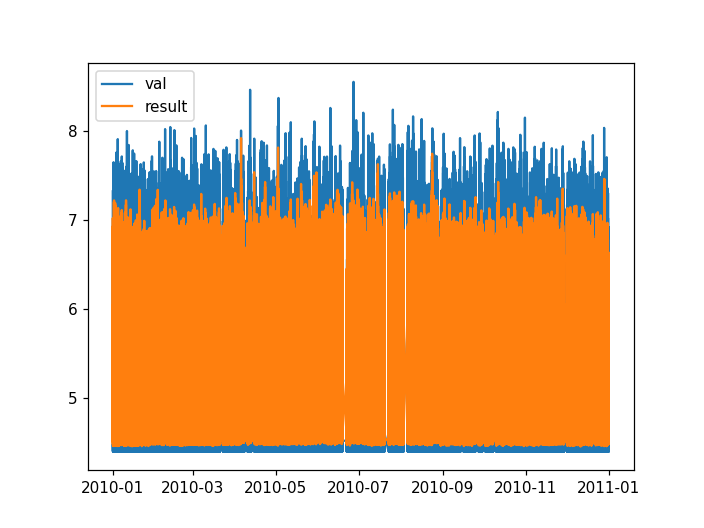

<IPython.core.display.Javascript object>


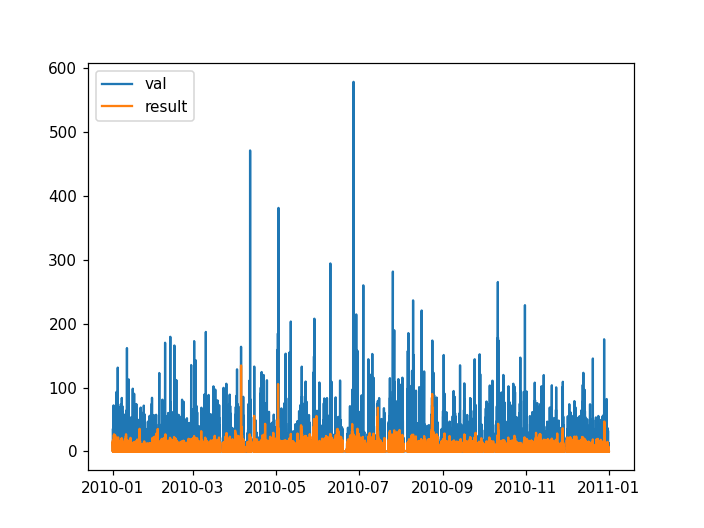

<IPython.core.display.Javascript object>


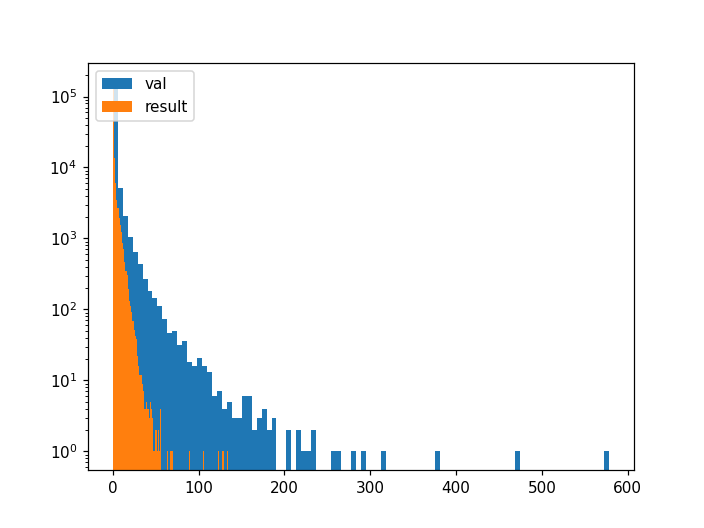

<IPython.core.display.Javascript object>


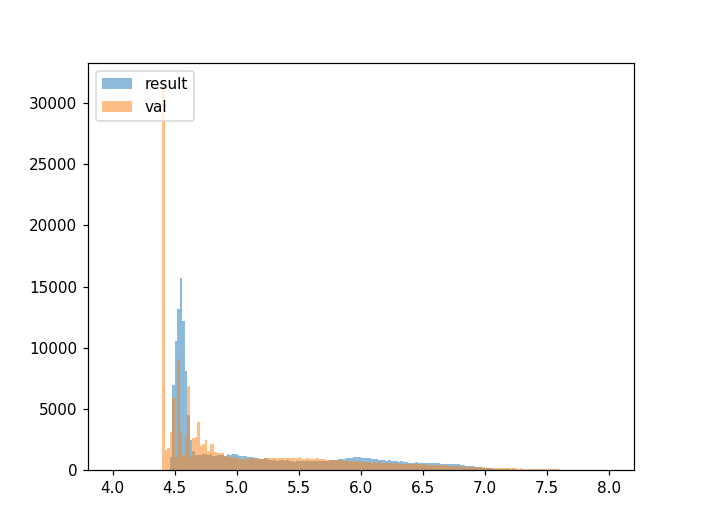

<IPython.core.display.Javascript object>


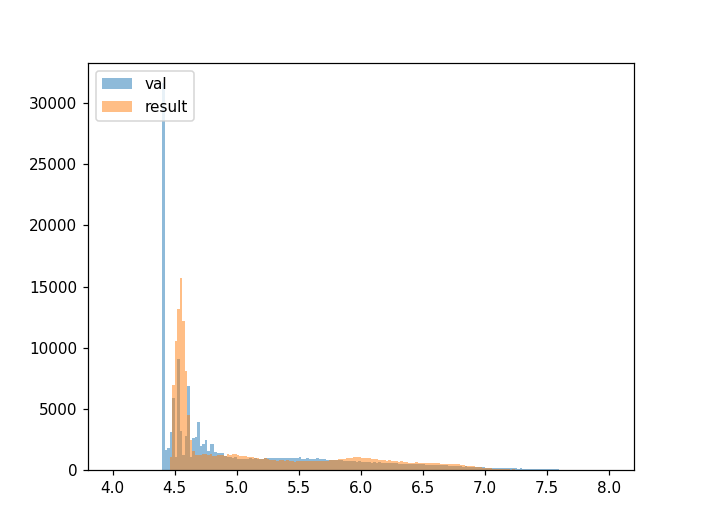

<IPython.core.display.Javascript object>


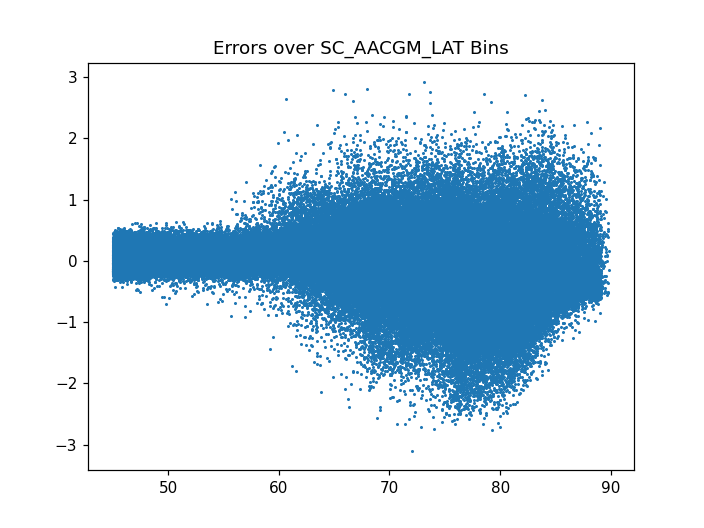

<IPython.core.display.Javascript object>


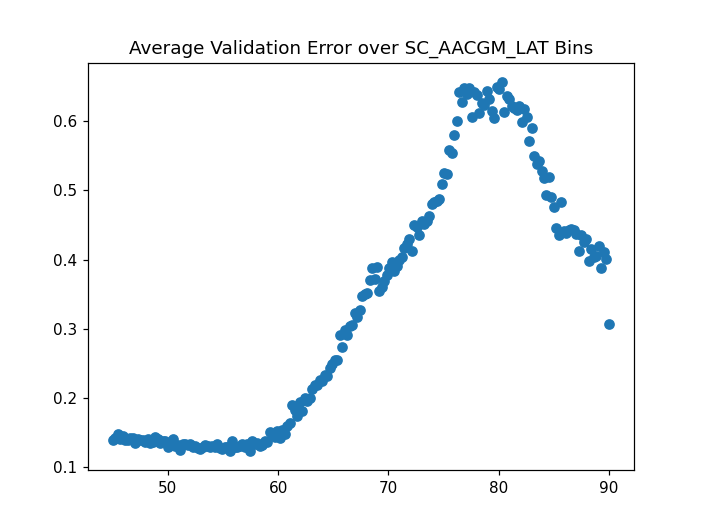

<IPython.core.display.Javascript object>


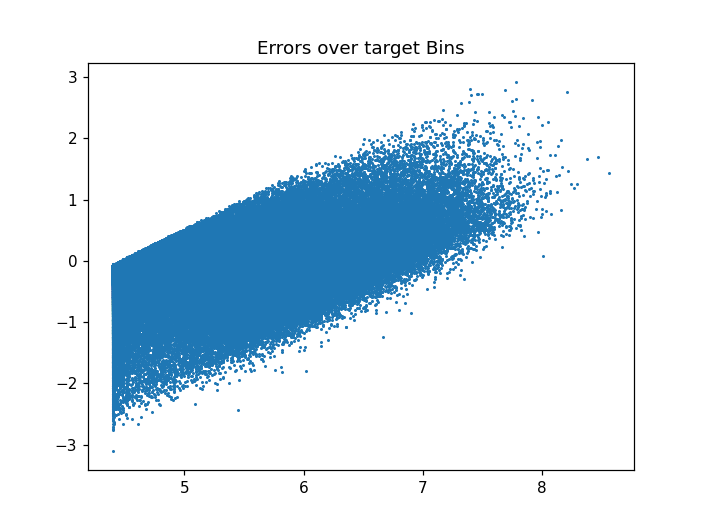

<IPython.core.display.Javascript object>


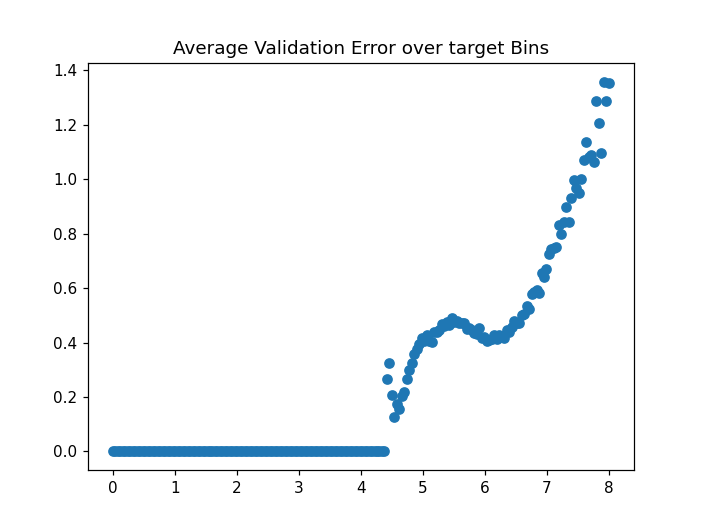

In [8]:
plt.figure()
plt.plot(y_val_log[:])
plt.plot(df_results[:])
plt.legend(['val', 'result'], loc='upper left')
plt.show()


plt.figure()
plt.plot(10**y_val_log[:]*1.6e-6)
plt.plot(10**df_results[:]*1.6e-6)
plt.legend(['val', 'result'], loc='upper left')
plt.show()

plt.figure()
plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
plt.legend(['val', 'result'], loc='upper left')
plt.show()


minr = 4 #np.min(y_val_log.values)
maxr = 8 #np.max(y_val_log.values)
plt.figure()
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['result','val'], loc='upper left')
plt.show()

plt.figure()
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['val', 'result'], loc='upper left')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
plt.title('Errors over SC_AACGM_LAT Bins')


import math
bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
    if not (math.isnan(i)):
        i = int(i)
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/bin_total
plt.figure()
plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
plt.title('Average Validation Error over SC_AACGM_LAT Bins')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(y_val_log.values,errors,s=1)
plt.title('Errors over target Bins')

bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((y_val_log.values[j]-0)/((8-0)/200))
    if not (math.isnan(i)):
        i = int(i)
        if (i < 200) and(i > 0):
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/(bin_total+.00001)
plt.figure()
plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
plt.title('Average Validation Error over target Bins')    
plt.show()

y_val_log = temp

0


<IPython.core.display.Javascript object>


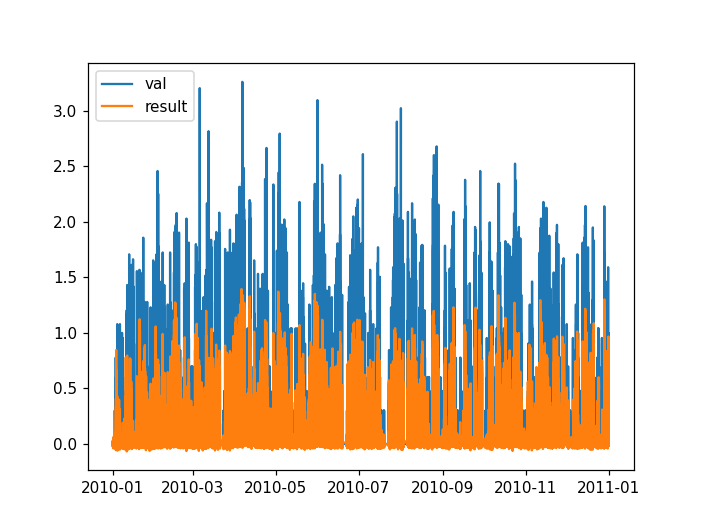

<IPython.core.display.Javascript object>


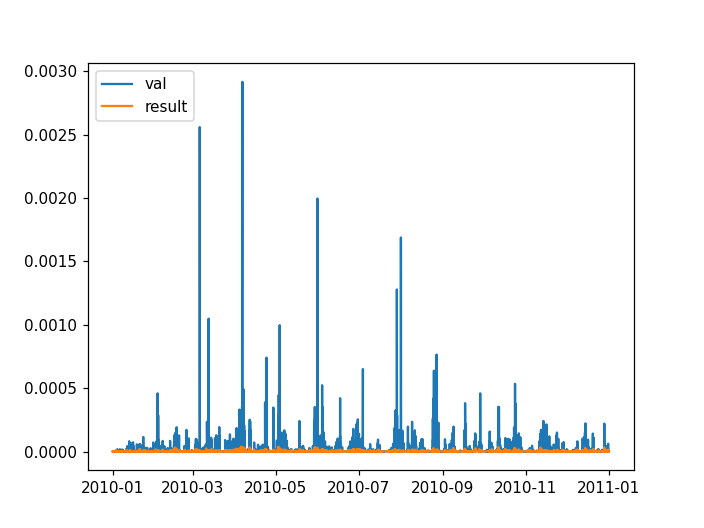

<IPython.core.display.Javascript object>


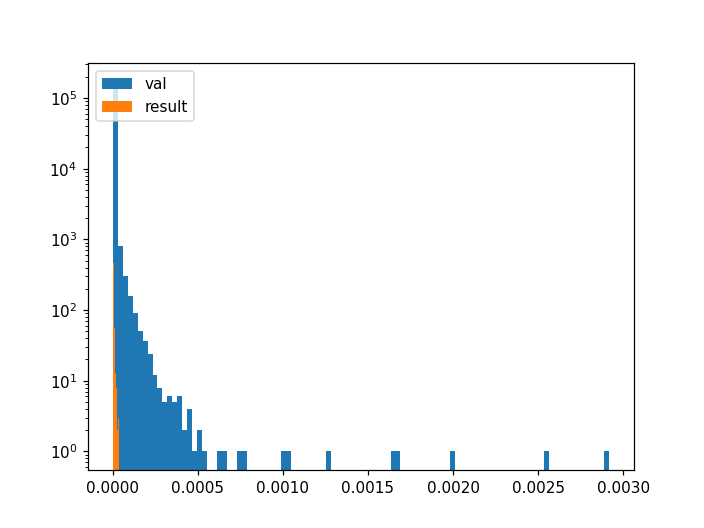

<IPython.core.display.Javascript object>


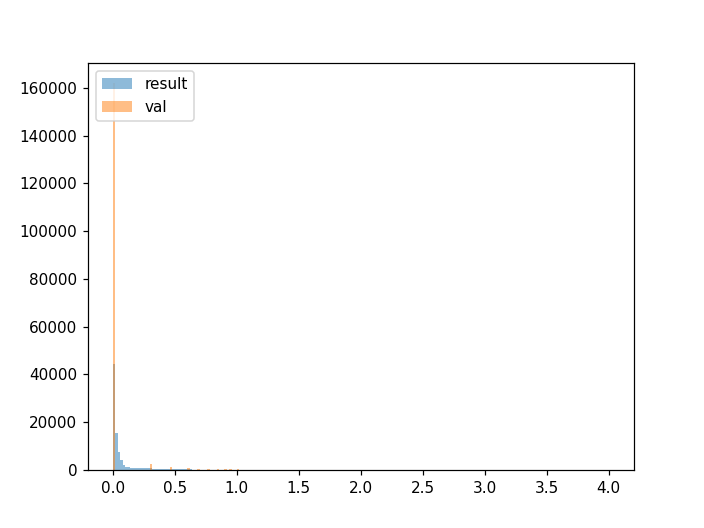

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


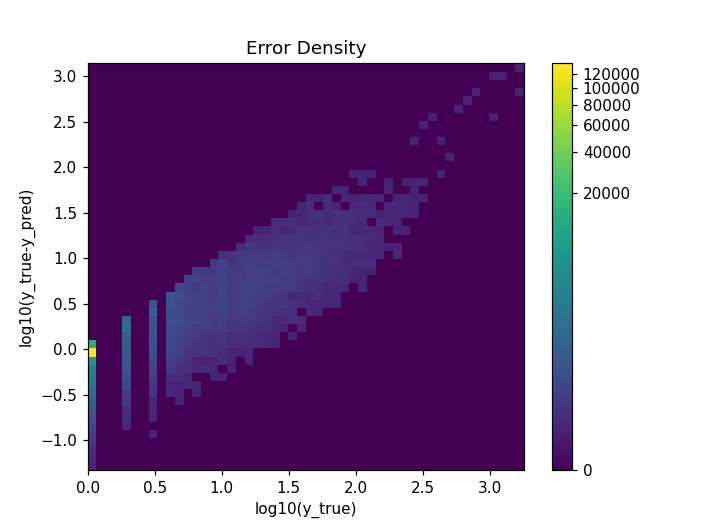

1


<IPython.core.display.Javascript object>


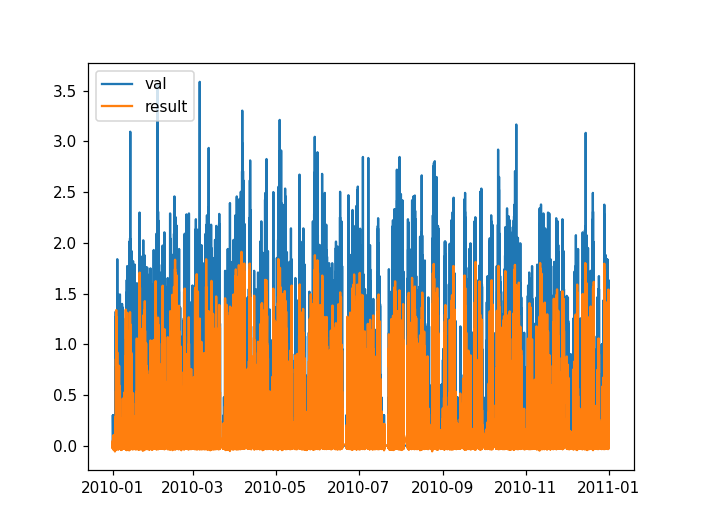

<IPython.core.display.Javascript object>


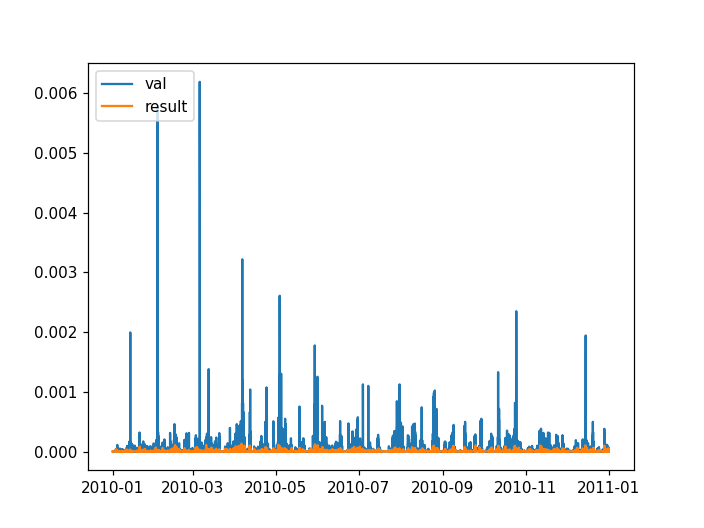

<IPython.core.display.Javascript object>


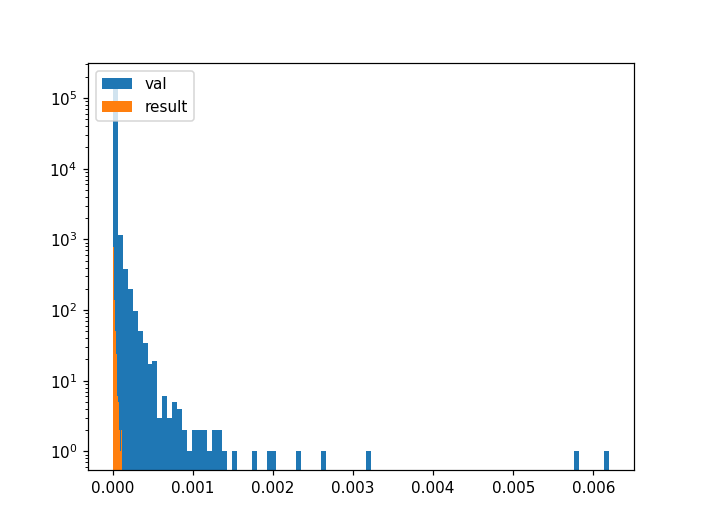

<IPython.core.display.Javascript object>


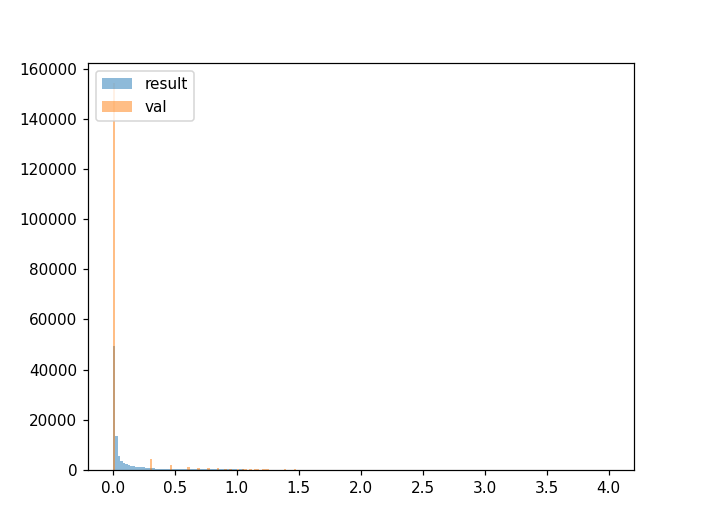

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


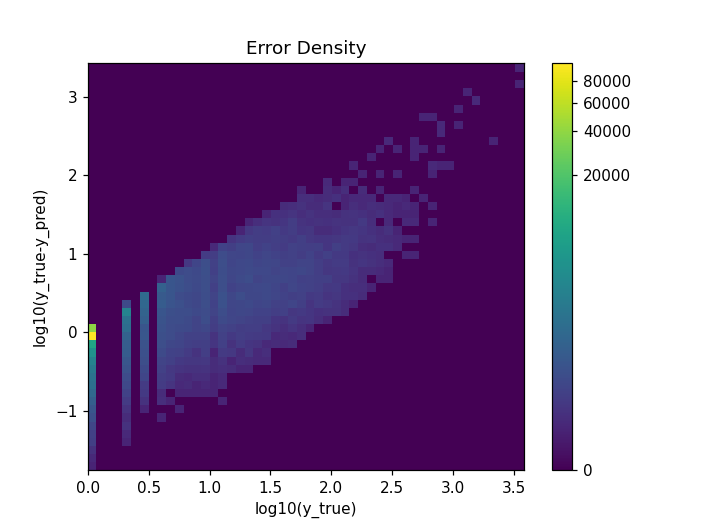

2


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


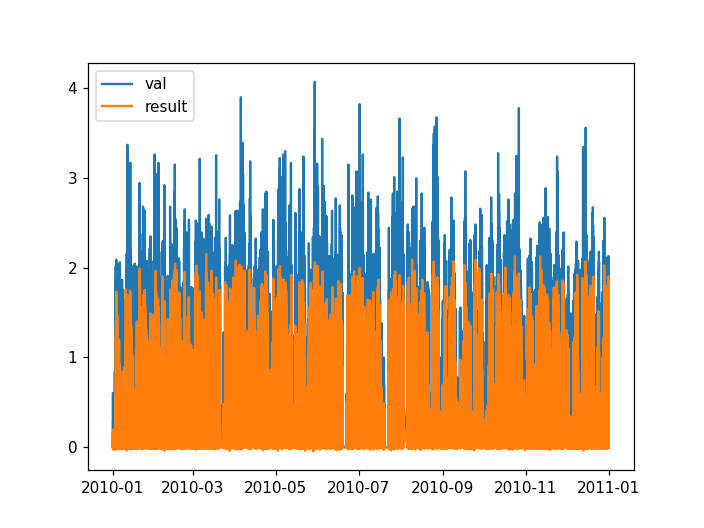

<IPython.core.display.Javascript object>


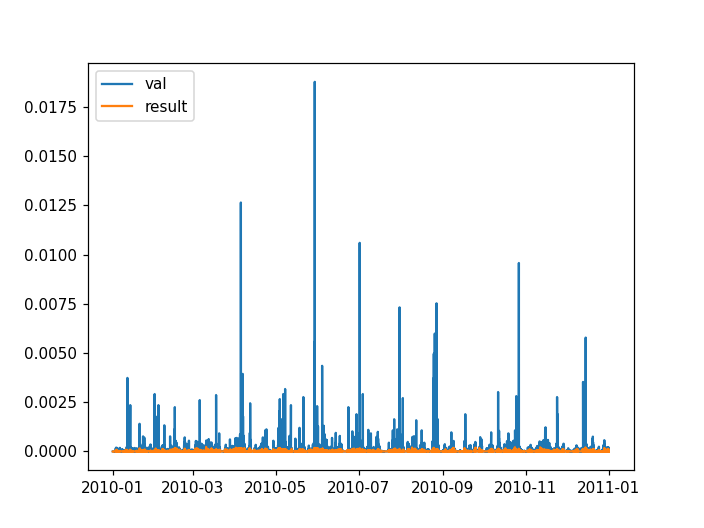

<IPython.core.display.Javascript object>


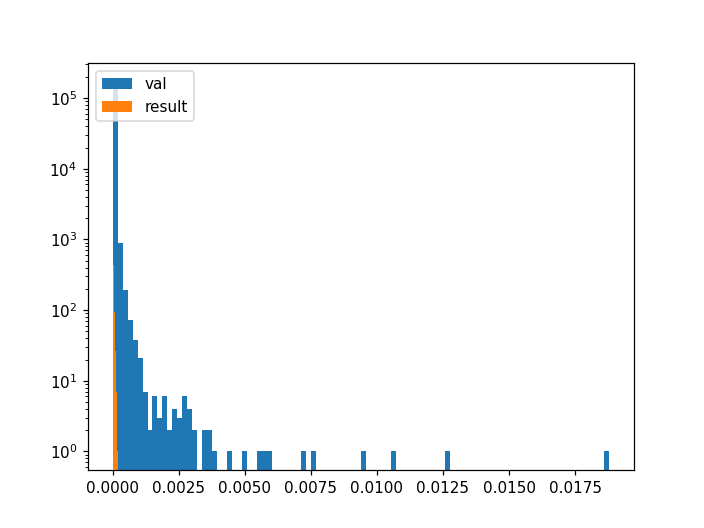

<IPython.core.display.Javascript object>


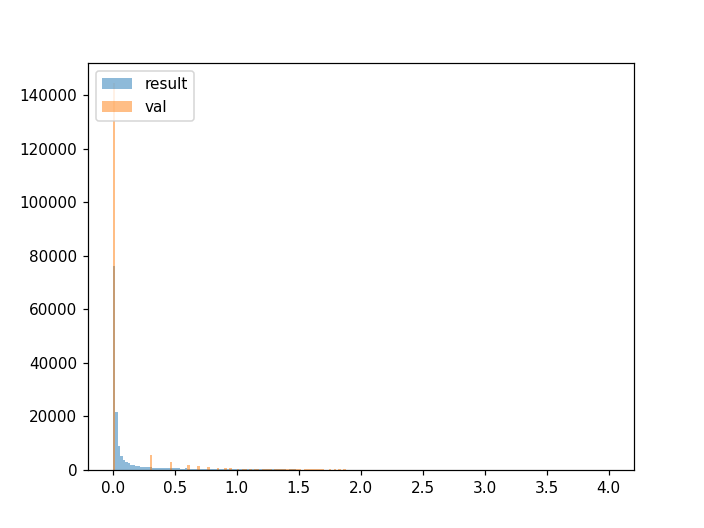

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


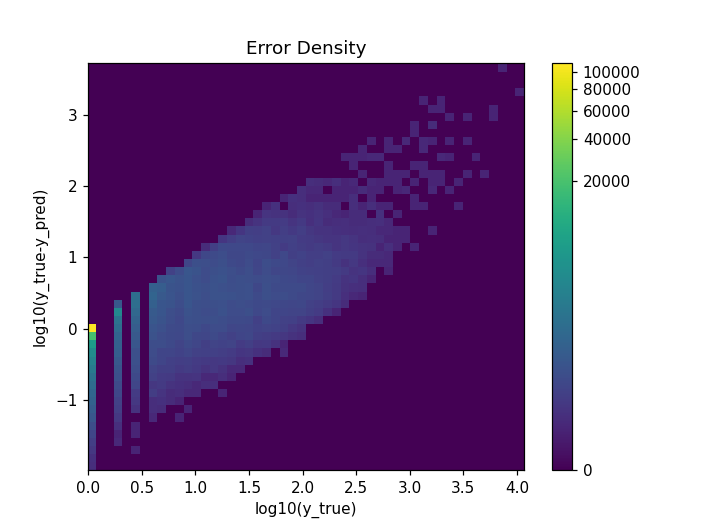

3


<IPython.core.display.Javascript object>


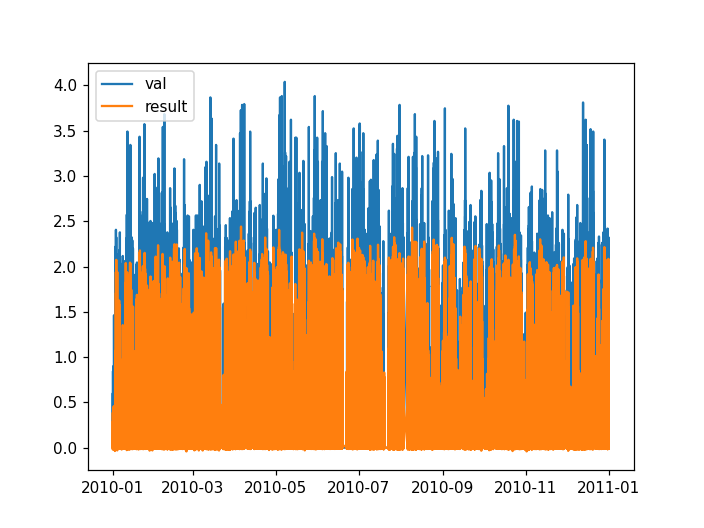

<IPython.core.display.Javascript object>


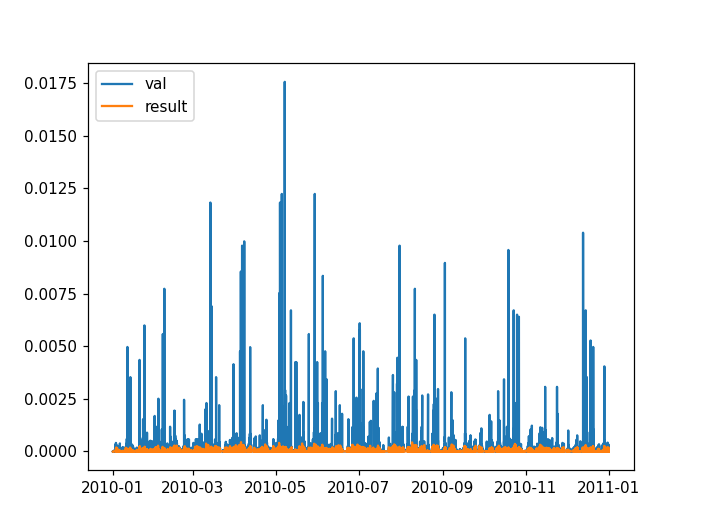

<IPython.core.display.Javascript object>


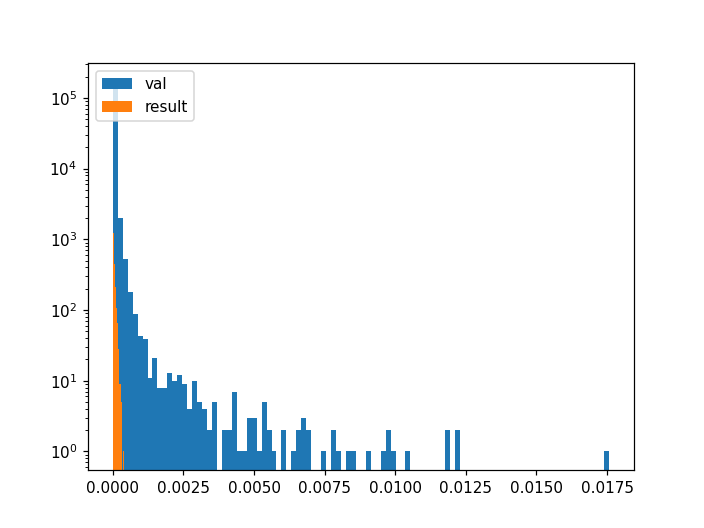

<IPython.core.display.Javascript object>


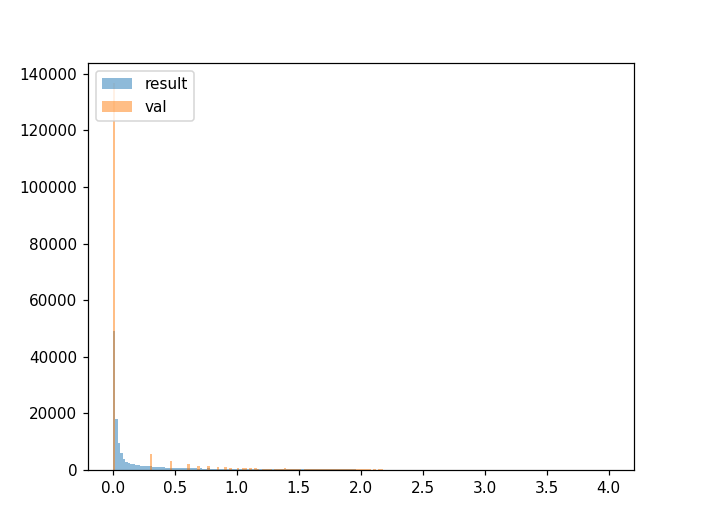

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


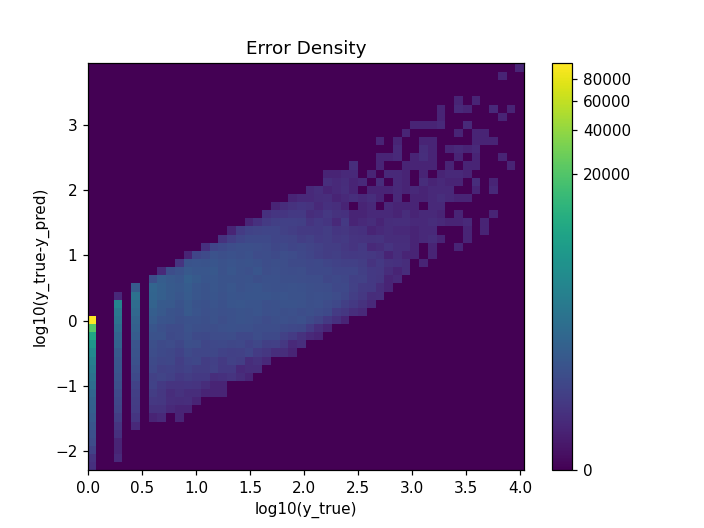

4


<IPython.core.display.Javascript object>


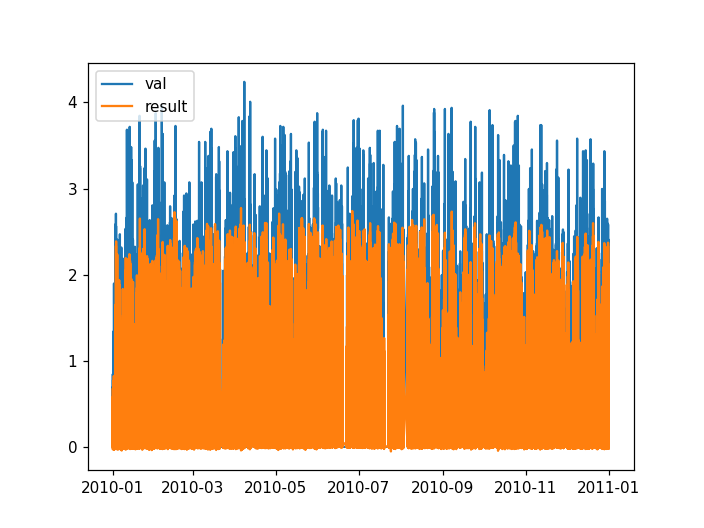

<IPython.core.display.Javascript object>


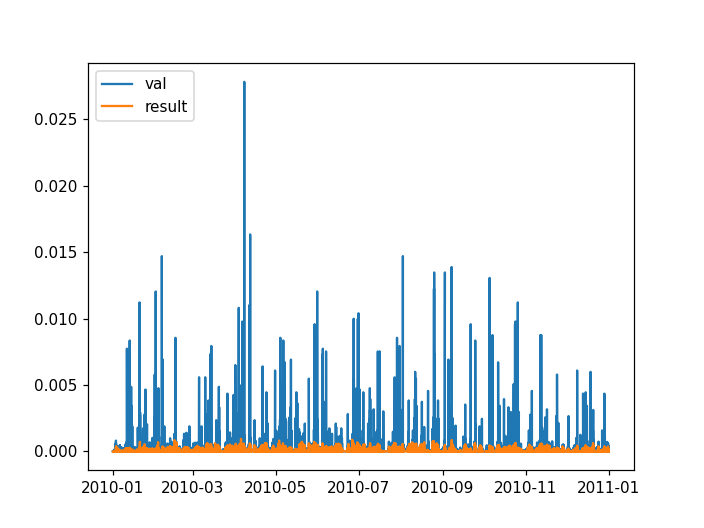

<IPython.core.display.Javascript object>


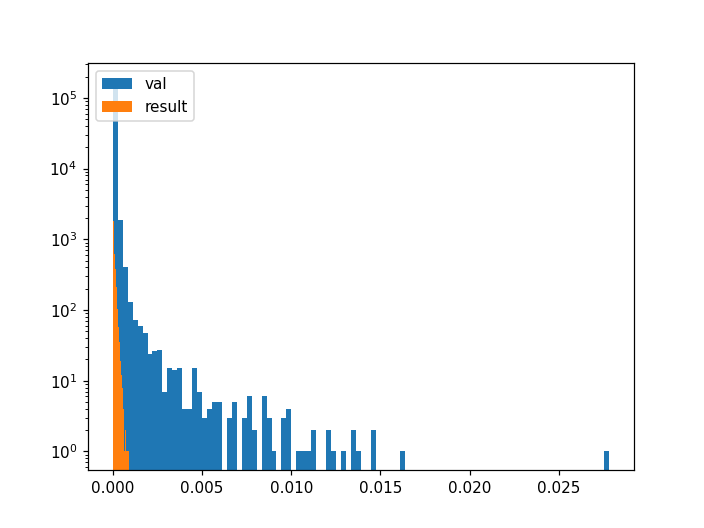

<IPython.core.display.Javascript object>


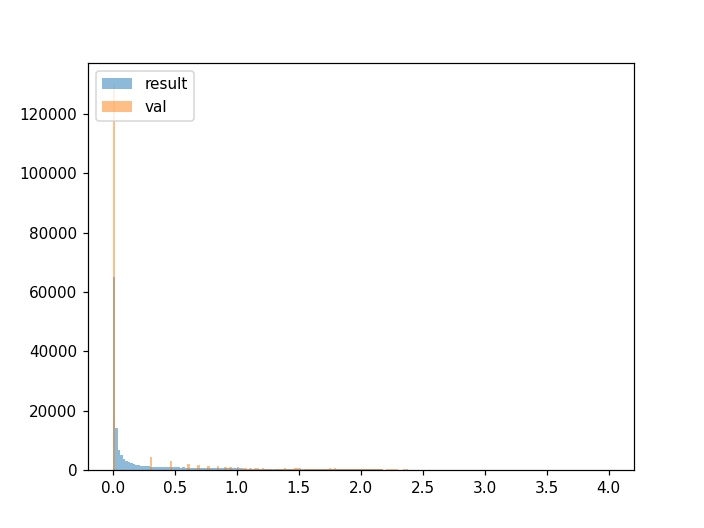

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


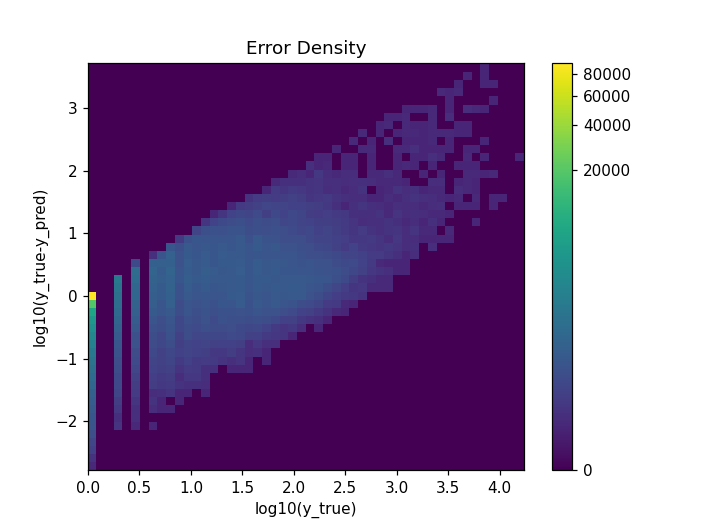

5


<IPython.core.display.Javascript object>


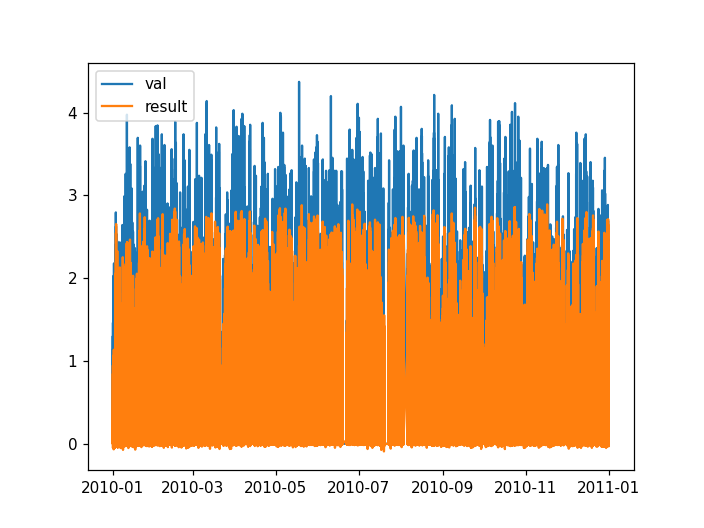

<IPython.core.display.Javascript object>


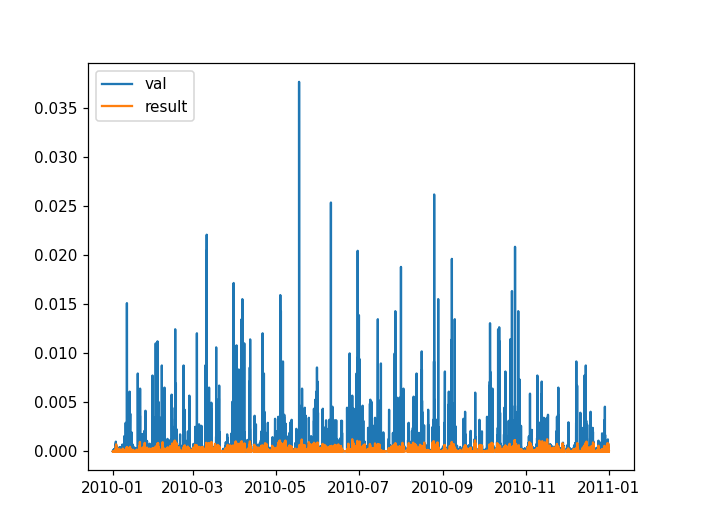

<IPython.core.display.Javascript object>


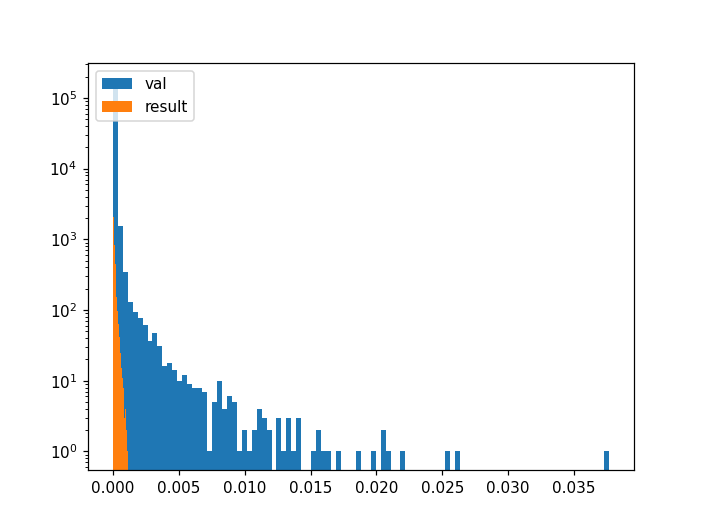

<IPython.core.display.Javascript object>


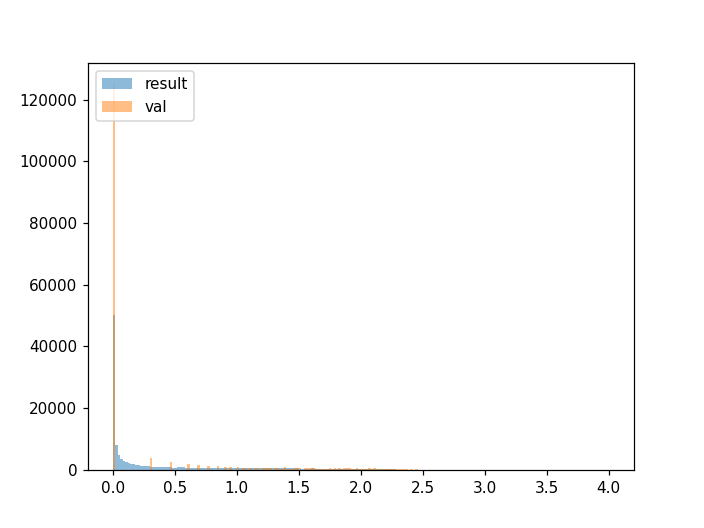

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


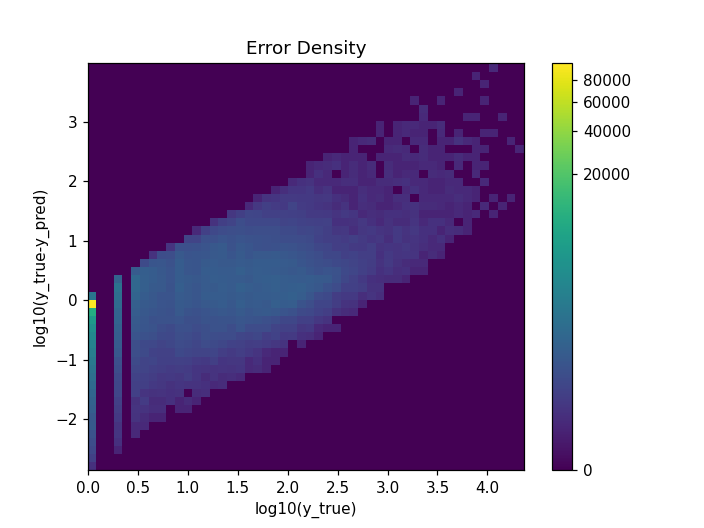

6


<IPython.core.display.Javascript object>


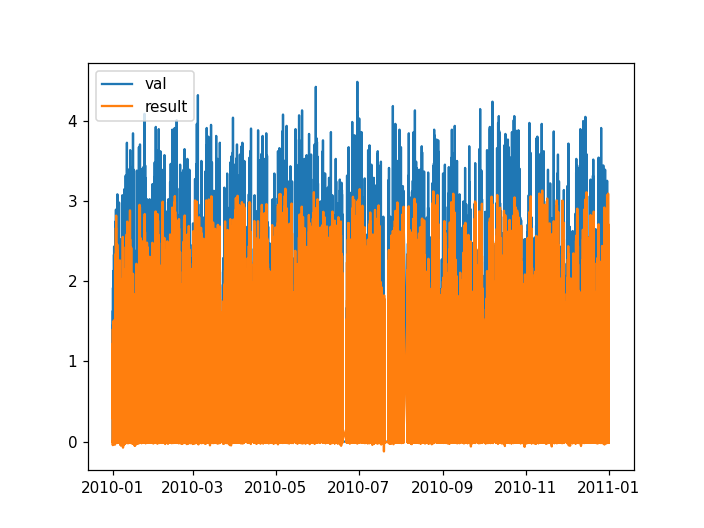

<IPython.core.display.Javascript object>


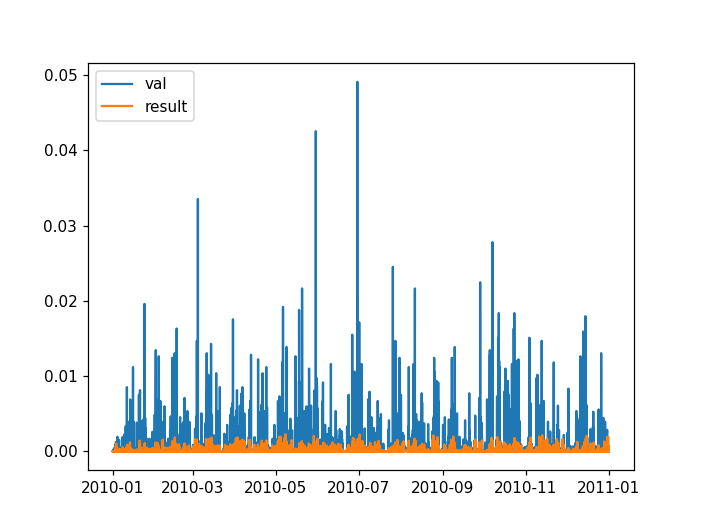

<IPython.core.display.Javascript object>


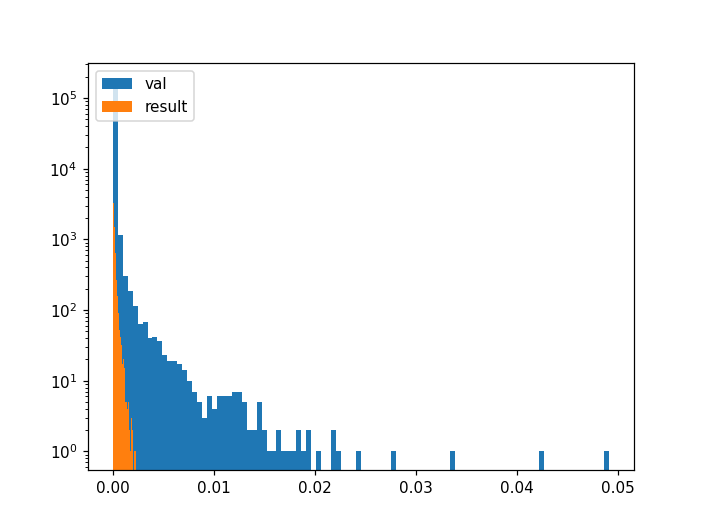

<IPython.core.display.Javascript object>


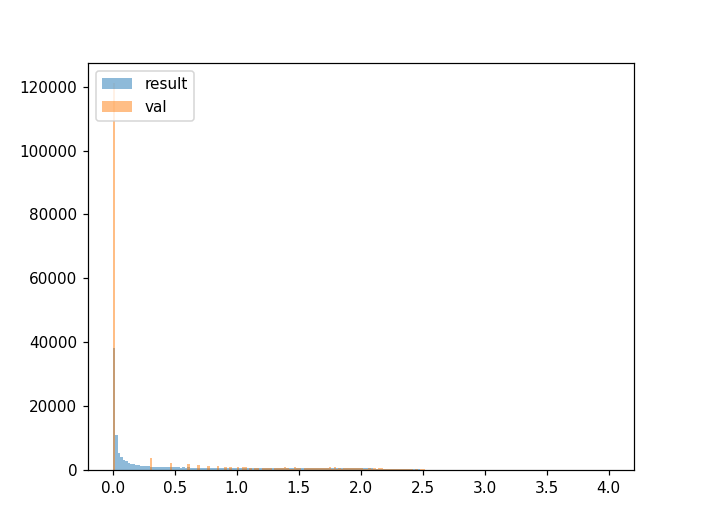

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


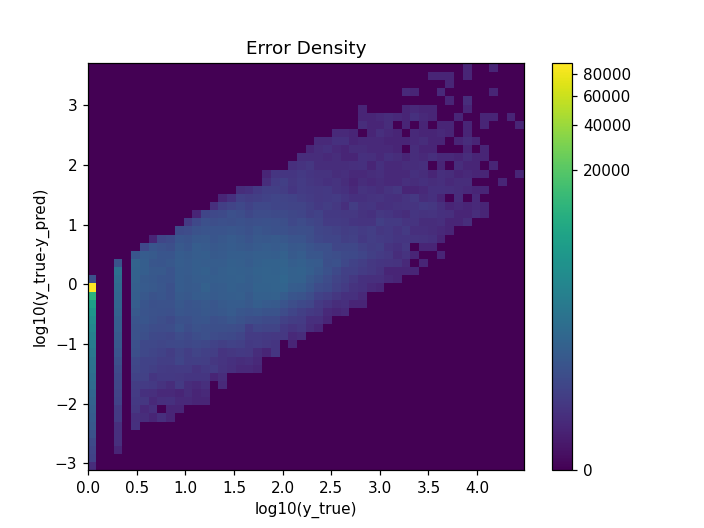

7


<IPython.core.display.Javascript object>


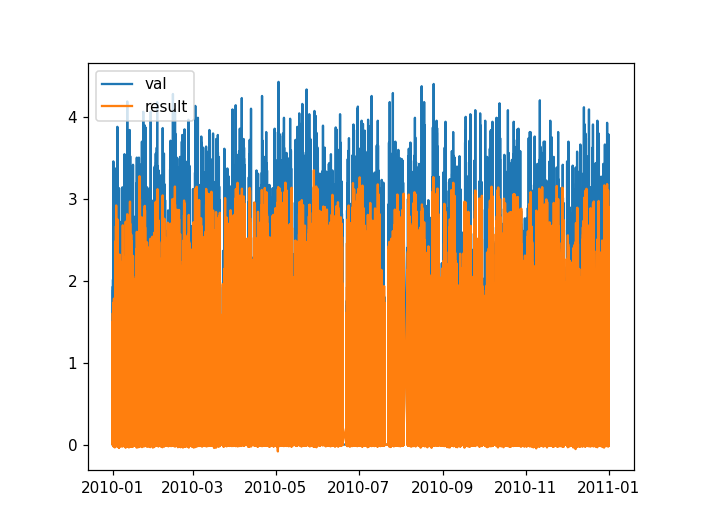

<IPython.core.display.Javascript object>


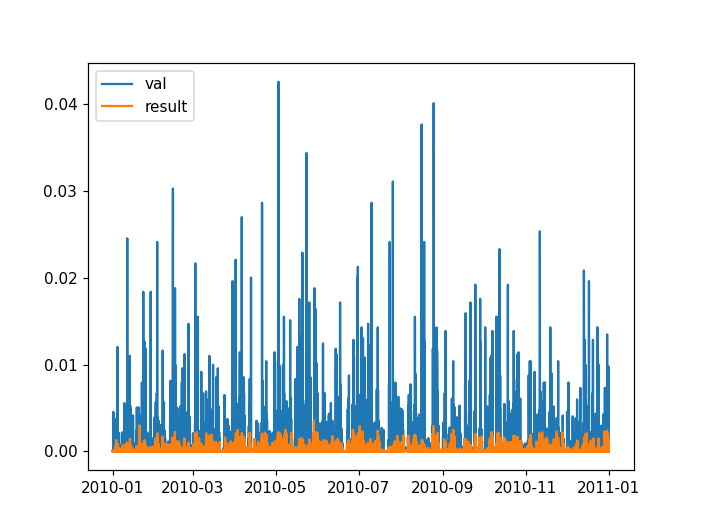

<IPython.core.display.Javascript object>


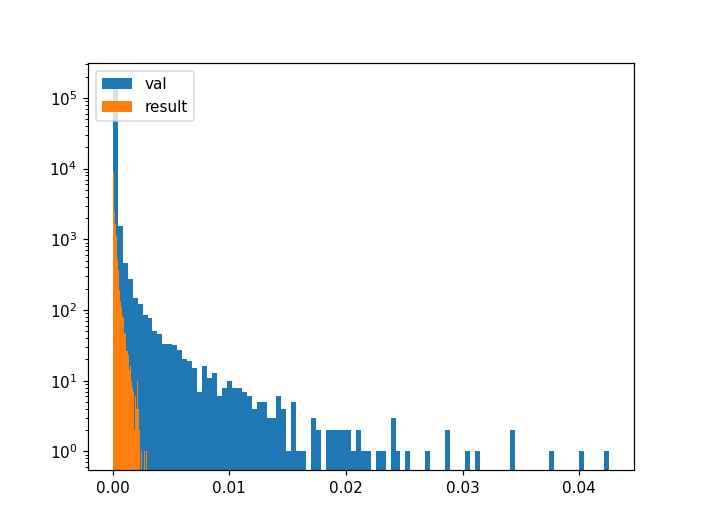

<IPython.core.display.Javascript object>


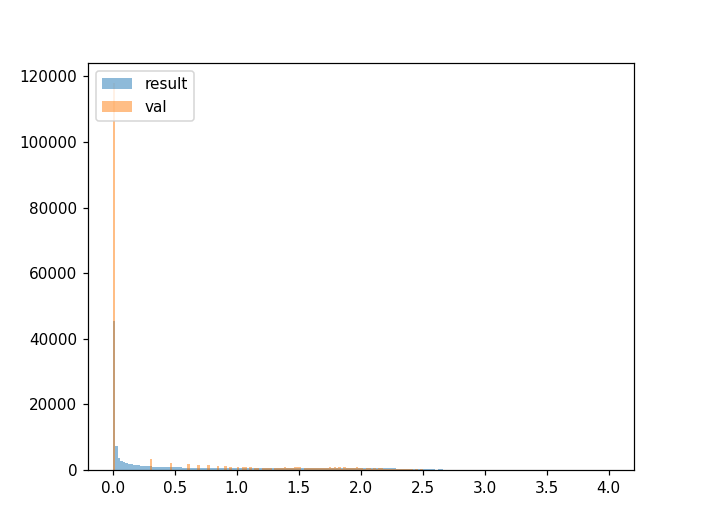

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


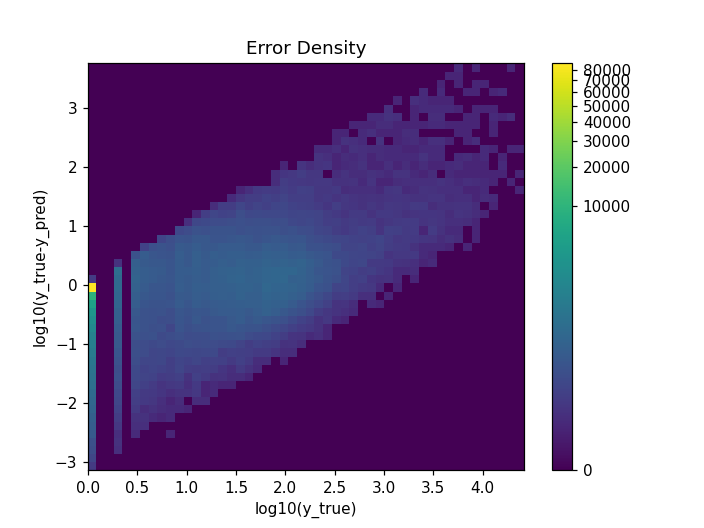

8


<IPython.core.display.Javascript object>


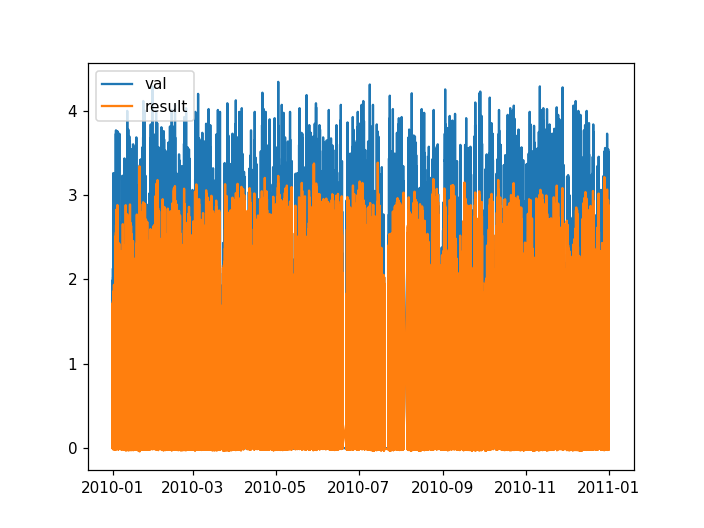

<IPython.core.display.Javascript object>


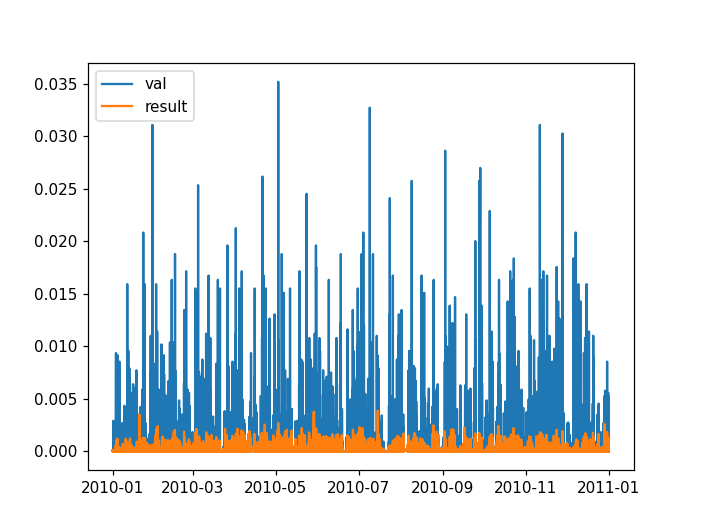

<IPython.core.display.Javascript object>


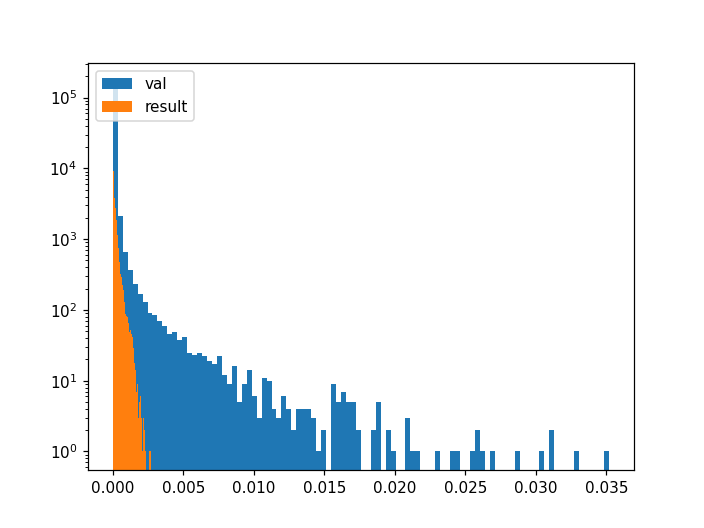

<IPython.core.display.Javascript object>


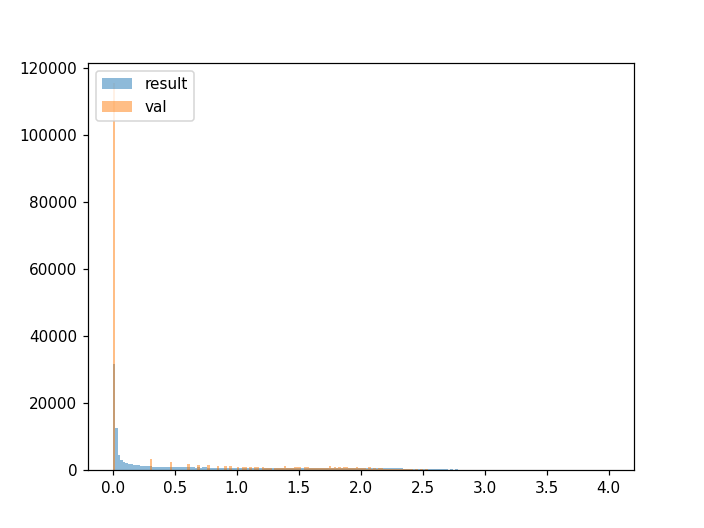

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


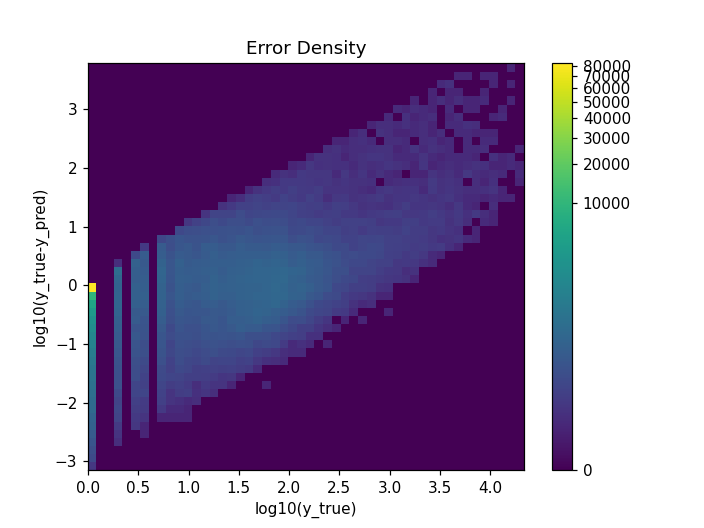

9


<IPython.core.display.Javascript object>


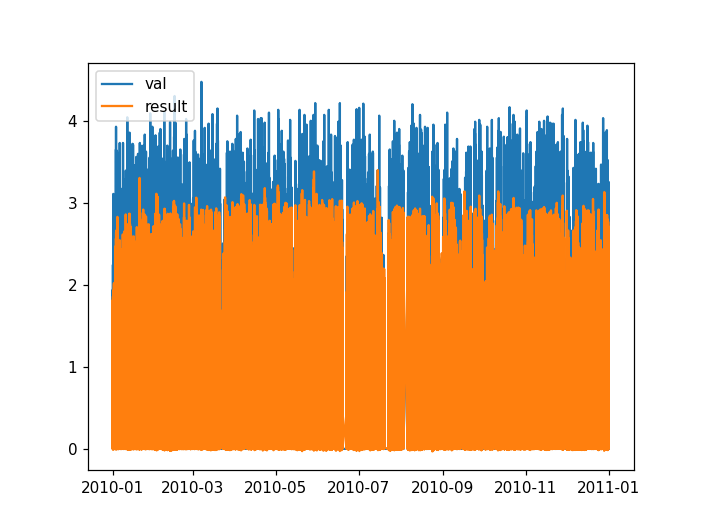

<IPython.core.display.Javascript object>


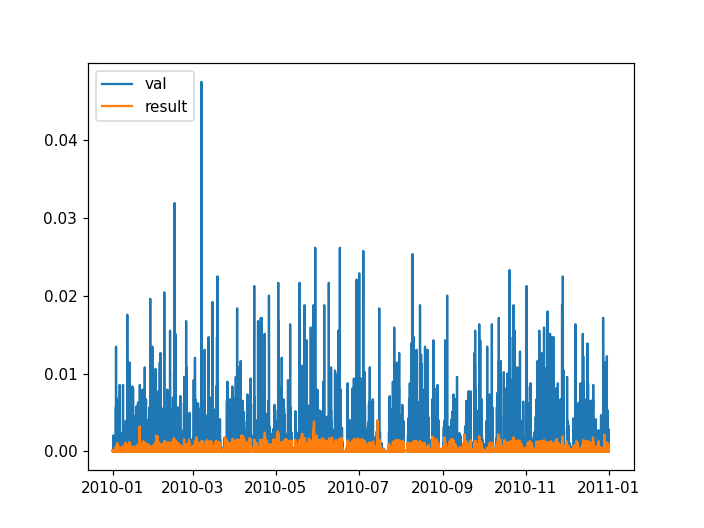

<IPython.core.display.Javascript object>


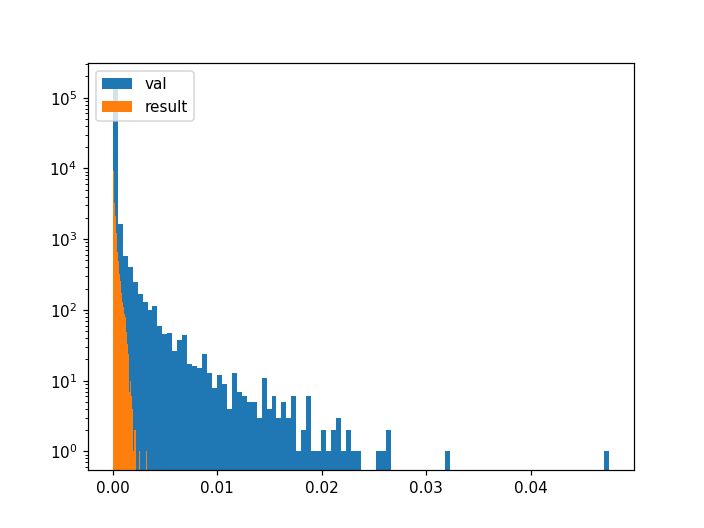

<IPython.core.display.Javascript object>


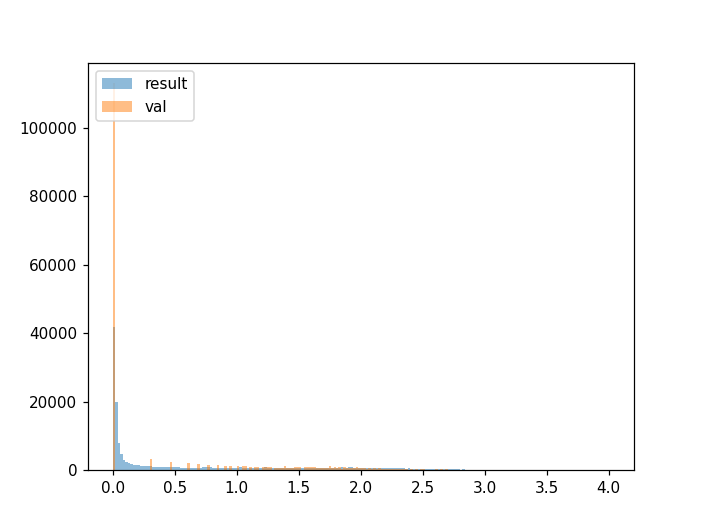

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


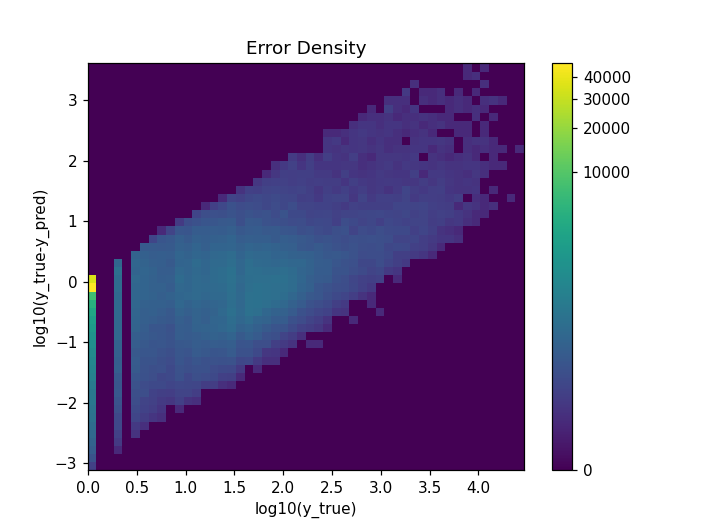

10


<IPython.core.display.Javascript object>


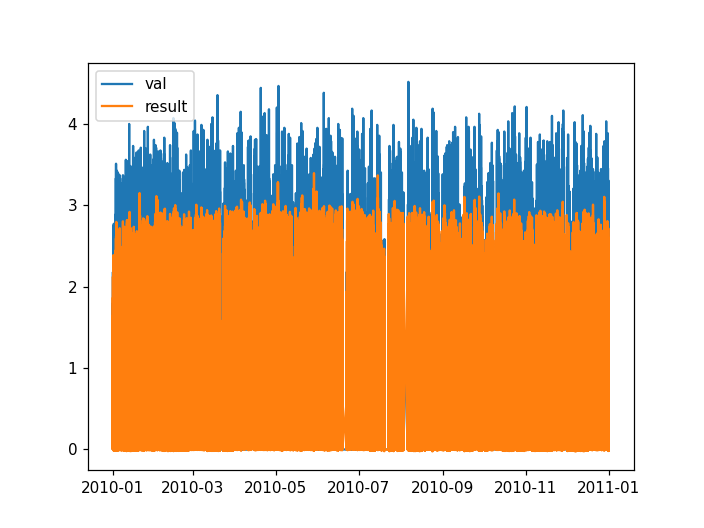

<IPython.core.display.Javascript object>


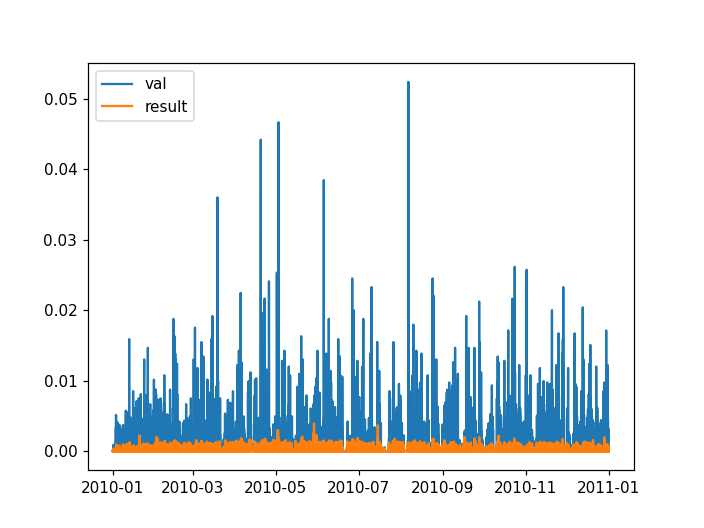

<IPython.core.display.Javascript object>


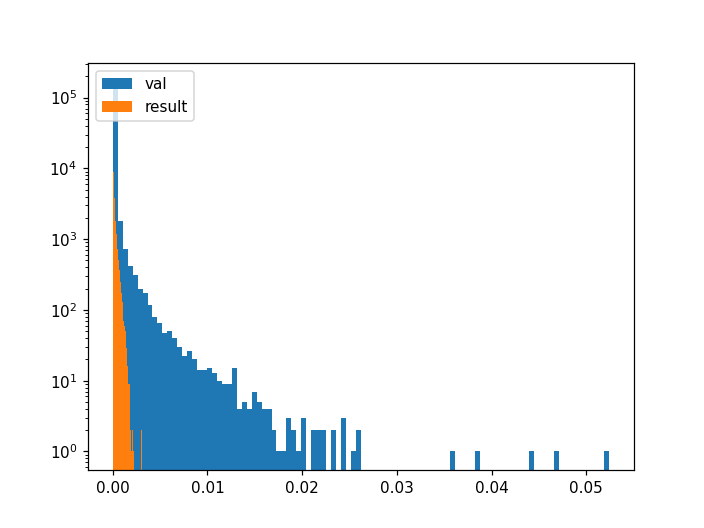

<IPython.core.display.Javascript object>


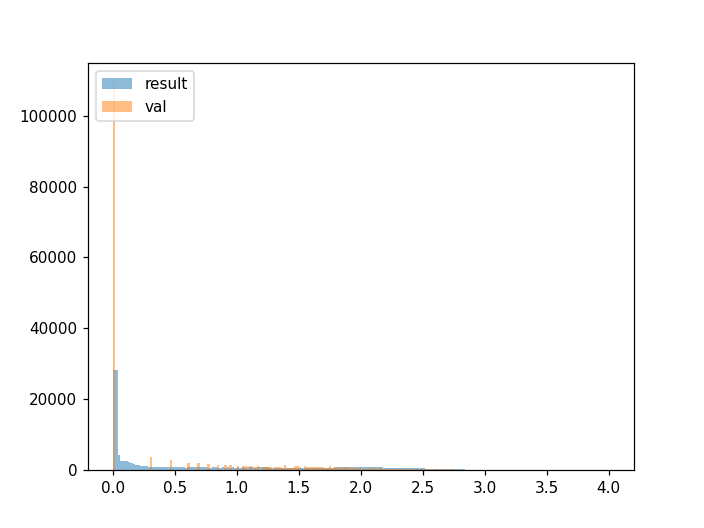

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>

11


<IPython.core.display.Javascript object>


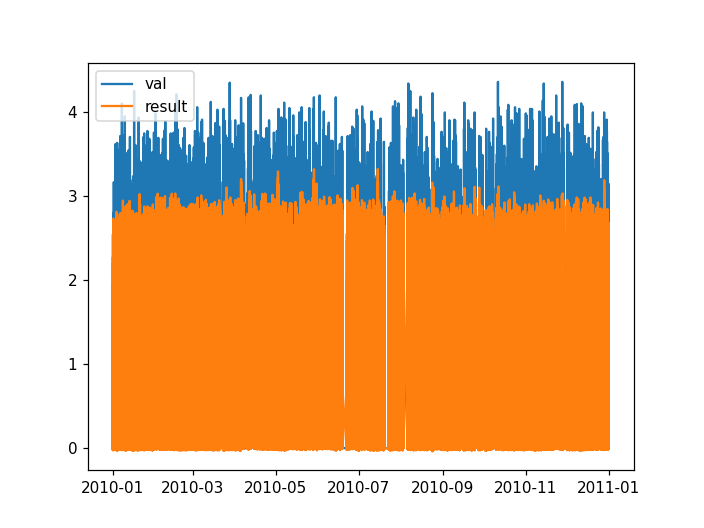

<IPython.core.display.Javascript object>


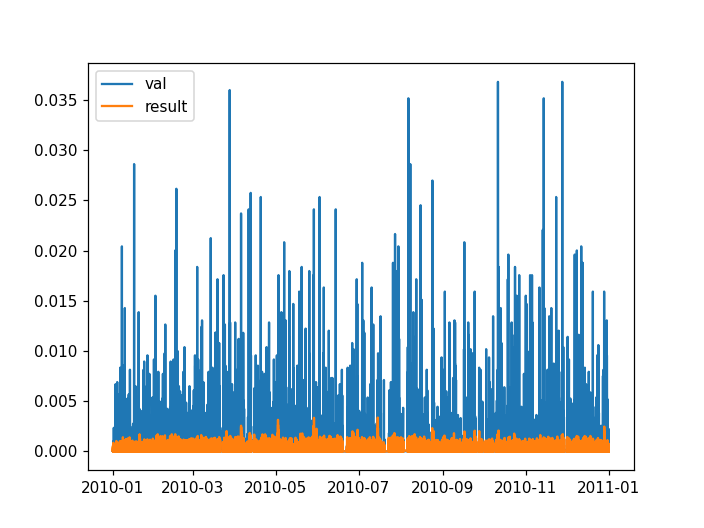

<IPython.core.display.Javascript object>


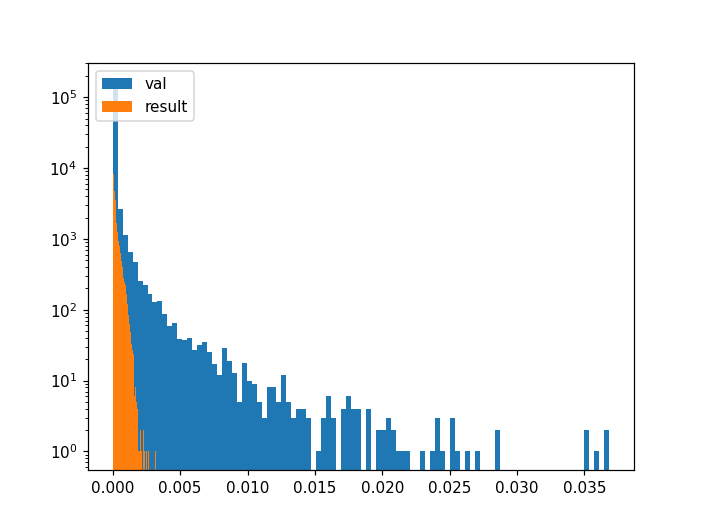

<IPython.core.display.Javascript object>


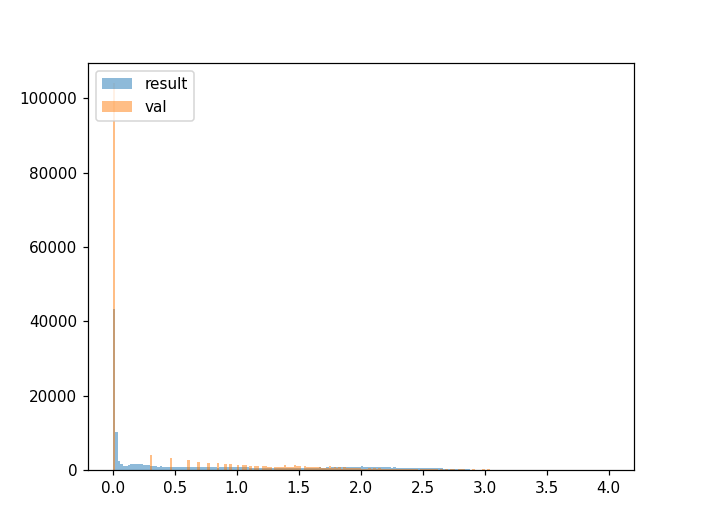

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


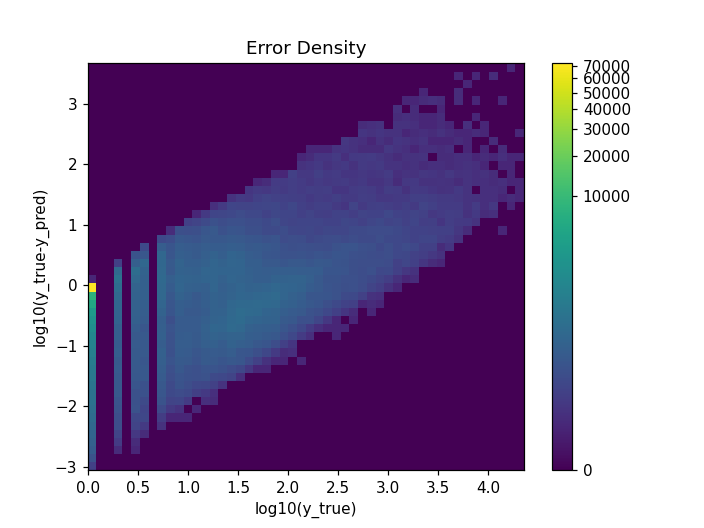

12


<IPython.core.display.Javascript object>


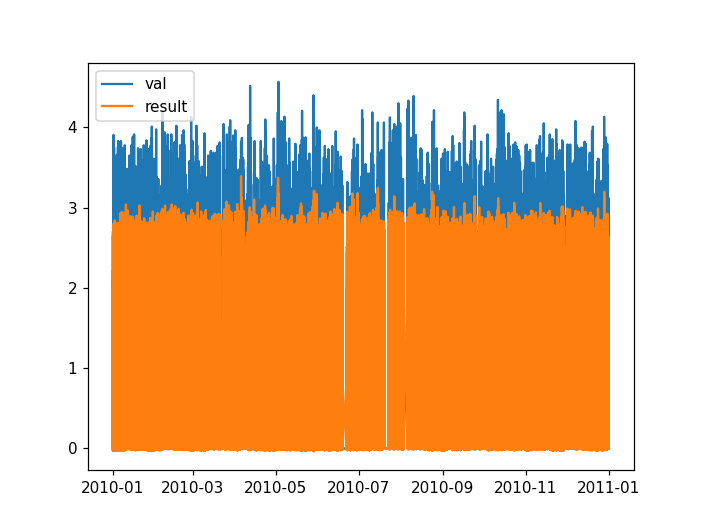

<IPython.core.display.Javascript object>


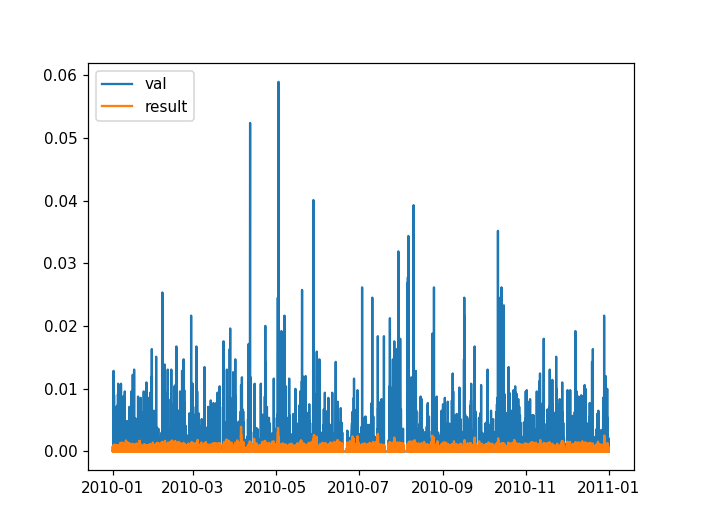

<IPython.core.display.Javascript object>


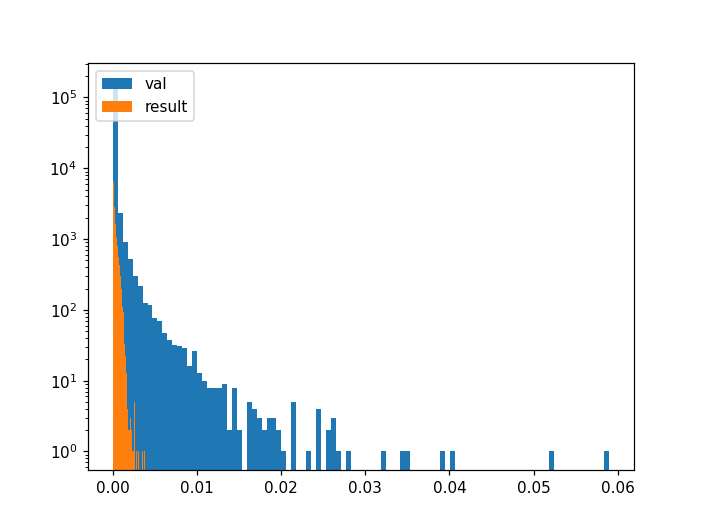

<IPython.core.display.Javascript object>


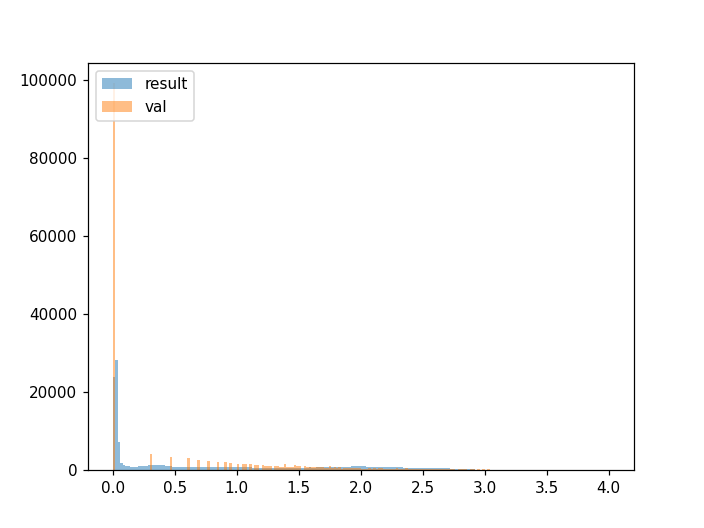

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


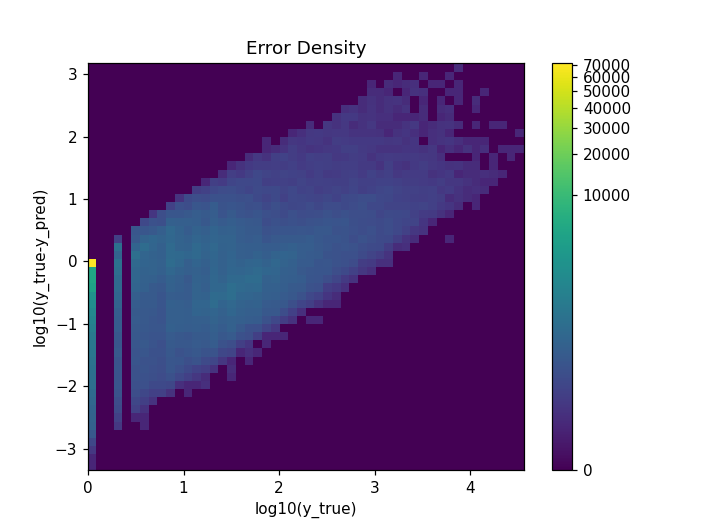

13


<IPython.core.display.Javascript object>


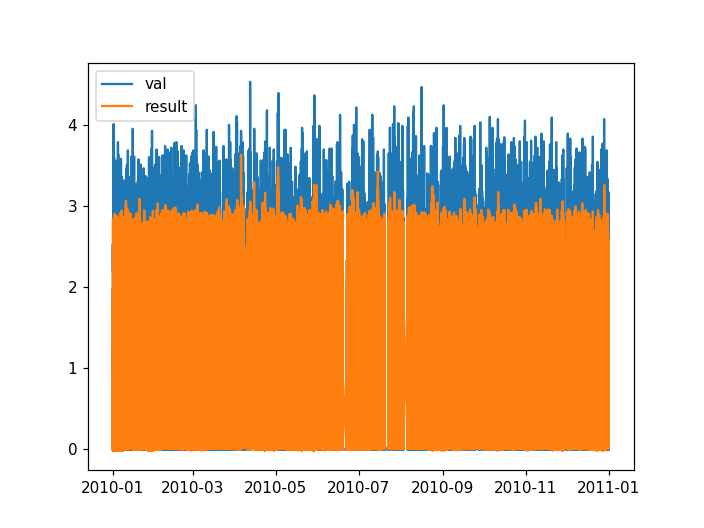

<IPython.core.display.Javascript object>


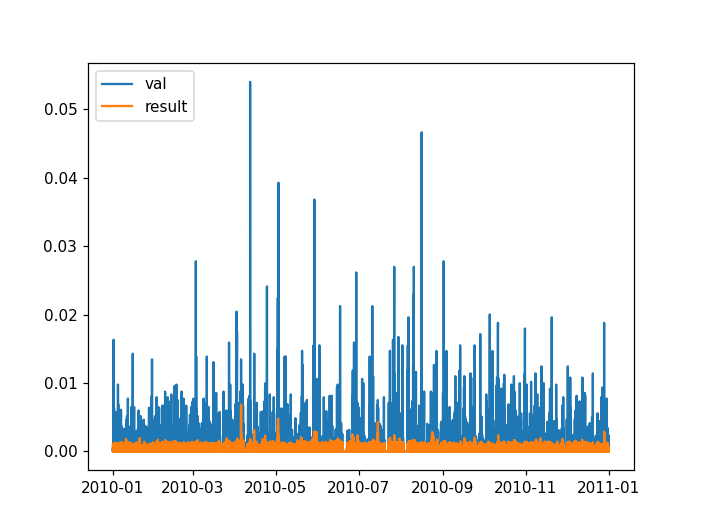

<IPython.core.display.Javascript object>


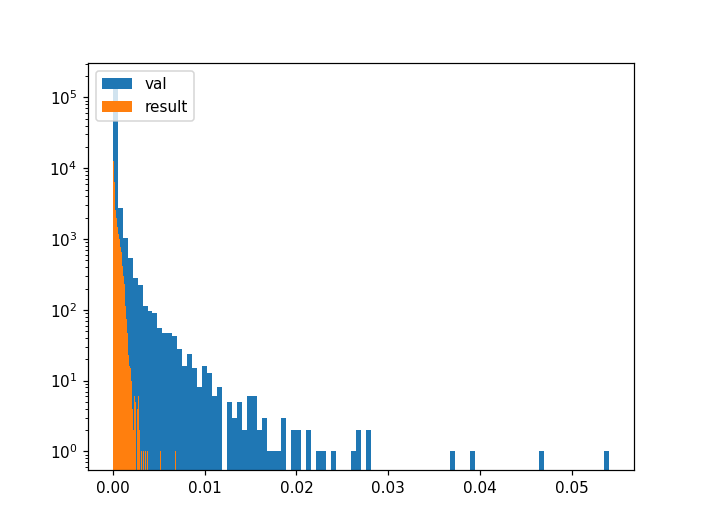

<IPython.core.display.Javascript object>


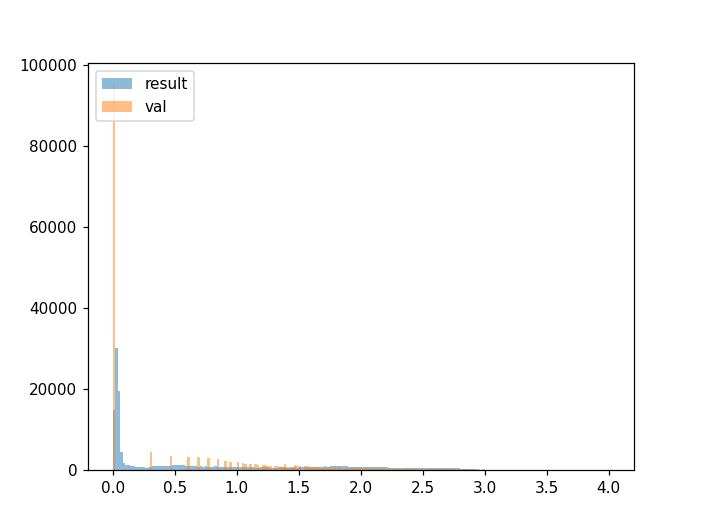

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


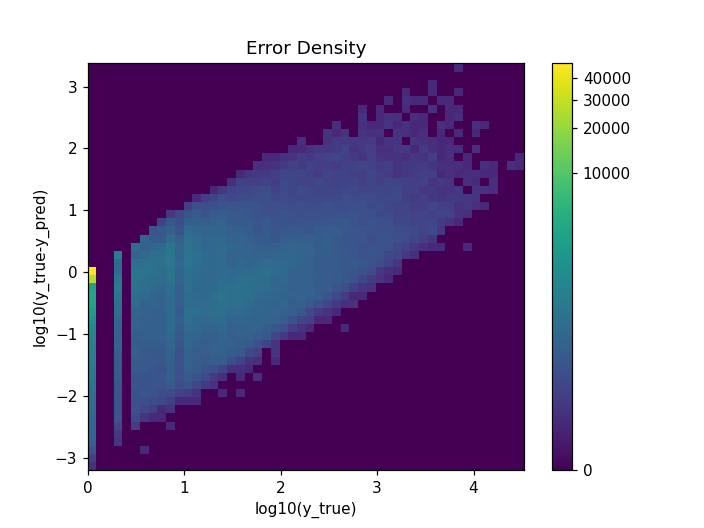

14


<IPython.core.display.Javascript object>


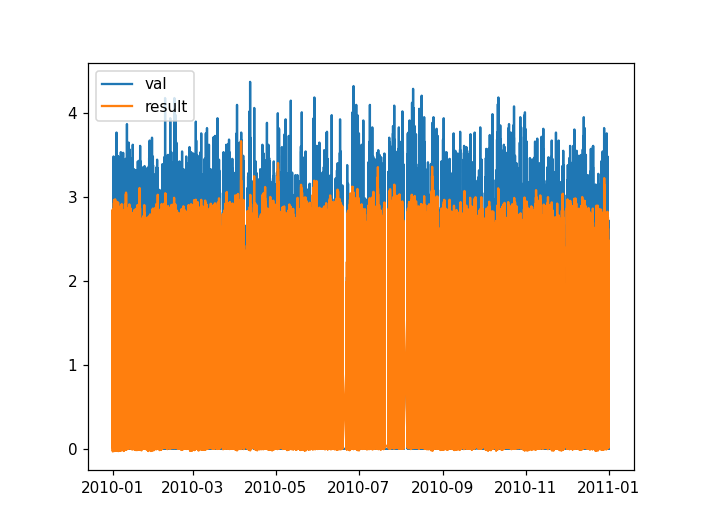

<IPython.core.display.Javascript object>


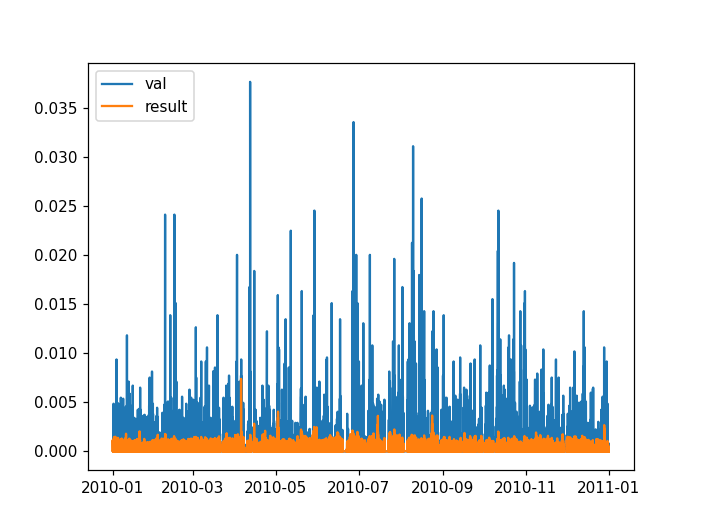

<IPython.core.display.Javascript object>


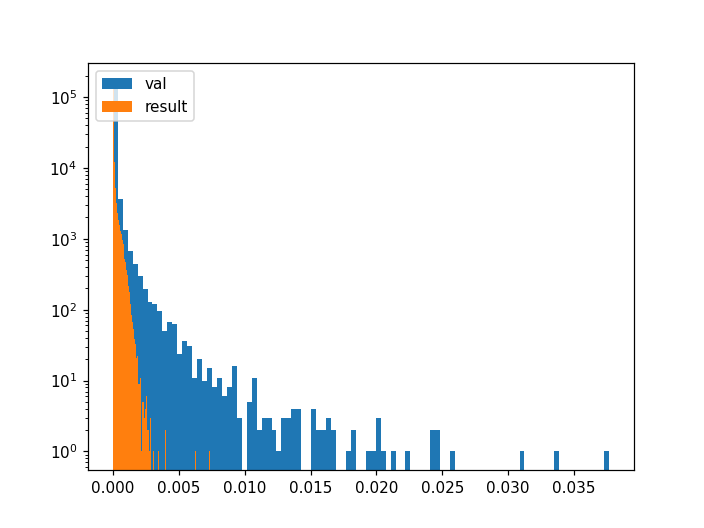

<IPython.core.display.Javascript object>


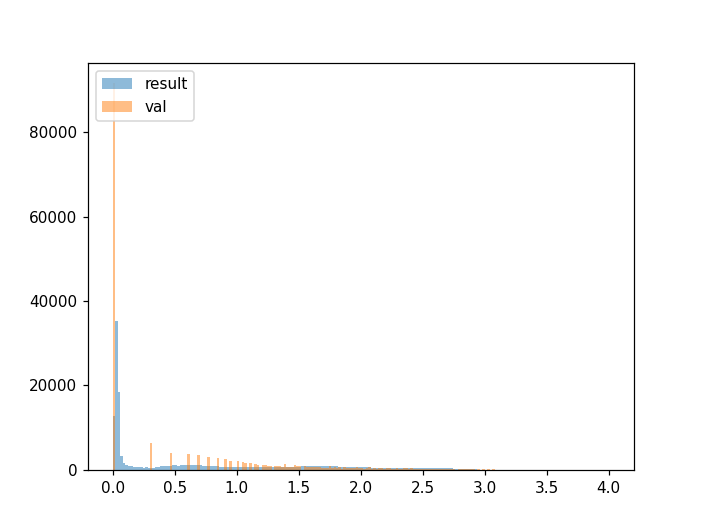

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


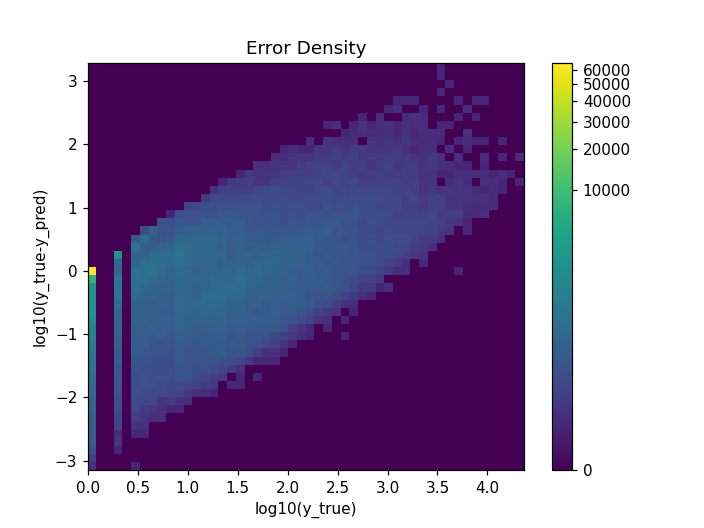

15


<IPython.core.display.Javascript object>


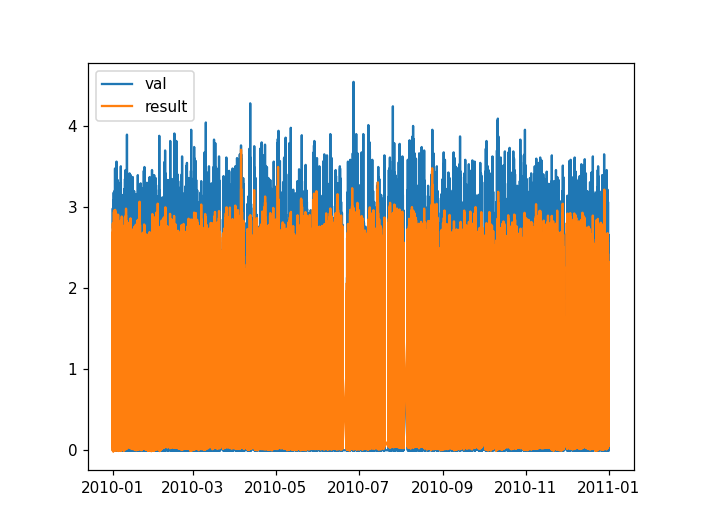

<IPython.core.display.Javascript object>


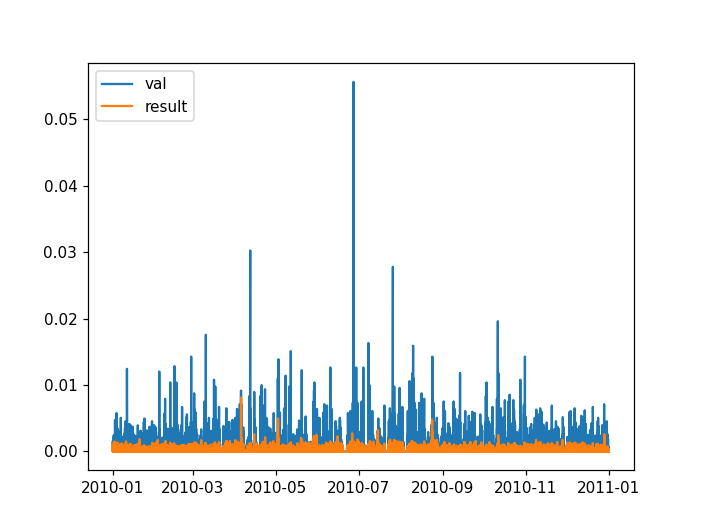

<IPython.core.display.Javascript object>


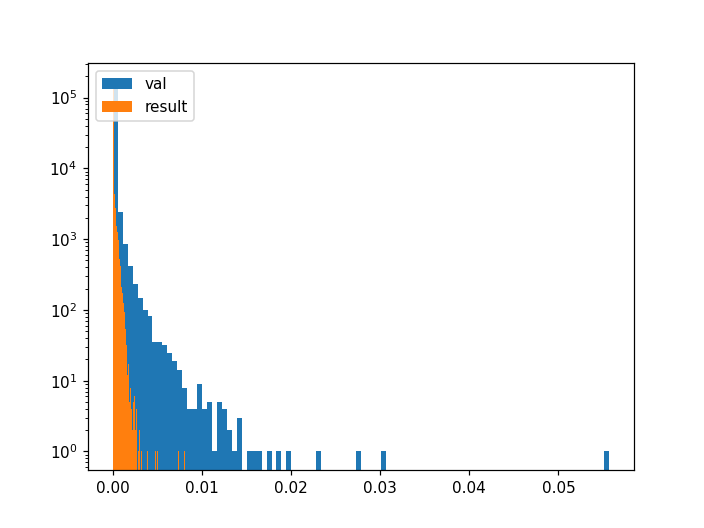

<IPython.core.display.Javascript object>


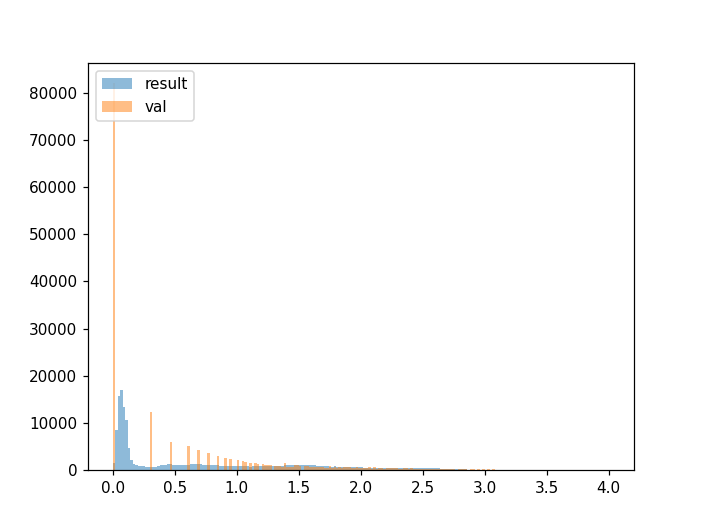

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


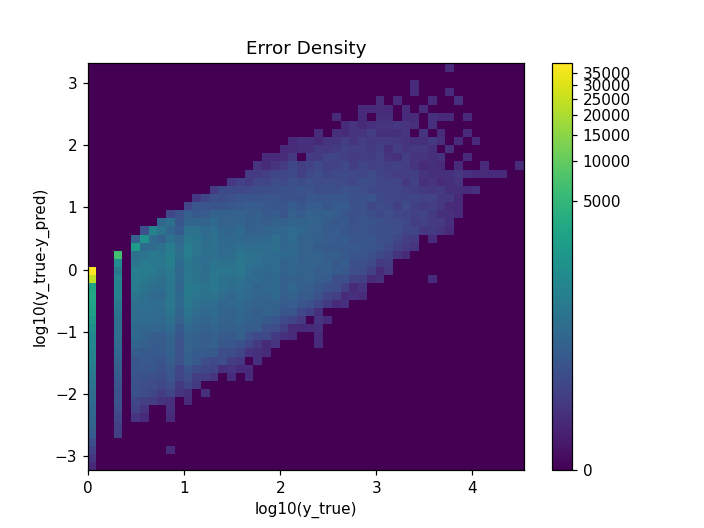

16


<IPython.core.display.Javascript object>


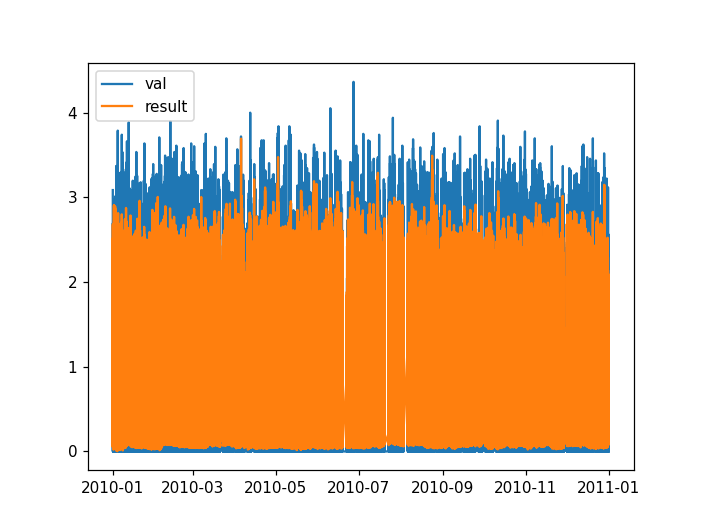

<IPython.core.display.Javascript object>


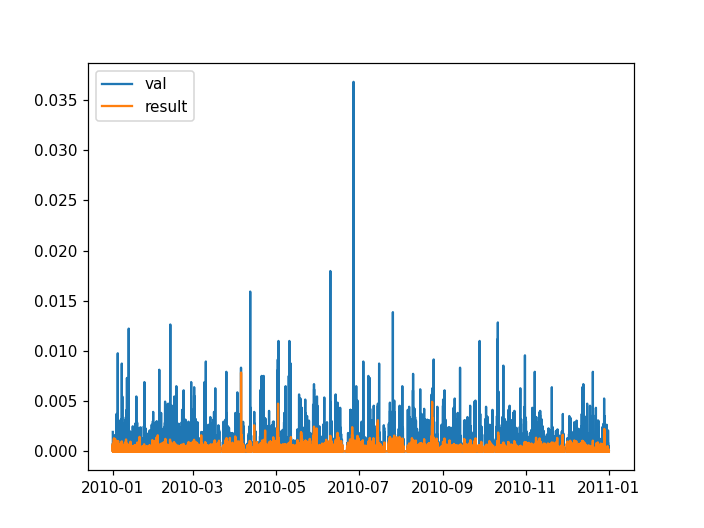

<IPython.core.display.Javascript object>


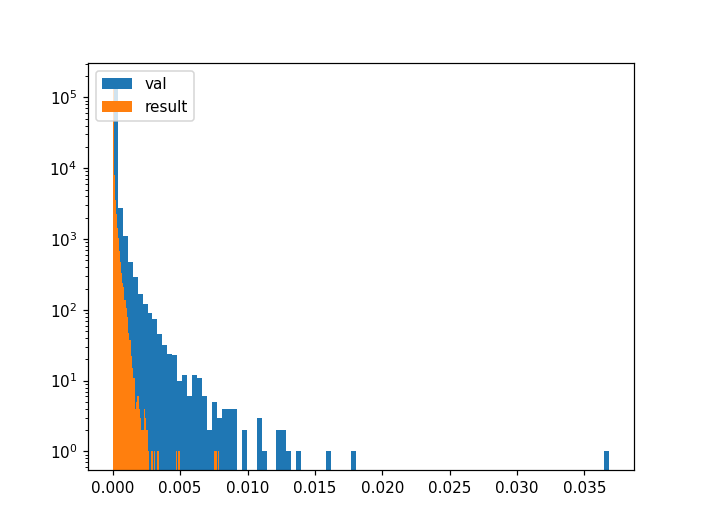

<IPython.core.display.Javascript object>

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>

17


<IPython.core.display.Javascript object>


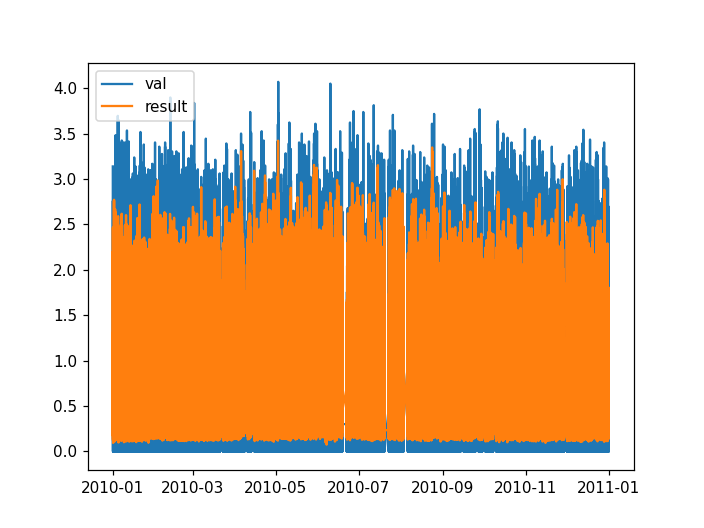

<IPython.core.display.Javascript object>


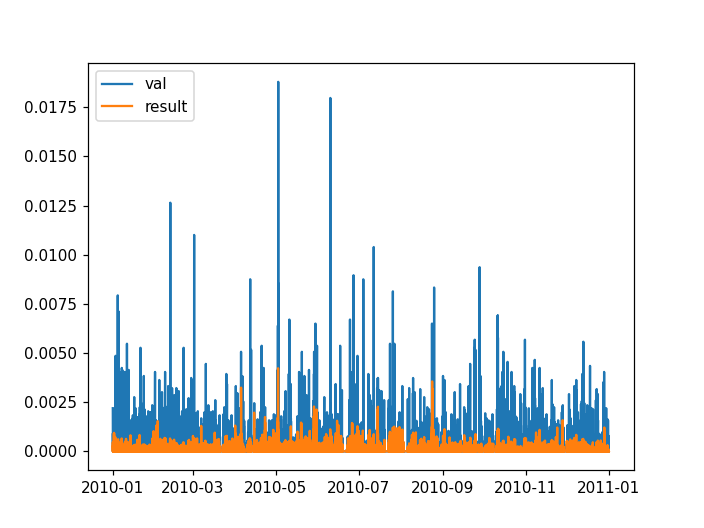

<IPython.core.display.Javascript object>


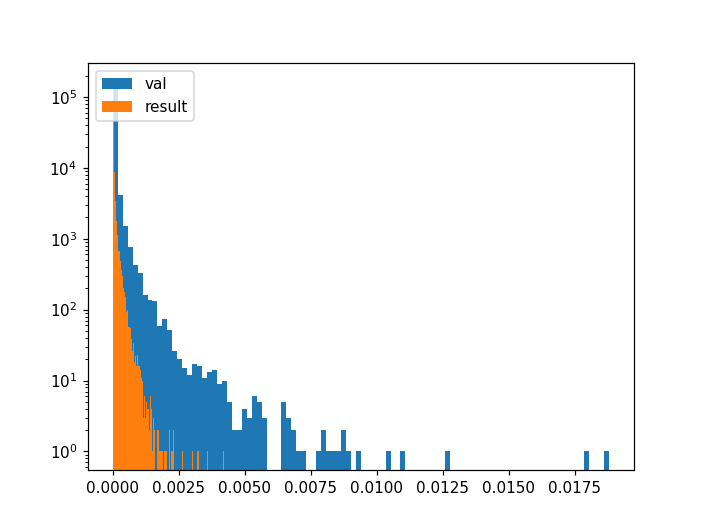

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


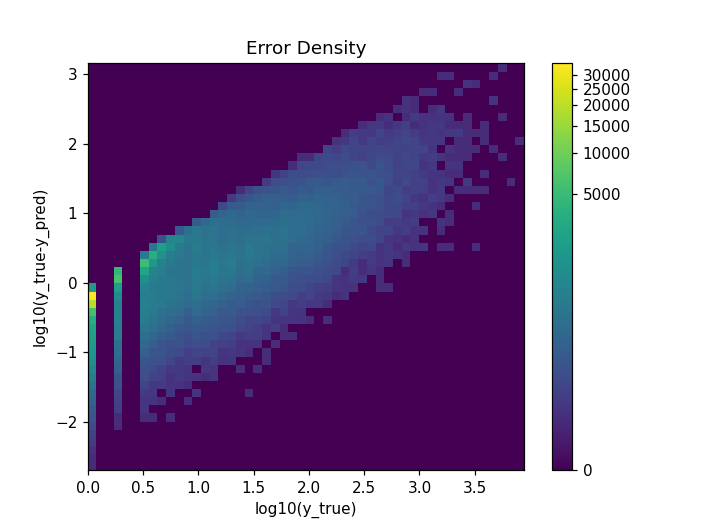

In [9]:

for k in range(0,19):
    print(k)
    df_results = pd.DataFrame(data=results[:,k], index = df_val.index)
    y_val_log = pd.DataFrame(data=temp.values[:,k], index = df_val.index)


    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = 0 #np.min(y_val_log.values)
    maxr = 4 #np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    gamma = 0.2#[0.8, 0.5, 0.3]
    errors= y_val_log.values-df_results.values
    print(y_val_log.values.shape, errors.shape)

    plt.figure();
    plt.hist2d(y_val_log.values[:,0], errors[:,0],
                  bins=50, norm=mcolors.PowerNorm(gamma))
    plt.colorbar()
    plt.title('Error Density')
    plt.xlabel('log10(y_true)')
    plt.ylabel('log10(y_true-y_pred)')

    plt.show()


In [5]:
filename='channel_counts_tail_loss_new_pipeline_59'
# model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

with open ('scalar_X_59_channel_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_59_channel_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)



5357/5357 [==============================] - 4s 824us/step - loss: 0.4148 - mean_squared_error: 0.2407
[0.41478243470191956, 0.24069762229919434]
